### This Implementation of GAN on a sysntehtic data and MNIST from scratch ad an Assignment in Sharif University of Technology

**!!! CAUTION !!!**

* To prevent Colab from disconnecting, insert the following javascript code into the inspector's console.


More info: 
[medium](https://medium.com/@shivamrawat_756/how-to-prevent-google-colab-from-disconnecting-717b88a128c0),
[stackoverflow](https://stackoverflow.com/questions/57113226/how-to-prevent-google-colab-from-disconnecting)
```
function ClickConnect(){
  console.log("Working"); 
  document
    .querySelector("#top-toolbar > colab-connect-button")
    .shadowRoot
    .querySelector("#connect")
    .click()
}
setInterval(ClickConnect,60000)
```
---


In [1]:
#################### Problem 00 ####################
# Remember to write your Name and Student No. in the first cell :D
####################### End ########################

In [ ]:
!pip install gpustat

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 78 kB 7.2 MB/s 
  Created wheel for gpustat: filename=gpustat-0.6.0-py3-none-any.whl size=12617 sha256=dad5b08d168567cc9efc1cb434f30bed6da23fa4645ce7c14706fcaae6bacde3
  Stored in directory: /root/.cache/pip/wheels/e6/67/af/f1ad15974b8fd95f59a63dbf854483ebe5c7a46a93930798b8
  Created wheel for nvidia-ml-py3: filename=nvidia_ml_py3-7.352.0-py3-none-any.whl size=19190 sha256=2ce7b40ad443e63844c0aaf16760441af898edf303d811448f374621c834eefd
  Stored in directory: /root/.cache/pip/wheels/df/99/da/c34f202dc8fd1dffd35e0ecf1a7d7f8374ca05fbcbaf974b83
Successfully built gpustat nvidia-ml-py3


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from tqdm.auto import tqdm

%matplotlib inline

In [ ]:
CUDA = torch.cuda.is_available()

device = torch.device("cuda:0" if CUDA else "cpu")

In [ ]:
# Reproducibility options

np.random.seed(0)
torch.manual_seed(0)

if CUDA:
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# 1) Auxiliary Modules

In [ ]:
class Reshape(nn.Module):
  """
  This module reshapes its input to `new_shape`
  """
  def __init__(self, new_shape):
    super().__init__()
    self.new_shape = new_shape

  def forward(self, x):
    return x.view(-1, *self.new_shape)

class NoiseGenerator(nn.Module):
  """
  This module generates `n` noises with `z_dim` dim from Normal distribution.
  """
  def __init__(self, z_dim):
    super().__init__()
    self.z_dim = z_dim

  def forward(self, n):
    # print(n)
    noise = torch.randn(n, *self.z_dim).to(device)
    return noise

# 2) GAN Training Structure (14 points)

Complete the following class to define the GAN training structure.

In [ ]:
class GANTrainer:
  """
  This class wraps the GAN training structure.

  Some arguments: \n
  `visualization_helper_fn`: Used to visualize model outputs at the end of each epoch. \n
  `G_loss_mode`: `{"logD" | "log(1-D)"}` Controls the loss function of the `generator`. \n
  `generator`: The generator. \n
  `discriminator`: The discriminator. The last layer is a LINEAR layer. \n
  """
  def __init__(self, train_dataloader:torch.utils.data.DataLoader, test_dataloader:torch.utils.data.DataLoader,
               noise_generator:NoiseGenerator, generator:nn.Module, discriminator:nn.Module,
               G_lr, D_lr,
               visualization_helper_fn, G_loss_mode):
    self.train_dataloader = train_dataloader
    self.test_dataloader = test_dataloader

    self.noise_generator = noise_generator.to(device)
    self.generator = generator.to(device)
    self.discriminator = discriminator.to(device)

    self.visualization_helper_fn = visualization_helper_fn
    self.G_loss_mode = G_loss_mode
    
    #################### Problem 01 (1 points) ####################
    # Define Adam optimizers with `G_lr` and `D_lr` learning rates.
    ####################################################
    self.opt_G = torch.optim.Adam(self.generator.parameters(), lr=G_lr, betas=(0.5, 0.999), weight_decay=0.001)
    self.opt_D = torch.optim.Adam(self.discriminator.parameters(), lr=D_lr, betas=(0.5, 0.999), weight_decay=0.001)
    ####################### End ########################

  def generate_samples(self, n):
    """
    This function generates `n` samples.
    """
    #################### Problem 02 (1 points) ####################
    # 1) Generate `n` noises
    # 1) Transform noises to samples
    ####################################################
    noise = self.noise_generator(n)
    fake_samples = self.generator(noise)
    ####################### End ########################
    return noise, fake_samples

  def G_step(self, n):
    """
    This function calculates `generator`'s loss for `n` samples.
    """
    #################### Problem 03 (1 points) ####################
    # 1) Generate `n` fake samples. put them in `x_fake`
    # 2) Compute discriminator `logits` for generated samples
    ####################################################
    _, x_fake = self.generate_samples(n)
    logits = self.discriminator(x_fake)
    ####################### End ########################

    if self.G_loss_mode == 'logD':
      #################### Problem 04 (2 points) ####################
      # Compute the `generator`'s loss when using `logD` as an objective.
      # `loss = mean(...)`
      #
      # CAUTION!!!!! --->>>> PAY ATTENTION TO THE SIGN OF LOSS
      ####################################################
      loss = -torch.mean(torch.log(logits))
      ####################### End ########################

    elif self.G_loss_mode == 'log(1-D)':
      #################### Problem 05 (2 points) ####################
      # Compute the `generator`'s loss when using `log(1-D)` as an objective.
      # `loss = mean(...)`
      #
      # CAUTION!!!!! --->>>> PAY ATTENTION TO THE SIGN OF LOSS
      ####################################################
      loss = torch.mean(torch.log(1 - logits))
      ####################### End ########################

    else:
      raise BaseException('Invalid generator train mode!!')
      
    return loss, x_fake

  def D_step(self, x_real):
    """
    This function calculates `discriminator`'s loss for `x_real` and `x_fake`.
    """
    #################### Problem 06 (1 points) ####################
    # 1) Generate `n` fake samples. What is the value of `n`? why? x_real.shape[0]. Because discriminator gets as many real images as fake ones which is n
    #  put them in `x_fake`
    # 2) Detach the generated samples. why? No need to
    ####################################################
    _, x_fake = self.generate_samples(x_real.shape[0])
    logits_fake = self.discriminator(x_fake)
    logits_real = self.discriminator(x_real)
    loss = torch.mean(-torch.log(logits_real) - torch.log(1 - logits_fake))
    ####################### End ########################

    return loss

  def train_loop(self, epoch, G_update_times, D_update_times, verbose=True):
    """
    This function iterates over `train_dataloader` and trains 
    `generator` and `discriminator` for ONE epoch.

    Some arguments: \n
    `G_update_times`: how many times to update `generator` on each batch \n
    `D_update_times`: how many times to update `discriminator` on each batch \n
    """
    train_G_loss = 0
    train_D_loss = 0

    for batch_idx, (x, _) in enumerate(tqdm(self.train_dataloader)):
      x = x.to(device)

      for _ in range(D_update_times):
        #################### Problem 08 (1 points) ####################
        # 1) Put `generator` in `eval` mode
        # 2) Put `discriminator` in `train` mode
        # 3) Zero out `opt_D`'s gradients
        # 4) Compute `discriminator`'s loss (`D_loss`); use `D_step`
        # 5) Backpropagate `D_loss`
        # 6) Update ``discriminator` parameters
        ####################################################
        self.generator.eval()
        self.discriminator.train()
        self.opt_D.zero_grad()
        D_loss = self.D_step(x)
        D_loss.backward()
        self.opt_D.step()
        ####################### End ########################

      for _ in range(G_update_times):
        #################### Problem 09 (1 points) ####################
        # 1) Put `generator` in `train` mode
        # 2) Put `discriminator` in `eval` mode
        # 3) Zero out `opt_G`'s gradients
        # 4) Compute `generator`'s loss (`G_loss`); use `G_step`
        # 5) Backpropagate `G_loss`
        # 6) Update `generator` parameters
        ####################################################
        self.generator.train()
        self.discriminator.eval()
        self.opt_G.zero_grad()
        G_loss, fake = self.G_step(x.shape[0])
        G_loss.backward()
        self.opt_G.step()
        ####################### End ########################

      train_D_loss += D_loss.item() * x.shape[0]
      train_G_loss += G_loss.item() * x.shape[0]

      if verbose and batch_idx % LOG_INTERVAL == 0:
          print('Train | Epoch: {} [{}/{}]\t\tD-Loss: {:.6f}\tG-Loss: {:.6f}'
          .format(epoch, batch_idx * len(x), len(self.train_dataloader) * BATCH_SIZE, D_loss, G_loss))

    train_D_loss /= len(self.train_dataloader) * BATCH_SIZE
    train_G_loss /= len(self.train_dataloader) * BATCH_SIZE
    if verbose:
        print('====> Train | Epoch: {} \t | \tAverage D-loss: {:.4f} \t | \tAverage G-loss: {:.4f}'.format(epoch, train_D_loss, train_G_loss,))
    return train_G_loss, train_D_loss
  
  def test(self, verbose=True):
    """
    This function iterates over `test_dataloader` and
    reports `generator` and `discriminator` losses.
    """
    self.discriminator.eval()
    self.generator.eval()

    test_G_loss = 0
    test_D_loss = 0

    with torch.no_grad():
      for x, _ in self.test_dataloader:
        x = x.to(device)

        #################### Problem 10 (1 points) ####################
        # 1) Put `generator` in `eval` mode
        # 2) Put `discriminator` in `train` mode
        # 4) Compute `discriminator`'s loss; use `D_step`
        ####################################################
        self.generator.eval()
        self.discriminator.train()
        D_loss = self.D_step(x)
        ####################### End ########################

        #################### Problem 11 (1 points) ####################
        # 1) Put `generator` in `train` mode
        # 2) Put `discriminator` in `eval` mode
        # 4) Compute `generator`'s loss; use `G_step(n)` where `n = x.shape[0]`
        ####################################################
        self.generator.train()
        self.discriminator.eval()
        G_loss, fake = self.G_step(x.shape[0])
        ####################### End ########################

        test_D_loss += D_loss.item() * x.shape[0]
        test_G_loss += G_loss.item() * x.shape[0]

            
    test_D_loss /= len(self.test_dataloader) * BATCH_SIZE
    test_G_loss /= len(self.test_dataloader) * BATCH_SIZE
    if verbose:
      print('====> Test | Average D-loss: {:.4f} \t | \tAverage G-loss: {:.4f}'.format(test_D_loss, test_G_loss,))
    return test_G_loss, test_D_loss

  def run(self, n_epoch, G_update_times=1, D_update_times=1, verbose=True):
    """
    This function will optimize parameters of `generator` and `discriminator`
    for `n_epoch` epochs on `train_dataloader` dataset and validate it on
    `test_dataloader`. At the end of each epoch, `visualization_helper_fn`
    will be called to visualize the GAN behavior.


    Some arguments: \n
    `G_update_times`: how many times to update `generator` on each batch \n
    `D_update_times`: how many times to update `discriminator` on each batch \n
    """
    # !gpustat
    for epoch in range(1, n_epoch + 1):
        self.train_loop(epoch, G_update_times, D_update_times, verbose)
        self.test(verbose)
        self.visualization_helper_fn(self)
        # if epoch == 1:
          # !gpustat


---

# 3) Part 1 - 2D Toy Dataset

In the first part, we will learn density of toy datasets to examine GAN training.

## 3.1) Helper functions
These are functions used in visulization.

In [ ]:
def toy2d_density_plot(samples, title, ax=None):
  """
  This function plots the distribution of `samples`.
  """
  fig = None
  if ax is None:
    fig, ax = plt.subplots(1, figsize=(3, 3))

  samples = samples.detach().cpu().numpy()
  sns.kdeplot(samples[:, 0], samples[:, 1], shade=True, ax=ax)
  ax.set_title(title)

  if fig is not None:
    plt.show()

In [ ]:
def toy2d_decision_boundary_plot(samples, labels, title, ax=None):
  """
  This function plots regions corresponding to each label value. Can be used to
  understand the decision boundary of `discriminator`.
  """
  fig = None
  if ax is None:
    fig, ax = plt.subplots(1, figsize=(3, 3))

  samples = samples.detach().cpu().numpy()
  labels = labels.detach().cpu().numpy()

  sns.scatterplot(
      x=samples[:, 0],
      y=samples[:, 1],
      hue=labels,
      legend='brief',
      marker='.',
      ax=ax
      )
  ax.set_title(title)

  if fig is not None:
    plt.show()

In [ ]:
def toy2d_visulization_helper_fn(trainer: GANTrainer):
  """
  Used to visualize generator's distribution and 
  discriminator's decision boundary.
  """
  rows = 1
  cols = 2
  fig, axs = plt.subplots(rows, cols, squeeze=False, figsize=(3 * cols, 3 * rows))

  _, fake_samples = trainer.generate_samples(10000)
  random_samples = (torch.rand((10000, 2)) - .5) * 3 * R
  random_samples = random_samples.to(device)
  with torch.no_grad():
    disc_labels = torch.sigmoid(trainer.discriminator(random_samples))[:, 0]
  
  toy2d_density_plot(fake_samples, 'generator distribution', axs[0][0])
  toy2d_decision_boundary_plot(random_samples, disc_labels, 'discriminator decision boundary', axs[0][1])

  plt.show()

## 3.2) Defining Toy Datasets

In [ ]:
class Toy2dCircularGaussiansDataset(torch.utils.data.Dataset):
  """
  This dataset puts 'n_modes` gaussians on a circle with 'r' radius.
  """
  def __init__(self, r=10, std_dev=1, n_modes=20, n_samples=10000):
    self.r = r
    self.std_dev = std_dev
    self.n_modes = n_modes
    
    self.mode_ids = torch.randint(high=self.n_modes, size=(n_samples,))
    theta = 2 * np.pi / n_modes * self.mode_ids
    mu = self.r * torch.stack([torch.cos(theta), torch.sin(theta)], dim=1)
    self.samples = torch.randn((n_samples, 2)) * self.std_dev + mu
  
  def __getitem__(self, i):  
    return self.samples[i], self.mode_ids[i]

  def __len__(self):
    return self.samples.shape[0]

In [ ]:
class Toy2dGridGaussiansDataset(torch.utils.data.Dataset):
  """
  This dataset puts 'n_modes^2` gaussians on a grid with '2r' width and height.
  """
  def __init__(self, r=1, std_dev=1, n_modes=5, n_samples=10000):
    self.r = r
    self.std_dev = std_dev
    self.n_modes = n_modes
    assert n_modes >= 2
    
    self.mode_ids = torch.randint(high=self.n_modes, size=(n_samples, 2))
    mu = self.mode_ids * (2 * self.r / (self.n_modes - 1)) - self.r
    self.samples = torch.randn((n_samples, 2)) * self.std_dev + mu
  
  def __getitem__(self, i):  
    return self.samples[i], self.mode_ids[i]

  def __len__(self):
    return self.samples.shape[0]

## 3.3) Dataset Loading


You can load either `Toy2dCircularGaussiansDataset` or `Toy2dGridGaussiansDataset` to play with it; but the question at the end of this part is for the `Toy2dGridGaussiansDataset` dataset.

In [ ]:
# parameters of toy dataset
TRAIN_SIZE = 60000
TEST_SIZE = 10000
R = 1

# ############### To use `Toy2dCircularGaussiansDataset` ############### #
# N_MODES = 8
# STD_DEV = 25e-3
# toy2d_train_dataset = Toy2dCircularGaussiansDataset(R, STD_DEV, N_MODES, TRAIN_SIZE)
# toy2d_test_dataset = Toy2dCircularGaussiansDataset(R, STD_DEV, N_MODES, TEST_SIZE)
# ###################################################################### #

# ################# To use `Toy2dGridGaussiansDataset` ################# #
N_MODES = 4
STD_DEV = 1e-4
toy2d_train_dataset = Toy2dGridGaussiansDataset(R, STD_DEV, N_MODES, TRAIN_SIZE)
toy2d_test_dataset = Toy2dGridGaussiansDataset(R, STD_DEV, N_MODES, TEST_SIZE)
# ###################################################################### #

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


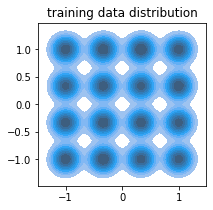

In [ ]:
# Ploting dataset distribution to see it :)

toy2d_density_plot(toy2d_train_dataset[:10000][0], 'training data distribution')

## 3.4) Defining Models (4 points)

In [ ]:
# Generator part
#################### Problem 12 (2 points) ####################
# 1) Define `toy2d_noise_generator`.
# 2) Define `toy2d_generator` network.
#    Use `Tanh` for intermediate layers.
#    Use `Linear` for the last layer.
####################################################
toy2d_noise_generator = NoiseGenerator([32])

toy2d_generator = nn.Sequential(    
    nn.Linear(32, 2048),
    nn.Tanh(),
    nn.Linear(2048, 4096),
    nn.Tanh(),
    nn.Linear(4096, 8192),
    nn.Tanh(),
    nn.Linear(8192, 32),
    nn.Tanh(),
    nn.Linear(32, 2)
)
####################### End ########################

# Discriminator part
#################### Problem 13 (2 points) ####################
# 1) Define `toy2d_discriminator` network.
#    Use `Tanh` for intermediate layers.
#    Use `Linear` for the last layer. why? Because in the last layer we are doing classification and for classification we do fully connected to consider all possibilities
####################################################
toy2d_discriminator = nn.Sequential(
    nn.Linear(2, 32),
    nn.Tanh(),
    nn.Linear(32, 8192),
    nn.Tanh(),
    nn.Linear(8192, 4096),
    nn.Tanh(),
    nn.Linear(4096, 2048),
    nn.Tanh(),
    nn.Linear(2048, 32),
    nn.Tanh(),
    nn.Linear(32, 1),
    nn.Sigmoid()
)
####################### End ########################

toy2d_generator = toy2d_generator.to(device)
toy2d_discriminator = toy2d_discriminator.to(device)

print(toy2d_generator)
print(toy2d_discriminator)

Sequential(
  (0): Linear(in_features=32, out_features=2048, bias=True)
  (1): Tanh()
  (2): Linear(in_features=2048, out_features=4096, bias=True)
  (3): Tanh()
  (4): Linear(in_features=4096, out_features=8192, bias=True)
  (5): Tanh()
  (6): Linear(in_features=8192, out_features=32, bias=True)
  (7): Tanh()
  (8): Linear(in_features=32, out_features=2, bias=True)
)
Sequential(
  (0): Linear(in_features=2, out_features=32, bias=True)
  (1): Tanh()
  (2): Linear(in_features=32, out_features=8192, bias=True)
  (3): Tanh()
  (4): Linear(in_features=8192, out_features=4096, bias=True)
  (5): Tanh()
  (6): Linear(in_features=4096, out_features=2048, bias=True)
  (7): Tanh()
  (8): Linear(in_features=2048, out_features=32, bias=True)
  (9): Tanh()
  (10): Linear(in_features=32, out_features=1, bias=True)
  (11): Sigmoid()
)


## 3.5) Train

### 3.5.1) Batching Data

In [ ]:
BATCH_SIZE = 1024

toy2d_dataloader_kwargs = {
    'batch_size': BATCH_SIZE, 
    'shuffle': True,
    'pin_memory': True,
    'num_workers': 0,
}

toy2d_train_dataloader = torch.utils.data.DataLoader(toy2d_train_dataset, **toy2d_dataloader_kwargs)
toy2d_test_dataloader = torch.utils.data.DataLoader(toy2d_test_dataset, **toy2d_dataloader_kwargs)

### 3.5.2) Run (2 points)

In [ ]:
LOG_INTERVAL = 50
#################### Problem 14 (1 points) ####################
# Tune `generator` and `discriminator` learning rates
# and also the `G_LOSS_MODE`.
####################################################
TOY2D_G_LEARNING_RATE = 1e-4
TOY2D_D_LEARNING_RATE = 1e-4
G_LOSS_MODE = "log(1-D)"
####################### End ########################

toy2d_trainer = GANTrainer(toy2d_train_dataloader, toy2d_test_dataloader,
                           toy2d_noise_generator, toy2d_generator, toy2d_discriminator,
                           TOY2D_G_LEARNING_RATE, TOY2D_D_LEARNING_RATE,
                           toy2d_visulization_helper_fn, G_LOSS_MODE)

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 1 [0/60416]		D-Loss: 1.312816	G-Loss: -0.875567
Train | Epoch: 1 [51200/60416]		D-Loss: 1.317643	G-Loss: -0.676161
====> Train | Epoch: 1 	 | 	Average D-loss: 1.3282 	 | 	Average G-loss: -0.6584
====> Test | Average D-loss: 1.2610 	 | 	Average G-loss: -0.6639


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


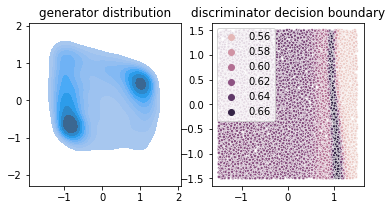

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 2 [0/60416]		D-Loss: 1.305094	G-Loss: -0.652005
Train | Epoch: 2 [51200/60416]		D-Loss: 1.307313	G-Loss: -0.674609
====> Train | Epoch: 2 	 | 	Average D-loss: 1.3120 	 | 	Average G-loss: -0.6590
====> Test | Average D-loss: 1.3005 	 | 	Average G-loss: -0.6521


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


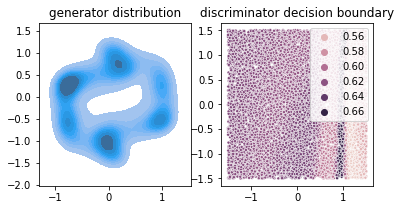

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 3 [0/60416]		D-Loss: 1.320957	G-Loss: -0.664582
Train | Epoch: 3 [51200/60416]		D-Loss: 1.339870	G-Loss: -0.709676
====> Train | Epoch: 3 	 | 	Average D-loss: 1.3249 	 | 	Average G-loss: -0.6546
====> Test | Average D-loss: 1.3387 	 | 	Average G-loss: -0.7282


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


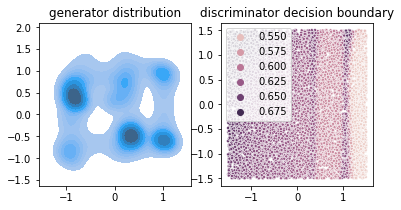

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 4 [0/60416]		D-Loss: 1.334853	G-Loss: -0.659252
Train | Epoch: 4 [51200/60416]		D-Loss: 1.349009	G-Loss: -0.658704
====> Train | Epoch: 4 	 | 	Average D-loss: 1.3397 	 | 	Average G-loss: -0.6616
====> Test | Average D-loss: 1.3181 	 | 	Average G-loss: -0.6553


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


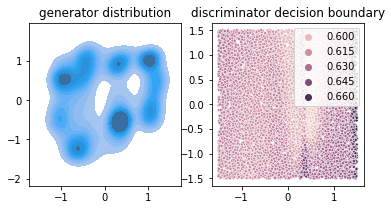

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 5 [0/60416]		D-Loss: 1.339368	G-Loss: -0.661327
Train | Epoch: 5 [51200/60416]		D-Loss: 1.322016	G-Loss: -0.678964
====> Train | Epoch: 5 	 | 	Average D-loss: 1.3129 	 | 	Average G-loss: -0.6564
====> Test | Average D-loss: 1.3339 	 | 	Average G-loss: -0.6992


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


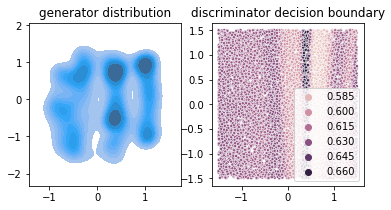

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 6 [0/60416]		D-Loss: 1.352361	G-Loss: -0.652954
Train | Epoch: 6 [51200/60416]		D-Loss: 1.246146	G-Loss: -0.740799
====> Train | Epoch: 6 	 | 	Average D-loss: 1.2637 	 | 	Average G-loss: -0.6360
====> Test | Average D-loss: 1.2199 	 | 	Average G-loss: -0.6296


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


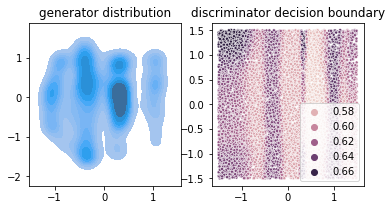

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 7 [0/60416]		D-Loss: 1.224509	G-Loss: -0.604323
Train | Epoch: 7 [51200/60416]		D-Loss: 1.253046	G-Loss: -0.617683
====> Train | Epoch: 7 	 | 	Average D-loss: 1.2428 	 | 	Average G-loss: -0.6228
====> Test | Average D-loss: 1.2257 	 | 	Average G-loss: -0.6099


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


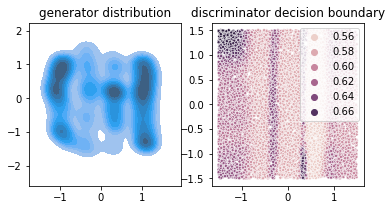

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 8 [0/60416]		D-Loss: 1.242351	G-Loss: -0.629199
Train | Epoch: 8 [51200/60416]		D-Loss: 1.276333	G-Loss: -0.686863
====> Train | Epoch: 8 	 | 	Average D-loss: 1.2323 	 | 	Average G-loss: -0.6195
====> Test | Average D-loss: 1.1776 	 | 	Average G-loss: -0.5673


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


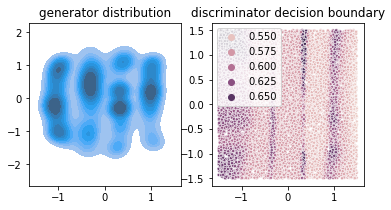

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 9 [0/60416]		D-Loss: 1.205976	G-Loss: -0.653511
Train | Epoch: 9 [51200/60416]		D-Loss: 1.198459	G-Loss: -0.497764
====> Train | Epoch: 9 	 | 	Average D-loss: 1.2067 	 | 	Average G-loss: -0.5826
====> Test | Average D-loss: 1.2080 	 | 	Average G-loss: -0.7016


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


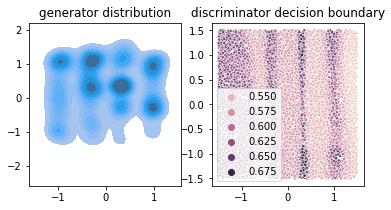

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 10 [0/60416]		D-Loss: 1.204197	G-Loss: -0.561077
Train | Epoch: 10 [51200/60416]		D-Loss: 1.193558	G-Loss: -0.574724
====> Train | Epoch: 10 	 | 	Average D-loss: 1.2005 	 | 	Average G-loss: -0.5893
====> Test | Average D-loss: 1.1772 	 | 	Average G-loss: -0.5366


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


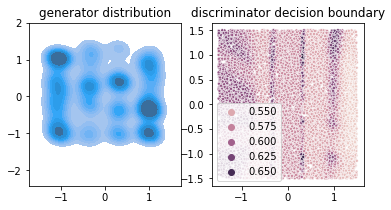

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 11 [0/60416]		D-Loss: 1.212750	G-Loss: -0.684648
Train | Epoch: 11 [51200/60416]		D-Loss: 1.209976	G-Loss: -0.571301
====> Train | Epoch: 11 	 | 	Average D-loss: 1.2119 	 | 	Average G-loss: -0.6034
====> Test | Average D-loss: 1.2151 	 | 	Average G-loss: -0.6055


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


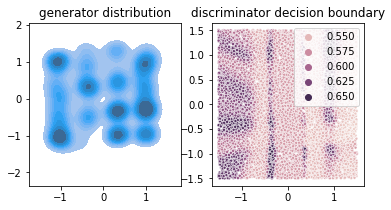

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 12 [0/60416]		D-Loss: 1.204890	G-Loss: -0.590778
Train | Epoch: 12 [51200/60416]		D-Loss: 1.179587	G-Loss: -0.518581
====> Train | Epoch: 12 	 | 	Average D-loss: 1.1854 	 | 	Average G-loss: -0.5808
====> Test | Average D-loss: 1.1963 	 | 	Average G-loss: -0.6195


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


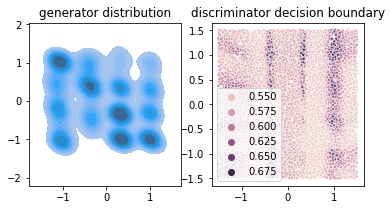

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 13 [0/60416]		D-Loss: 1.209271	G-Loss: -0.585746
Train | Epoch: 13 [51200/60416]		D-Loss: 1.162541	G-Loss: -0.547120
====> Train | Epoch: 13 	 | 	Average D-loss: 1.1902 	 | 	Average G-loss: -0.5817
====> Test | Average D-loss: 1.1798 	 | 	Average G-loss: -0.5940


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


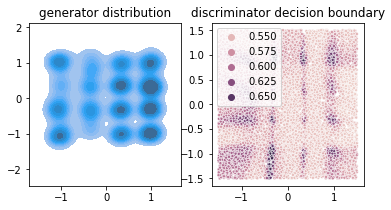

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 14 [0/60416]		D-Loss: 1.193461	G-Loss: -0.587774
Train | Epoch: 14 [51200/60416]		D-Loss: 1.194751	G-Loss: -0.555672
====> Train | Epoch: 14 	 | 	Average D-loss: 1.2003 	 | 	Average G-loss: -0.5942
====> Test | Average D-loss: 1.2562 	 | 	Average G-loss: -0.5591


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


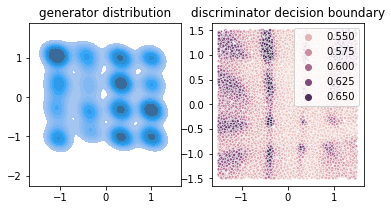

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 15 [0/60416]		D-Loss: 1.235180	G-Loss: -0.612552
Train | Epoch: 15 [51200/60416]		D-Loss: 1.172606	G-Loss: -0.546603
====> Train | Epoch: 15 	 | 	Average D-loss: 1.1982 	 | 	Average G-loss: -0.5808
====> Test | Average D-loss: 1.2557 	 | 	Average G-loss: -0.4863


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


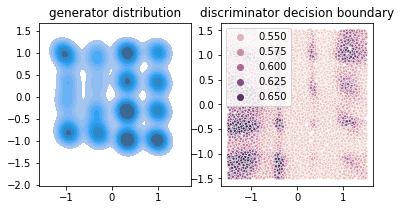

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 16 [0/60416]		D-Loss: 1.327700	G-Loss: -0.741413
Train | Epoch: 16 [51200/60416]		D-Loss: 1.251808	G-Loss: -0.650219
====> Train | Epoch: 16 	 | 	Average D-loss: 1.1950 	 | 	Average G-loss: -0.5921
====> Test | Average D-loss: 1.2342 	 | 	Average G-loss: -0.5807


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


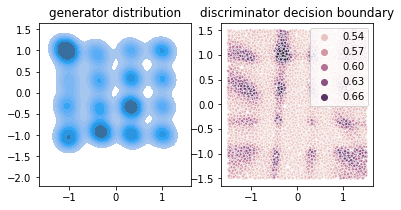

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 17 [0/60416]		D-Loss: 1.177372	G-Loss: -0.555972
Train | Epoch: 17 [51200/60416]		D-Loss: 1.185328	G-Loss: -0.608501
====> Train | Epoch: 17 	 | 	Average D-loss: 1.1783 	 | 	Average G-loss: -0.5875
====> Test | Average D-loss: 1.1251 	 | 	Average G-loss: -0.5841


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


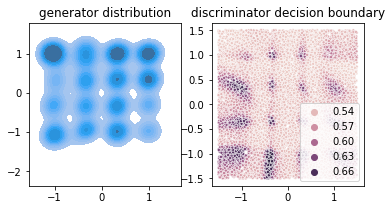

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 18 [0/60416]		D-Loss: 1.156295	G-Loss: -0.593359
Train | Epoch: 18 [51200/60416]		D-Loss: 1.218926	G-Loss: -0.583689
====> Train | Epoch: 18 	 | 	Average D-loss: 1.1675 	 | 	Average G-loss: -0.5820
====> Test | Average D-loss: 1.2384 	 | 	Average G-loss: -0.6292


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


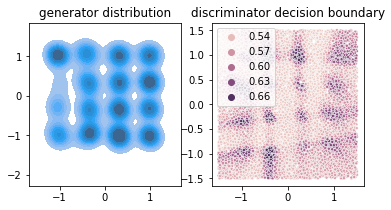

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 19 [0/60416]		D-Loss: 1.236183	G-Loss: -0.624287
Train | Epoch: 19 [51200/60416]		D-Loss: 1.150184	G-Loss: -0.506454
====> Train | Epoch: 19 	 | 	Average D-loss: 1.1669 	 | 	Average G-loss: -0.5763
====> Test | Average D-loss: 1.1708 	 | 	Average G-loss: -0.5727


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


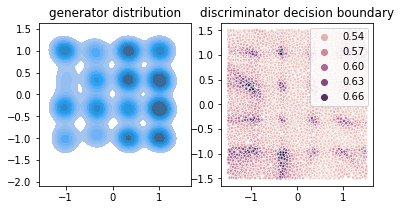

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 20 [0/60416]		D-Loss: 1.159425	G-Loss: -0.532571
Train | Epoch: 20 [51200/60416]		D-Loss: 1.172908	G-Loss: -0.594741
====> Train | Epoch: 20 	 | 	Average D-loss: 1.1899 	 | 	Average G-loss: -0.5998
====> Test | Average D-loss: 1.2666 	 | 	Average G-loss: -0.7805


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


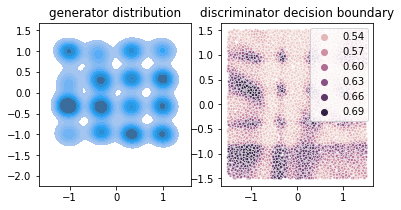

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 21 [0/60416]		D-Loss: 1.243520	G-Loss: -0.619253
Train | Epoch: 21 [51200/60416]		D-Loss: 1.170711	G-Loss: -0.583385
====> Train | Epoch: 21 	 | 	Average D-loss: 1.2013 	 | 	Average G-loss: -0.6067
====> Test | Average D-loss: 1.1996 	 | 	Average G-loss: -0.5495


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


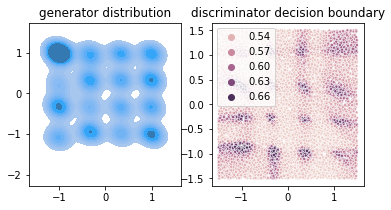

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 22 [0/60416]		D-Loss: 1.199578	G-Loss: -0.602299
Train | Epoch: 22 [51200/60416]		D-Loss: 1.239019	G-Loss: -0.615716
====> Train | Epoch: 22 	 | 	Average D-loss: 1.1995 	 | 	Average G-loss: -0.5954
====> Test | Average D-loss: 1.1985 	 | 	Average G-loss: -0.5695


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


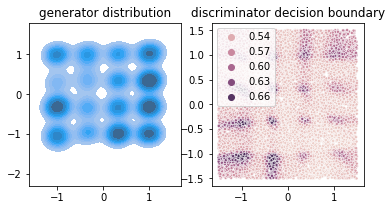

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 23 [0/60416]		D-Loss: 1.184803	G-Loss: -0.606732
Train | Epoch: 23 [51200/60416]		D-Loss: 1.200851	G-Loss: -0.575630
====> Train | Epoch: 23 	 | 	Average D-loss: 1.2182 	 | 	Average G-loss: -0.6082
====> Test | Average D-loss: 1.2188 	 | 	Average G-loss: -0.6939


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


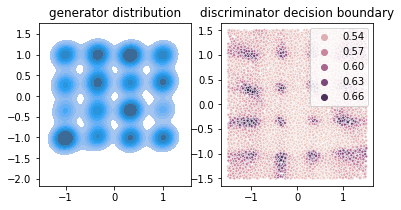

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 24 [0/60416]		D-Loss: 1.202980	G-Loss: -0.512890
Train | Epoch: 24 [51200/60416]		D-Loss: 1.219262	G-Loss: -0.620882
====> Train | Epoch: 24 	 | 	Average D-loss: 1.2279 	 | 	Average G-loss: -0.6142
====> Test | Average D-loss: 1.2399 	 | 	Average G-loss: -0.6395


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


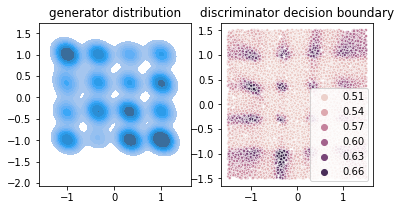

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 25 [0/60416]		D-Loss: 1.217096	G-Loss: -0.539021
Train | Epoch: 25 [51200/60416]		D-Loss: 1.280582	G-Loss: -0.697670
====> Train | Epoch: 25 	 | 	Average D-loss: 1.2407 	 | 	Average G-loss: -0.6198
====> Test | Average D-loss: 1.3020 	 | 	Average G-loss: -0.6004


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


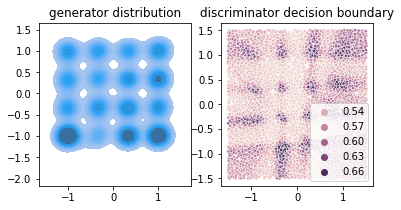

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 26 [0/60416]		D-Loss: 1.290592	G-Loss: -0.665245
Train | Epoch: 26 [51200/60416]		D-Loss: 1.243039	G-Loss: -0.625306
====> Train | Epoch: 26 	 | 	Average D-loss: 1.2780 	 | 	Average G-loss: -0.6466
====> Test | Average D-loss: 1.3066 	 | 	Average G-loss: -0.6395


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


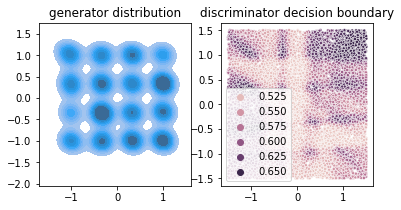

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 27 [0/60416]		D-Loss: 1.337897	G-Loss: -0.670644
Train | Epoch: 27 [51200/60416]		D-Loss: 1.279128	G-Loss: -0.642625
====> Train | Epoch: 27 	 | 	Average D-loss: 1.2679 	 | 	Average G-loss: -0.6344
====> Test | Average D-loss: 1.3907 	 | 	Average G-loss: -0.5263


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


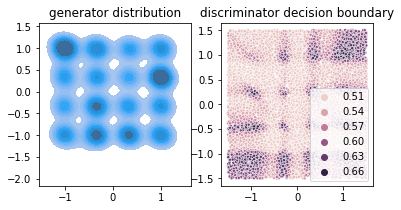

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 28 [0/60416]		D-Loss: 1.331014	G-Loss: -0.579039
Train | Epoch: 28 [51200/60416]		D-Loss: 1.324298	G-Loss: -0.667378
====> Train | Epoch: 28 	 | 	Average D-loss: 1.3160 	 | 	Average G-loss: -0.6492
====> Test | Average D-loss: 1.2847 	 | 	Average G-loss: -0.6305


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


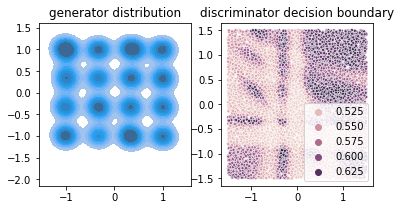

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 29 [0/60416]		D-Loss: 1.299441	G-Loss: -0.674283
Train | Epoch: 29 [51200/60416]		D-Loss: 1.305229	G-Loss: -0.633253
====> Train | Epoch: 29 	 | 	Average D-loss: 1.3048 	 | 	Average G-loss: -0.6502
====> Test | Average D-loss: 1.2994 	 | 	Average G-loss: -0.6117


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


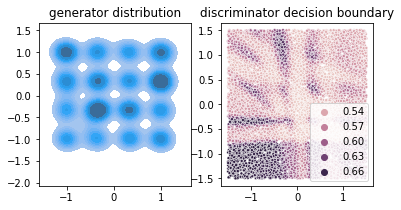

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 30 [0/60416]		D-Loss: 1.337565	G-Loss: -0.747596
Train | Epoch: 30 [51200/60416]		D-Loss: 1.283569	G-Loss: -0.563826
====> Train | Epoch: 30 	 | 	Average D-loss: 1.2867 	 | 	Average G-loss: -0.6441
====> Test | Average D-loss: 1.2562 	 | 	Average G-loss: -0.6388


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


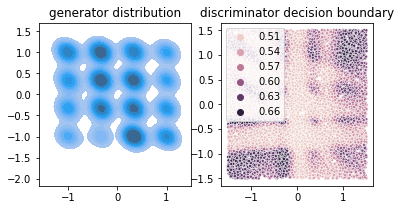

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 31 [0/60416]		D-Loss: 1.276311	G-Loss: -0.723256
Train | Epoch: 31 [51200/60416]		D-Loss: 1.326014	G-Loss: -0.627023
====> Train | Epoch: 31 	 | 	Average D-loss: 1.2898 	 | 	Average G-loss: -0.6363
====> Test | Average D-loss: 1.3752 	 | 	Average G-loss: -0.6831


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


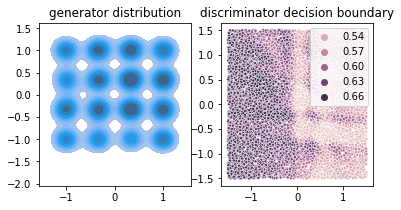

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 32 [0/60416]		D-Loss: 1.370564	G-Loss: -0.729031
Train | Epoch: 32 [51200/60416]		D-Loss: 1.334366	G-Loss: -0.673069
====> Train | Epoch: 32 	 | 	Average D-loss: 1.3132 	 | 	Average G-loss: -0.6508
====> Test | Average D-loss: 1.3007 	 | 	Average G-loss: -0.6198


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


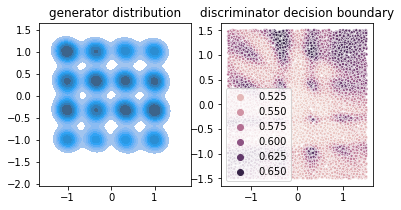

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 33 [0/60416]		D-Loss: 1.306589	G-Loss: -0.654083
Train | Epoch: 33 [51200/60416]		D-Loss: 1.312175	G-Loss: -0.643961
====> Train | Epoch: 33 	 | 	Average D-loss: 1.2968 	 | 	Average G-loss: -0.6473
====> Test | Average D-loss: 1.2723 	 | 	Average G-loss: -0.6488


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


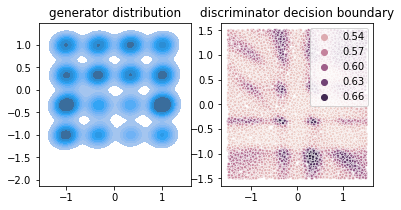

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 34 [0/60416]		D-Loss: 1.290796	G-Loss: -0.670418
Train | Epoch: 34 [51200/60416]		D-Loss: 1.353344	G-Loss: -0.651653
====> Train | Epoch: 34 	 | 	Average D-loss: 1.3232 	 | 	Average G-loss: -0.6557
====> Test | Average D-loss: 1.2967 	 | 	Average G-loss: -0.6316


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


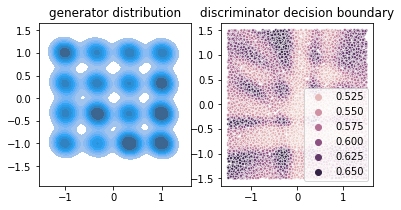

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 35 [0/60416]		D-Loss: 1.339258	G-Loss: -0.675000
Train | Epoch: 35 [51200/60416]		D-Loss: 1.317530	G-Loss: -0.625712
====> Train | Epoch: 35 	 | 	Average D-loss: 1.2976 	 | 	Average G-loss: -0.6400
====> Test | Average D-loss: 1.3004 	 | 	Average G-loss: -0.6253


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


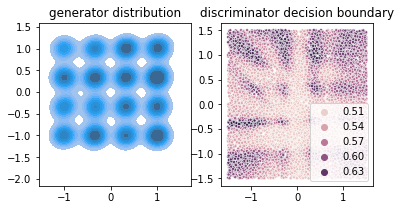

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 36 [0/60416]		D-Loss: 1.310958	G-Loss: -0.650223
Train | Epoch: 36 [51200/60416]		D-Loss: 1.320515	G-Loss: -0.629337
====> Train | Epoch: 36 	 | 	Average D-loss: 1.3162 	 | 	Average G-loss: -0.6449
====> Test | Average D-loss: 1.3093 	 | 	Average G-loss: -0.6521


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


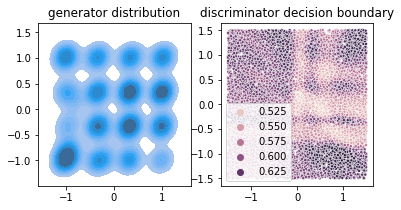

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 37 [0/60416]		D-Loss: 1.338852	G-Loss: -0.638613
Train | Epoch: 37 [51200/60416]		D-Loss: 1.300773	G-Loss: -0.638781
====> Train | Epoch: 37 	 | 	Average D-loss: 1.3148 	 | 	Average G-loss: -0.6524
====> Test | Average D-loss: 1.2983 	 | 	Average G-loss: -0.6253


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


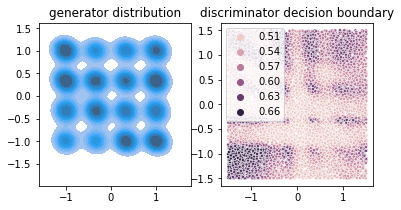

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 38 [0/60416]		D-Loss: 1.313144	G-Loss: -0.630762
Train | Epoch: 38 [51200/60416]		D-Loss: 1.364891	G-Loss: -0.689226
====> Train | Epoch: 38 	 | 	Average D-loss: 1.3251 	 | 	Average G-loss: -0.6540
====> Test | Average D-loss: 1.3447 	 | 	Average G-loss: -0.6837


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


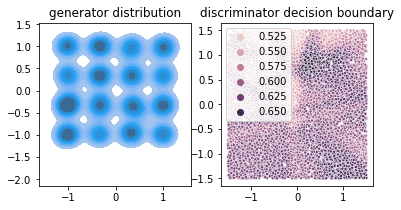

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 39 [0/60416]		D-Loss: 1.368145	G-Loss: -0.668602
Train | Epoch: 39 [51200/60416]		D-Loss: 1.330909	G-Loss: -0.706342
====> Train | Epoch: 39 	 | 	Average D-loss: 1.3388 	 | 	Average G-loss: -0.6659
====> Test | Average D-loss: 1.3192 	 | 	Average G-loss: -0.6780


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


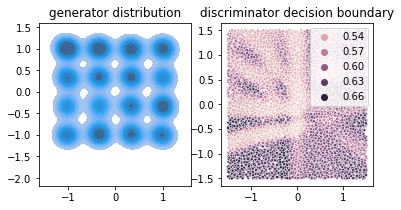

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 40 [0/60416]		D-Loss: 1.345158	G-Loss: -0.642309
Train | Epoch: 40 [51200/60416]		D-Loss: 1.328983	G-Loss: -0.673513
====> Train | Epoch: 40 	 | 	Average D-loss: 1.3261 	 | 	Average G-loss: -0.6697
====> Test | Average D-loss: 1.3154 	 | 	Average G-loss: -0.6664


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


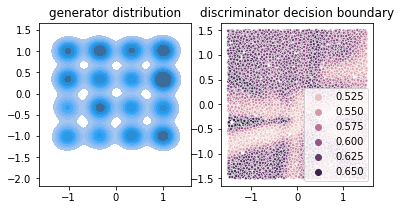

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 41 [0/60416]		D-Loss: 1.322197	G-Loss: -0.689539
Train | Epoch: 41 [51200/60416]		D-Loss: 1.321718	G-Loss: -0.687693
====> Train | Epoch: 41 	 | 	Average D-loss: 1.3284 	 | 	Average G-loss: -0.6638
====> Test | Average D-loss: 1.3128 	 | 	Average G-loss: -0.6416


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


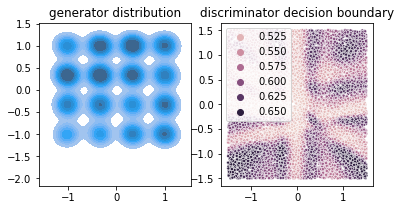

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 42 [0/60416]		D-Loss: 1.341904	G-Loss: -0.635782
Train | Epoch: 42 [51200/60416]		D-Loss: 1.319769	G-Loss: -0.652944
====> Train | Epoch: 42 	 | 	Average D-loss: 1.3094 	 | 	Average G-loss: -0.6463
====> Test | Average D-loss: 1.2906 	 | 	Average G-loss: -0.6440


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


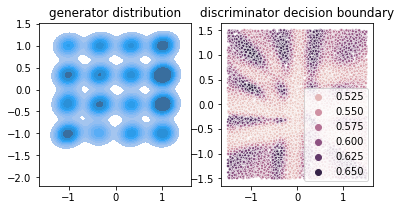

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 43 [0/60416]		D-Loss: 1.313019	G-Loss: -0.625895
Train | Epoch: 43 [51200/60416]		D-Loss: 1.324799	G-Loss: -0.668504
====> Train | Epoch: 43 	 | 	Average D-loss: 1.3271 	 | 	Average G-loss: -0.6664
====> Test | Average D-loss: 1.3023 	 | 	Average G-loss: -0.6006


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


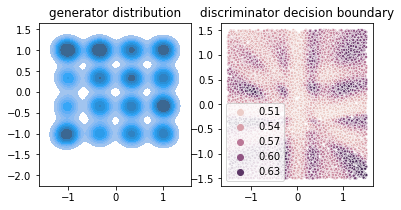

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 44 [0/60416]		D-Loss: 1.328580	G-Loss: -0.652052
Train | Epoch: 44 [51200/60416]		D-Loss: 1.323982	G-Loss: -0.671402
====> Train | Epoch: 44 	 | 	Average D-loss: 1.3195 	 | 	Average G-loss: -0.6563
====> Test | Average D-loss: 1.3207 	 | 	Average G-loss: -0.5973


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


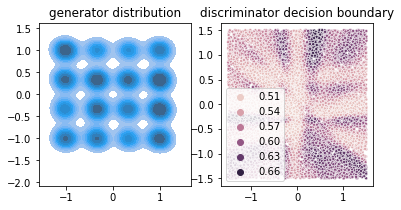

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 45 [0/60416]		D-Loss: 1.336346	G-Loss: -0.670162
Train | Epoch: 45 [51200/60416]		D-Loss: 1.324544	G-Loss: -0.664073
====> Train | Epoch: 45 	 | 	Average D-loss: 1.3263 	 | 	Average G-loss: -0.6613
====> Test | Average D-loss: 1.2969 	 | 	Average G-loss: -0.6574


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


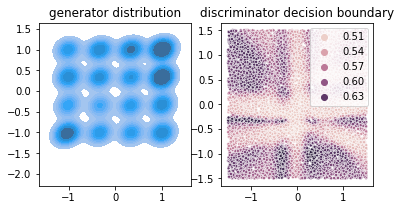

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 46 [0/60416]		D-Loss: 1.299981	G-Loss: -0.644366
Train | Epoch: 46 [51200/60416]		D-Loss: 1.326175	G-Loss: -0.656640
====> Train | Epoch: 46 	 | 	Average D-loss: 1.3207 	 | 	Average G-loss: -0.6589
====> Test | Average D-loss: 1.3074 	 | 	Average G-loss: -0.6150


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


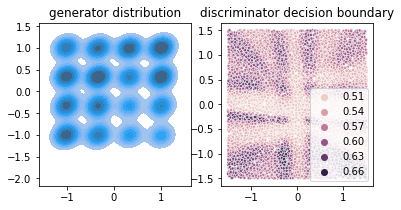

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 47 [0/60416]		D-Loss: 1.334114	G-Loss: -0.636465
Train | Epoch: 47 [51200/60416]		D-Loss: 1.325106	G-Loss: -0.675821
====> Train | Epoch: 47 	 | 	Average D-loss: 1.3157 	 | 	Average G-loss: -0.6522
====> Test | Average D-loss: 1.3009 	 | 	Average G-loss: -0.6442


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


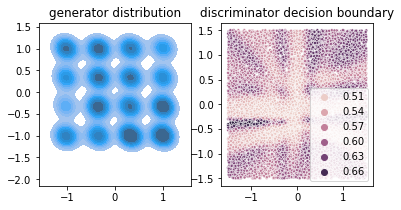

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 48 [0/60416]		D-Loss: 1.329981	G-Loss: -0.612604
Train | Epoch: 48 [51200/60416]		D-Loss: 1.299086	G-Loss: -0.659809
====> Train | Epoch: 48 	 | 	Average D-loss: 1.3205 	 | 	Average G-loss: -0.6532
====> Test | Average D-loss: 1.3087 	 | 	Average G-loss: -0.7185


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


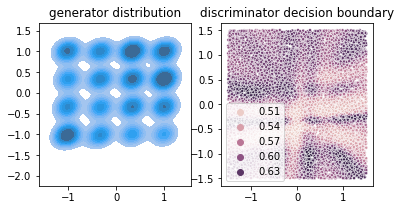

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 49 [0/60416]		D-Loss: 1.328741	G-Loss: -0.640293
Train | Epoch: 49 [51200/60416]		D-Loss: 1.331445	G-Loss: -0.711718
====> Train | Epoch: 49 	 | 	Average D-loss: 1.3282 	 | 	Average G-loss: -0.6603
====> Test | Average D-loss: 1.3098 	 | 	Average G-loss: -0.6672


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


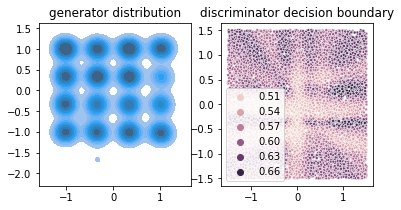

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 50 [0/60416]		D-Loss: 1.335894	G-Loss: -0.656932
Train | Epoch: 50 [51200/60416]		D-Loss: 1.312937	G-Loss: -0.646518
====> Train | Epoch: 50 	 | 	Average D-loss: 1.3193 	 | 	Average G-loss: -0.6702
====> Test | Average D-loss: 1.3114 	 | 	Average G-loss: -0.6781


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


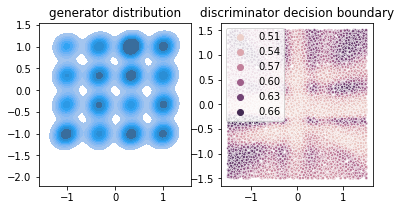

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 51 [0/60416]		D-Loss: 1.325308	G-Loss: -0.634419
Train | Epoch: 51 [51200/60416]		D-Loss: 1.354974	G-Loss: -0.676805
====> Train | Epoch: 51 	 | 	Average D-loss: 1.3257 	 | 	Average G-loss: -0.6640
====> Test | Average D-loss: 1.3249 	 | 	Average G-loss: -0.7096


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


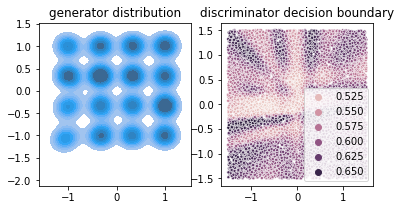

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 52 [0/60416]		D-Loss: 1.352005	G-Loss: -0.642013
Train | Epoch: 52 [51200/60416]		D-Loss: 1.326292	G-Loss: -0.648560
====> Train | Epoch: 52 	 | 	Average D-loss: 1.3223 	 | 	Average G-loss: -0.6638
====> Test | Average D-loss: 1.3542 	 | 	Average G-loss: -0.6807


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


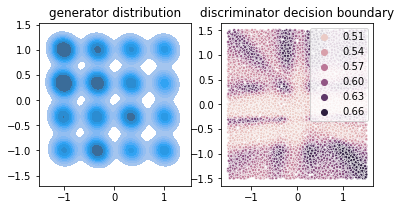

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 53 [0/60416]		D-Loss: 1.344690	G-Loss: -0.668662
Train | Epoch: 53 [51200/60416]		D-Loss: 1.324789	G-Loss: -0.699066
====> Train | Epoch: 53 	 | 	Average D-loss: 1.3254 	 | 	Average G-loss: -0.6594
====> Test | Average D-loss: 1.2868 	 | 	Average G-loss: -0.6528


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


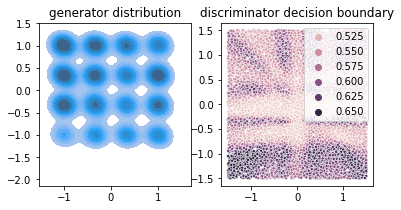

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 54 [0/60416]		D-Loss: 1.324650	G-Loss: -0.671677
Train | Epoch: 54 [51200/60416]		D-Loss: 1.316445	G-Loss: -0.664364
====> Train | Epoch: 54 	 | 	Average D-loss: 1.3187 	 | 	Average G-loss: -0.6523
====> Test | Average D-loss: 1.2867 	 | 	Average G-loss: -0.6440


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


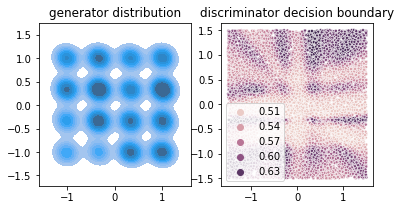

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 55 [0/60416]		D-Loss: 1.306241	G-Loss: -0.663165
Train | Epoch: 55 [51200/60416]		D-Loss: 1.338513	G-Loss: -0.683708
====> Train | Epoch: 55 	 | 	Average D-loss: 1.3186 	 | 	Average G-loss: -0.6565
====> Test | Average D-loss: 1.3214 	 | 	Average G-loss: -0.6649


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


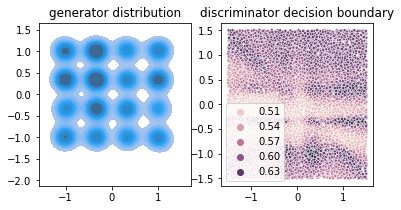

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 56 [0/60416]		D-Loss: 1.331941	G-Loss: -0.657194
Train | Epoch: 56 [51200/60416]		D-Loss: 1.316837	G-Loss: -0.628461
====> Train | Epoch: 56 	 | 	Average D-loss: 1.3210 	 | 	Average G-loss: -0.6566
====> Test | Average D-loss: 1.2793 	 | 	Average G-loss: -0.6208


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


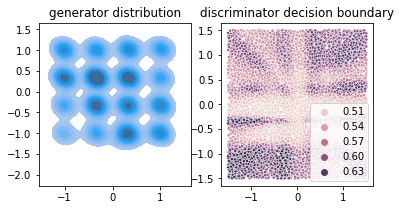

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 57 [0/60416]		D-Loss: 1.305103	G-Loss: -0.676432
Train | Epoch: 57 [51200/60416]		D-Loss: 1.329308	G-Loss: -0.733479
====> Train | Epoch: 57 	 | 	Average D-loss: 1.3251 	 | 	Average G-loss: -0.6642
====> Test | Average D-loss: 1.3159 	 | 	Average G-loss: -0.6337


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


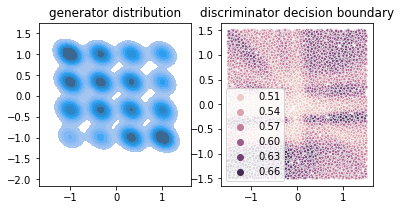

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 58 [0/60416]		D-Loss: 1.325279	G-Loss: -0.623659
Train | Epoch: 58 [51200/60416]		D-Loss: 1.329202	G-Loss: -0.685958
====> Train | Epoch: 58 	 | 	Average D-loss: 1.3190 	 | 	Average G-loss: -0.6507
====> Test | Average D-loss: 1.3007 	 | 	Average G-loss: -0.6557


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


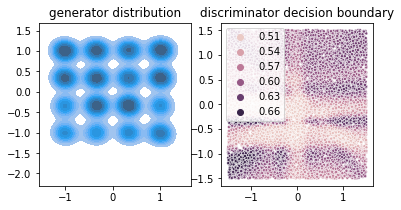

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 59 [0/60416]		D-Loss: 1.341113	G-Loss: -0.674968
Train | Epoch: 59 [51200/60416]		D-Loss: 1.326835	G-Loss: -0.688862
====> Train | Epoch: 59 	 | 	Average D-loss: 1.3143 	 | 	Average G-loss: -0.6512
====> Test | Average D-loss: 1.2980 	 | 	Average G-loss: -0.6187


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


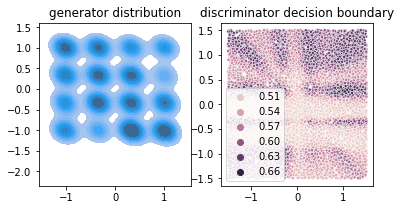

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 60 [0/60416]		D-Loss: 1.299721	G-Loss: -0.644289
Train | Epoch: 60 [51200/60416]		D-Loss: 1.336089	G-Loss: -0.702520
====> Train | Epoch: 60 	 | 	Average D-loss: 1.3258 	 | 	Average G-loss: -0.6525
====> Test | Average D-loss: 1.3093 	 | 	Average G-loss: -0.6482


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


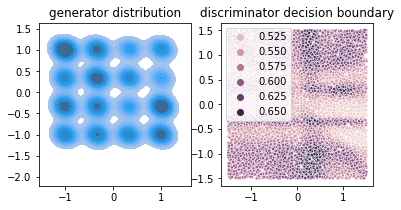

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 61 [0/60416]		D-Loss: 1.331717	G-Loss: -0.693393
Train | Epoch: 61 [51200/60416]		D-Loss: 1.335021	G-Loss: -0.655738
====> Train | Epoch: 61 	 | 	Average D-loss: 1.3190 	 | 	Average G-loss: -0.6534
====> Test | Average D-loss: 1.2876 	 | 	Average G-loss: -0.6351


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


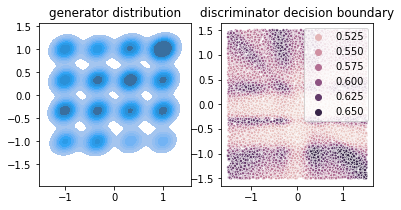

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 62 [0/60416]		D-Loss: 1.306135	G-Loss: -0.661284
Train | Epoch: 62 [51200/60416]		D-Loss: 1.320764	G-Loss: -0.670952
====> Train | Epoch: 62 	 | 	Average D-loss: 1.3164 	 | 	Average G-loss: -0.6581
====> Test | Average D-loss: 1.3625 	 | 	Average G-loss: -0.6248


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


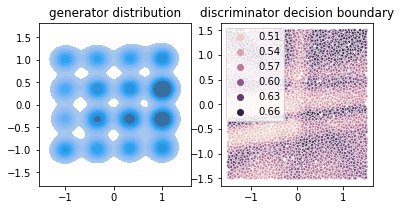

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 63 [0/60416]		D-Loss: 1.378919	G-Loss: -0.691320
Train | Epoch: 63 [51200/60416]		D-Loss: 1.301372	G-Loss: -0.654894
====> Train | Epoch: 63 	 | 	Average D-loss: 1.3156 	 | 	Average G-loss: -0.6548
====> Test | Average D-loss: 1.3078 	 | 	Average G-loss: -0.6605


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


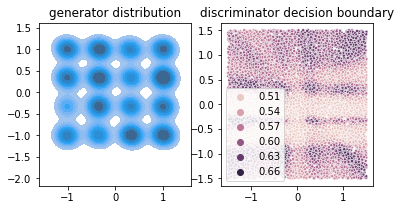

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 64 [0/60416]		D-Loss: 1.322478	G-Loss: -0.671679
Train | Epoch: 64 [51200/60416]		D-Loss: 1.311938	G-Loss: -0.654527
====> Train | Epoch: 64 	 | 	Average D-loss: 1.3266 	 | 	Average G-loss: -0.6633
====> Test | Average D-loss: 1.3345 	 | 	Average G-loss: -0.6392


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


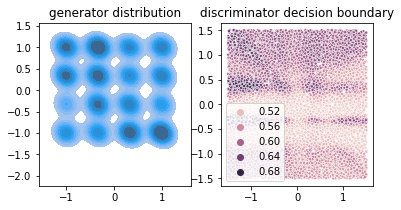

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 65 [0/60416]		D-Loss: 1.335327	G-Loss: -0.642620
Train | Epoch: 65 [51200/60416]		D-Loss: 1.357986	G-Loss: -0.644979
====> Train | Epoch: 65 	 | 	Average D-loss: 1.3221 	 | 	Average G-loss: -0.6567
====> Test | Average D-loss: 1.3030 	 | 	Average G-loss: -0.6784


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


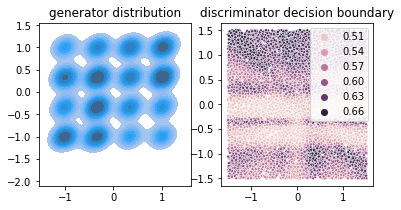

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 66 [0/60416]		D-Loss: 1.328081	G-Loss: -0.655659
Train | Epoch: 66 [51200/60416]		D-Loss: 1.318474	G-Loss: -0.658495
====> Train | Epoch: 66 	 | 	Average D-loss: 1.3155 	 | 	Average G-loss: -0.6631
====> Test | Average D-loss: 1.3121 	 | 	Average G-loss: -0.6406


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


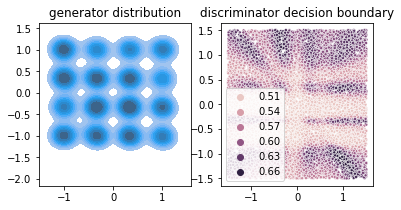

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 67 [0/60416]		D-Loss: 1.316523	G-Loss: -0.651002
Train | Epoch: 67 [51200/60416]		D-Loss: 1.304412	G-Loss: -0.647374
====> Train | Epoch: 67 	 | 	Average D-loss: 1.3179 	 | 	Average G-loss: -0.6502
====> Test | Average D-loss: 1.3244 	 | 	Average G-loss: -0.6216


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


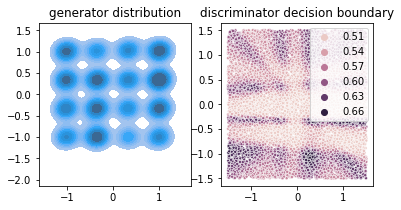

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 68 [0/60416]		D-Loss: 1.321448	G-Loss: -0.577236
Train | Epoch: 68 [51200/60416]		D-Loss: 1.343773	G-Loss: -0.673927
====> Train | Epoch: 68 	 | 	Average D-loss: 1.3312 	 | 	Average G-loss: -0.6529
====> Test | Average D-loss: 1.3059 	 | 	Average G-loss: -0.6704


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


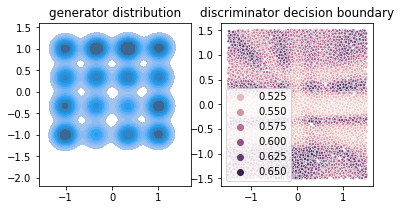

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 69 [0/60416]		D-Loss: 1.330974	G-Loss: -0.646928
Train | Epoch: 69 [51200/60416]		D-Loss: 1.332627	G-Loss: -0.676173
====> Train | Epoch: 69 	 | 	Average D-loss: 1.3251 	 | 	Average G-loss: -0.6638
====> Test | Average D-loss: 1.3204 	 | 	Average G-loss: -0.6190


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


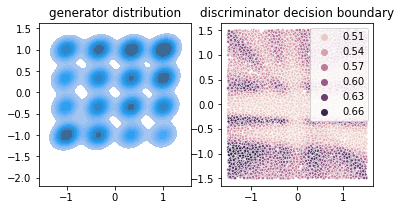

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 70 [0/60416]		D-Loss: 1.327678	G-Loss: -0.637929
Train | Epoch: 70 [51200/60416]		D-Loss: 1.331764	G-Loss: -0.675508
====> Train | Epoch: 70 	 | 	Average D-loss: 1.3207 	 | 	Average G-loss: -0.6641
====> Test | Average D-loss: 1.3157 	 | 	Average G-loss: -0.6373


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


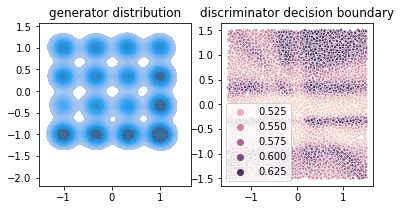

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 71 [0/60416]		D-Loss: 1.333234	G-Loss: -0.659637
Train | Epoch: 71 [51200/60416]		D-Loss: 1.325847	G-Loss: -0.697137
====> Train | Epoch: 71 	 | 	Average D-loss: 1.3237 	 | 	Average G-loss: -0.6575
====> Test | Average D-loss: 1.2963 	 | 	Average G-loss: -0.6264


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


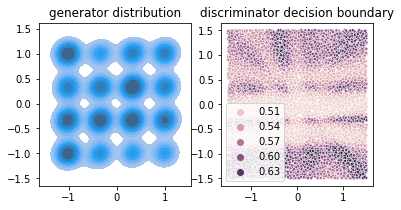

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 72 [0/60416]		D-Loss: 1.328490	G-Loss: -0.704776
Train | Epoch: 72 [51200/60416]		D-Loss: 1.313916	G-Loss: -0.616387
====> Train | Epoch: 72 	 | 	Average D-loss: 1.3185 	 | 	Average G-loss: -0.6594
====> Test | Average D-loss: 1.2962 	 | 	Average G-loss: -0.6489


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


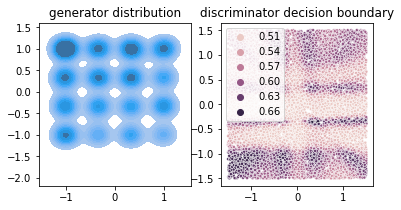

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 73 [0/60416]		D-Loss: 1.314873	G-Loss: -0.618196
Train | Epoch: 73 [51200/60416]		D-Loss: 1.335025	G-Loss: -0.673301
====> Train | Epoch: 73 	 | 	Average D-loss: 1.3126 	 | 	Average G-loss: -0.6537
====> Test | Average D-loss: 1.2961 	 | 	Average G-loss: -0.6677


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


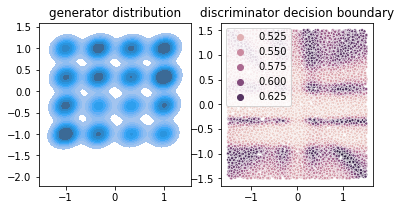

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 74 [0/60416]		D-Loss: 1.328600	G-Loss: -0.642857
Train | Epoch: 74 [51200/60416]		D-Loss: 1.334280	G-Loss: -0.673779
====> Train | Epoch: 74 	 | 	Average D-loss: 1.3164 	 | 	Average G-loss: -0.6523
====> Test | Average D-loss: 1.2925 	 | 	Average G-loss: -0.6627


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


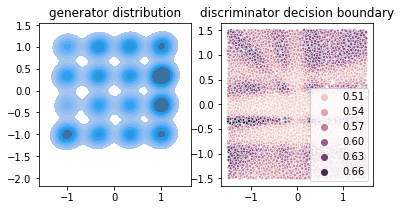

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 75 [0/60416]		D-Loss: 1.311201	G-Loss: -0.647490
Train | Epoch: 75 [51200/60416]		D-Loss: 1.332397	G-Loss: -0.637078
====> Train | Epoch: 75 	 | 	Average D-loss: 1.3153 	 | 	Average G-loss: -0.6560
====> Test | Average D-loss: 1.2952 	 | 	Average G-loss: -0.6340


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


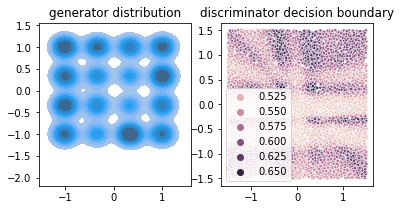

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 76 [0/60416]		D-Loss: 1.319841	G-Loss: -0.662030
Train | Epoch: 76 [51200/60416]		D-Loss: 1.335062	G-Loss: -0.610206
====> Train | Epoch: 76 	 | 	Average D-loss: 1.3259 	 | 	Average G-loss: -0.6596
====> Test | Average D-loss: 1.3065 	 | 	Average G-loss: -0.6654


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


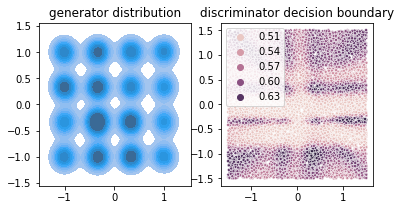

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 77 [0/60416]		D-Loss: 1.320451	G-Loss: -0.665009
Train | Epoch: 77 [51200/60416]		D-Loss: 1.318714	G-Loss: -0.587378
====> Train | Epoch: 77 	 | 	Average D-loss: 1.3119 	 | 	Average G-loss: -0.6507
====> Test | Average D-loss: 1.2983 	 | 	Average G-loss: -0.6207


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


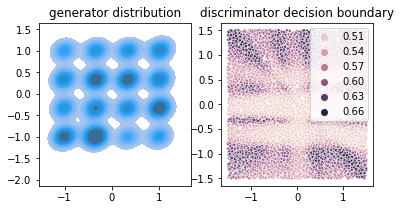

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 78 [0/60416]		D-Loss: 1.324215	G-Loss: -0.696093
Train | Epoch: 78 [51200/60416]		D-Loss: 1.320877	G-Loss: -0.658316
====> Train | Epoch: 78 	 | 	Average D-loss: 1.3200 	 | 	Average G-loss: -0.6601
====> Test | Average D-loss: 1.3116 	 | 	Average G-loss: -0.6344


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


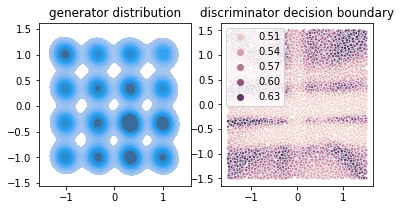

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 79 [0/60416]		D-Loss: 1.341735	G-Loss: -0.669153
Train | Epoch: 79 [51200/60416]		D-Loss: 1.329894	G-Loss: -0.663552
====> Train | Epoch: 79 	 | 	Average D-loss: 1.3240 	 | 	Average G-loss: -0.6501
====> Test | Average D-loss: 1.2987 	 | 	Average G-loss: -0.6695


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


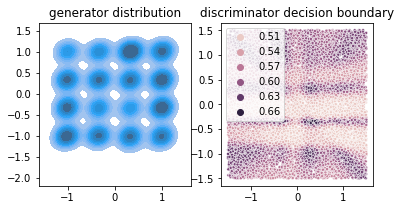

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 80 [0/60416]		D-Loss: 1.337671	G-Loss: -0.702009
Train | Epoch: 80 [51200/60416]		D-Loss: 1.339864	G-Loss: -0.625637
====> Train | Epoch: 80 	 | 	Average D-loss: 1.3241 	 | 	Average G-loss: -0.6622
====> Test | Average D-loss: 1.3022 	 | 	Average G-loss: -0.6513


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


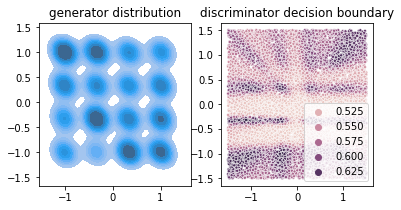

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 81 [0/60416]		D-Loss: 1.321421	G-Loss: -0.614592
Train | Epoch: 81 [51200/60416]		D-Loss: 1.357145	G-Loss: -0.611551
====> Train | Epoch: 81 	 | 	Average D-loss: 1.3305 	 | 	Average G-loss: -0.6622
====> Test | Average D-loss: 1.3217 	 | 	Average G-loss: -0.6708


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


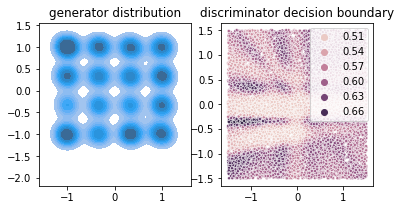

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 82 [0/60416]		D-Loss: 1.346447	G-Loss: -0.667713
Train | Epoch: 82 [51200/60416]		D-Loss: 1.352397	G-Loss: -0.642360
====> Train | Epoch: 82 	 | 	Average D-loss: 1.3237 	 | 	Average G-loss: -0.6683
====> Test | Average D-loss: 1.3085 	 | 	Average G-loss: -0.6523


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


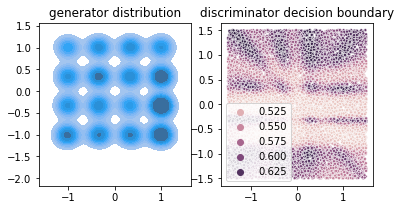

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 83 [0/60416]		D-Loss: 1.333916	G-Loss: -0.718690
Train | Epoch: 83 [51200/60416]		D-Loss: 1.326166	G-Loss: -0.624628
====> Train | Epoch: 83 	 | 	Average D-loss: 1.3149 	 | 	Average G-loss: -0.6538
====> Test | Average D-loss: 1.2969 	 | 	Average G-loss: -0.6548


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


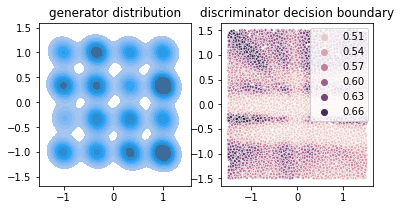

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 84 [0/60416]		D-Loss: 1.302750	G-Loss: -0.640441
Train | Epoch: 84 [51200/60416]		D-Loss: 1.385136	G-Loss: -0.648422
====> Train | Epoch: 84 	 | 	Average D-loss: 1.3174 	 | 	Average G-loss: -0.6514
====> Test | Average D-loss: 1.3253 	 | 	Average G-loss: -0.6593


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


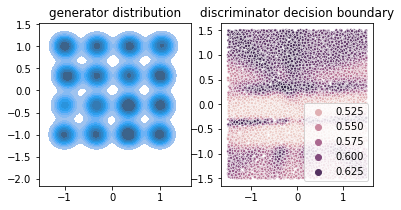

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 85 [0/60416]		D-Loss: 1.354478	G-Loss: -0.695213
Train | Epoch: 85 [51200/60416]		D-Loss: 1.323746	G-Loss: -0.667460
====> Train | Epoch: 85 	 | 	Average D-loss: 1.3223 	 | 	Average G-loss: -0.6610
====> Test | Average D-loss: 1.3383 	 | 	Average G-loss: -0.6713


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


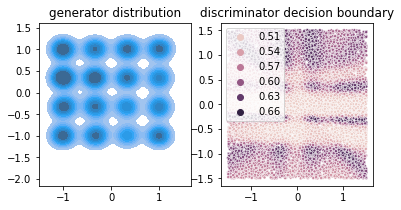

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 86 [0/60416]		D-Loss: 1.413417	G-Loss: -0.590577
Train | Epoch: 86 [51200/60416]		D-Loss: 1.337299	G-Loss: -0.628732
====> Train | Epoch: 86 	 | 	Average D-loss: 1.3184 	 | 	Average G-loss: -0.6556
====> Test | Average D-loss: 1.3102 	 | 	Average G-loss: -0.6419


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


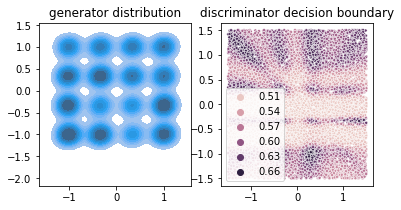

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 87 [0/60416]		D-Loss: 1.333648	G-Loss: -0.685084
Train | Epoch: 87 [51200/60416]		D-Loss: 1.326866	G-Loss: -0.658326
====> Train | Epoch: 87 	 | 	Average D-loss: 1.3159 	 | 	Average G-loss: -0.6536
====> Test | Average D-loss: 1.3225 	 | 	Average G-loss: -0.6655


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


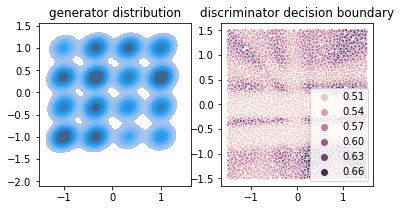

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 88 [0/60416]		D-Loss: 1.313185	G-Loss: -0.622138
Train | Epoch: 88 [51200/60416]		D-Loss: 1.308414	G-Loss: -0.666457
====> Train | Epoch: 88 	 | 	Average D-loss: 1.3176 	 | 	Average G-loss: -0.6552
====> Test | Average D-loss: 1.3123 	 | 	Average G-loss: -0.6745


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


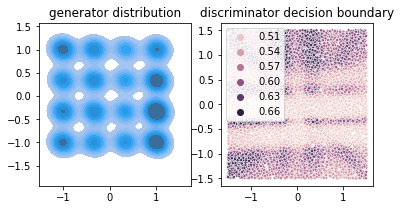

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 89 [0/60416]		D-Loss: 1.349953	G-Loss: -0.724546
Train | Epoch: 89 [51200/60416]		D-Loss: 1.330930	G-Loss: -0.651736
====> Train | Epoch: 89 	 | 	Average D-loss: 1.3291 	 | 	Average G-loss: -0.6575
====> Test | Average D-loss: 1.3040 	 | 	Average G-loss: -0.6242


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


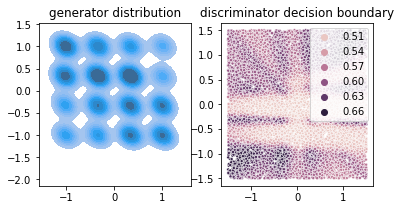

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 90 [0/60416]		D-Loss: 1.323124	G-Loss: -0.670924
Train | Epoch: 90 [51200/60416]		D-Loss: 1.330608	G-Loss: -0.682032
====> Train | Epoch: 90 	 | 	Average D-loss: 1.3157 	 | 	Average G-loss: -0.6525
====> Test | Average D-loss: 1.3001 	 | 	Average G-loss: -0.6938


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


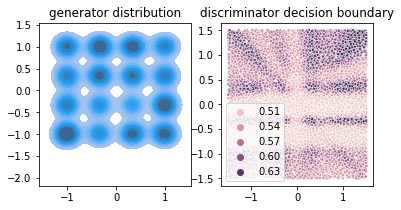

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 91 [0/60416]		D-Loss: 1.319597	G-Loss: -0.622645
Train | Epoch: 91 [51200/60416]		D-Loss: 1.333723	G-Loss: -0.716198
====> Train | Epoch: 91 	 | 	Average D-loss: 1.3179 	 | 	Average G-loss: -0.6549
====> Test | Average D-loss: 1.3591 	 | 	Average G-loss: -0.6241


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


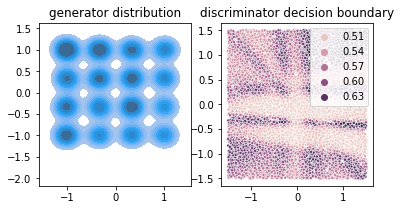

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 92 [0/60416]		D-Loss: 1.417147	G-Loss: -0.779995
Train | Epoch: 92 [51200/60416]		D-Loss: 1.327098	G-Loss: -0.688056
====> Train | Epoch: 92 	 | 	Average D-loss: 1.3190 	 | 	Average G-loss: -0.6637
====> Test | Average D-loss: 1.3104 	 | 	Average G-loss: -0.6696


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


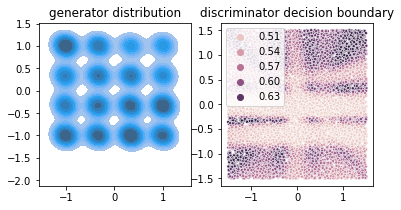

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 93 [0/60416]		D-Loss: 1.331260	G-Loss: -0.678154
Train | Epoch: 93 [51200/60416]		D-Loss: 1.348414	G-Loss: -0.667821
====> Train | Epoch: 93 	 | 	Average D-loss: 1.3216 	 | 	Average G-loss: -0.6580
====> Test | Average D-loss: 1.3236 	 | 	Average G-loss: -0.6570


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


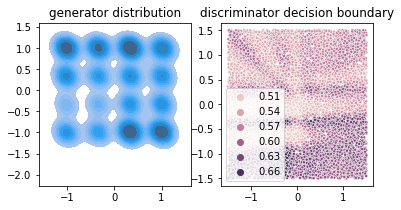

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 94 [0/60416]		D-Loss: 1.315343	G-Loss: -0.648339
Train | Epoch: 94 [51200/60416]		D-Loss: 1.314277	G-Loss: -0.607964
====> Train | Epoch: 94 	 | 	Average D-loss: 1.3144 	 | 	Average G-loss: -0.6589
====> Test | Average D-loss: 1.3107 	 | 	Average G-loss: -0.6642


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


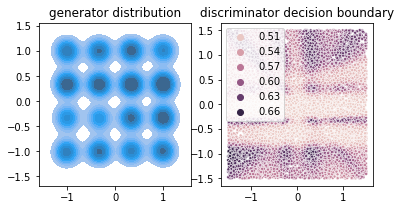

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 95 [0/60416]		D-Loss: 1.335163	G-Loss: -0.668644
Train | Epoch: 95 [51200/60416]		D-Loss: 1.312340	G-Loss: -0.635232
====> Train | Epoch: 95 	 | 	Average D-loss: 1.3197 	 | 	Average G-loss: -0.6576
====> Test | Average D-loss: 1.3102 	 | 	Average G-loss: -0.6684


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


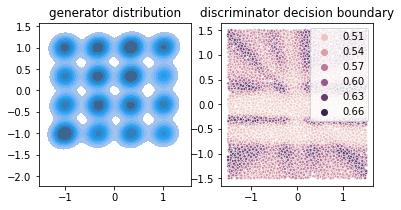

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 96 [0/60416]		D-Loss: 1.332138	G-Loss: -0.640565
Train | Epoch: 96 [51200/60416]		D-Loss: 1.333332	G-Loss: -0.683151
====> Train | Epoch: 96 	 | 	Average D-loss: 1.3216 	 | 	Average G-loss: -0.6560
====> Test | Average D-loss: 1.3121 	 | 	Average G-loss: -0.6514


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


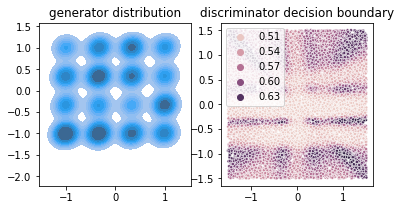

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 97 [0/60416]		D-Loss: 1.312475	G-Loss: -0.641155
Train | Epoch: 97 [51200/60416]		D-Loss: 1.320798	G-Loss: -0.703372
====> Train | Epoch: 97 	 | 	Average D-loss: 1.3216 	 | 	Average G-loss: -0.6588
====> Test | Average D-loss: 1.3169 	 | 	Average G-loss: -0.6003


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


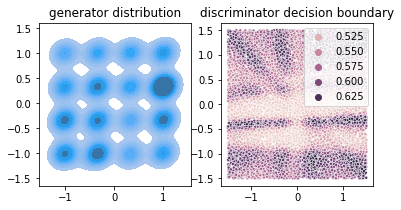

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 98 [0/60416]		D-Loss: 1.352984	G-Loss: -0.726196
Train | Epoch: 98 [51200/60416]		D-Loss: 1.321794	G-Loss: -0.661062
====> Train | Epoch: 98 	 | 	Average D-loss: 1.3188 	 | 	Average G-loss: -0.6573
====> Test | Average D-loss: 1.3045 	 | 	Average G-loss: -0.6536


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


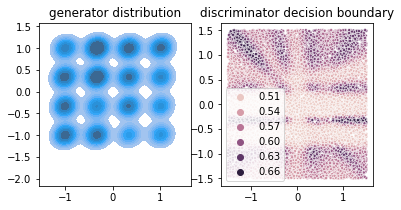

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 99 [0/60416]		D-Loss: 1.328506	G-Loss: -0.682485
Train | Epoch: 99 [51200/60416]		D-Loss: 1.324326	G-Loss: -0.659233
====> Train | Epoch: 99 	 | 	Average D-loss: 1.3154 	 | 	Average G-loss: -0.6536
====> Test | Average D-loss: 1.3059 	 | 	Average G-loss: -0.6196


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


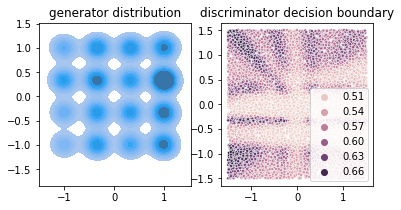

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 100 [0/60416]		D-Loss: 1.313402	G-Loss: -0.659983
Train | Epoch: 100 [51200/60416]		D-Loss: 1.314484	G-Loss: -0.654090
====> Train | Epoch: 100 	 | 	Average D-loss: 1.3015 	 | 	Average G-loss: -0.6522
====> Test | Average D-loss: 1.3007 	 | 	Average G-loss: -0.7093


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


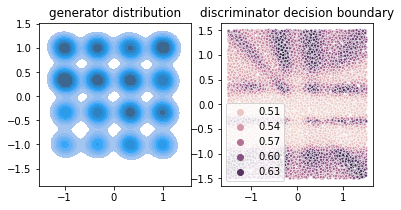

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 101 [0/60416]		D-Loss: 1.324013	G-Loss: -0.639071
Train | Epoch: 101 [51200/60416]		D-Loss: 1.317417	G-Loss: -0.689556
====> Train | Epoch: 101 	 | 	Average D-loss: 1.3160 	 | 	Average G-loss: -0.6570
====> Test | Average D-loss: 1.3179 	 | 	Average G-loss: -0.6942


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


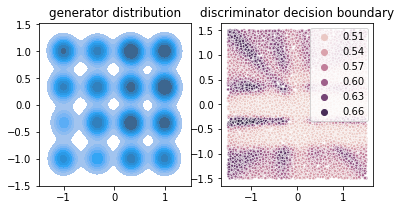

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 102 [0/60416]		D-Loss: 1.336147	G-Loss: -0.625207
Train | Epoch: 102 [51200/60416]		D-Loss: 1.327625	G-Loss: -0.697064
====> Train | Epoch: 102 	 | 	Average D-loss: 1.3182 	 | 	Average G-loss: -0.6537
====> Test | Average D-loss: 1.3176 	 | 	Average G-loss: -0.6572


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


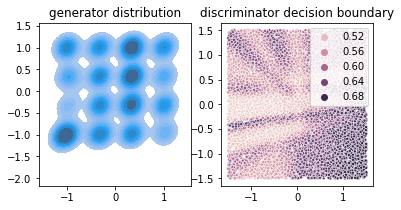

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 103 [0/60416]		D-Loss: 1.351121	G-Loss: -0.642044
Train | Epoch: 103 [51200/60416]		D-Loss: 1.311926	G-Loss: -0.667439
====> Train | Epoch: 103 	 | 	Average D-loss: 1.3256 	 | 	Average G-loss: -0.6666
====> Test | Average D-loss: 1.3115 	 | 	Average G-loss: -0.6653


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


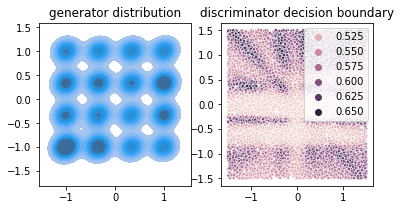

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 104 [0/60416]		D-Loss: 1.329287	G-Loss: -0.647127
Train | Epoch: 104 [51200/60416]		D-Loss: 1.316740	G-Loss: -0.661075
====> Train | Epoch: 104 	 | 	Average D-loss: 1.3177 	 | 	Average G-loss: -0.6545
====> Test | Average D-loss: 1.2916 	 | 	Average G-loss: -0.6441


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


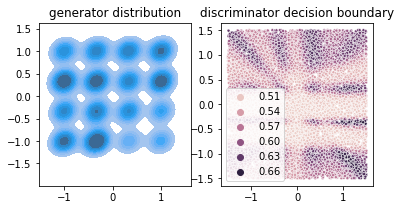

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 105 [0/60416]		D-Loss: 1.311550	G-Loss: -0.660739
Train | Epoch: 105 [51200/60416]		D-Loss: 1.331814	G-Loss: -0.685108
====> Train | Epoch: 105 	 | 	Average D-loss: 1.3279 	 | 	Average G-loss: -0.6512
====> Test | Average D-loss: 1.3132 	 | 	Average G-loss: -0.6689


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


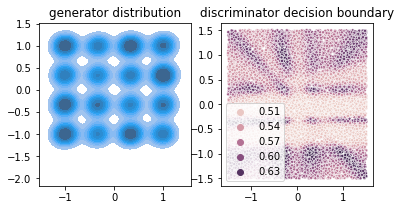

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 106 [0/60416]		D-Loss: 1.322775	G-Loss: -0.647919
Train | Epoch: 106 [51200/60416]		D-Loss: 1.333919	G-Loss: -0.652169
====> Train | Epoch: 106 	 | 	Average D-loss: 1.3129 	 | 	Average G-loss: -0.6501
====> Test | Average D-loss: 1.3047 	 | 	Average G-loss: -0.6952


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


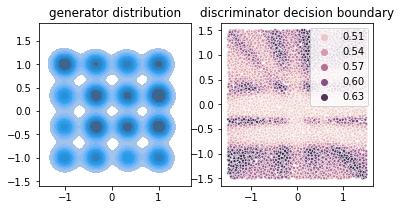

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 107 [0/60416]		D-Loss: 1.335662	G-Loss: -0.634780
Train | Epoch: 107 [51200/60416]		D-Loss: 1.330160	G-Loss: -0.654043
====> Train | Epoch: 107 	 | 	Average D-loss: 1.3102 	 | 	Average G-loss: -0.6548
====> Test | Average D-loss: 1.2990 	 | 	Average G-loss: -0.6581


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


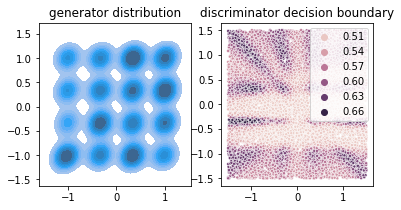

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 108 [0/60416]		D-Loss: 1.325486	G-Loss: -0.637877
Train | Epoch: 108 [51200/60416]		D-Loss: 1.338536	G-Loss: -0.700602
====> Train | Epoch: 108 	 | 	Average D-loss: 1.3299 	 | 	Average G-loss: -0.6516
====> Test | Average D-loss: 1.3266 	 | 	Average G-loss: -0.6601


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


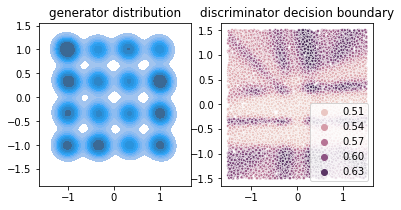

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 109 [0/60416]		D-Loss: 1.343520	G-Loss: -0.594108
Train | Epoch: 109 [51200/60416]		D-Loss: 1.331753	G-Loss: -0.653795
====> Train | Epoch: 109 	 | 	Average D-loss: 1.3183 	 | 	Average G-loss: -0.6491
====> Test | Average D-loss: 1.3076 	 | 	Average G-loss: -0.6396


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


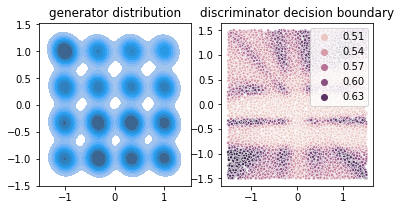

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 110 [0/60416]		D-Loss: 1.334809	G-Loss: -0.761483
Train | Epoch: 110 [51200/60416]		D-Loss: 1.340878	G-Loss: -0.648573
====> Train | Epoch: 110 	 | 	Average D-loss: 1.3187 	 | 	Average G-loss: -0.6571
====> Test | Average D-loss: 1.2829 	 | 	Average G-loss: -0.6200


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


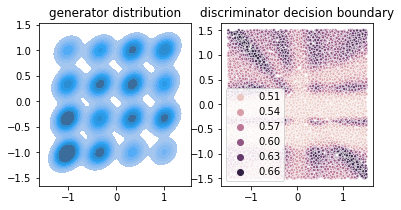

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 111 [0/60416]		D-Loss: 1.319706	G-Loss: -0.674819
Train | Epoch: 111 [51200/60416]		D-Loss: 1.327233	G-Loss: -0.633300
====> Train | Epoch: 111 	 | 	Average D-loss: 1.3184 	 | 	Average G-loss: -0.6551
====> Test | Average D-loss: 1.3130 	 | 	Average G-loss: -0.7133


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


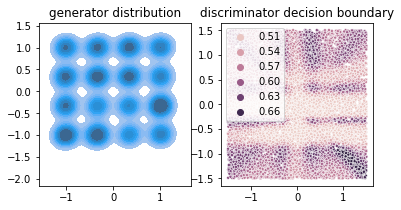

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 112 [0/60416]		D-Loss: 1.329196	G-Loss: -0.666805
Train | Epoch: 112 [51200/60416]		D-Loss: 1.327386	G-Loss: -0.661485
====> Train | Epoch: 112 	 | 	Average D-loss: 1.3139 	 | 	Average G-loss: -0.6604
====> Test | Average D-loss: 1.3213 	 | 	Average G-loss: -0.7362


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


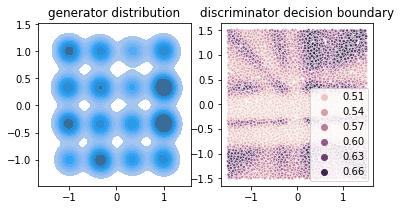

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 113 [0/60416]		D-Loss: 1.329258	G-Loss: -0.635821
Train | Epoch: 113 [51200/60416]		D-Loss: 1.331671	G-Loss: -0.662462
====> Train | Epoch: 113 	 | 	Average D-loss: 1.3192 	 | 	Average G-loss: -0.6515
====> Test | Average D-loss: 1.3195 	 | 	Average G-loss: -0.6616


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


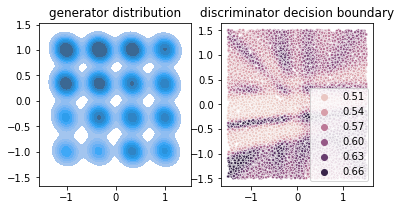

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 114 [0/60416]		D-Loss: 1.358127	G-Loss: -0.752031
Train | Epoch: 114 [51200/60416]		D-Loss: 1.331353	G-Loss: -0.652978
====> Train | Epoch: 114 	 | 	Average D-loss: 1.3239 	 | 	Average G-loss: -0.6718
====> Test | Average D-loss: 1.3156 	 | 	Average G-loss: -0.6390


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


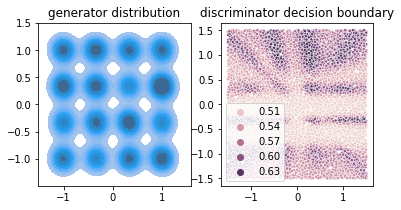

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 115 [0/60416]		D-Loss: 1.336087	G-Loss: -0.657877
Train | Epoch: 115 [51200/60416]		D-Loss: 1.315391	G-Loss: -0.659865
====> Train | Epoch: 115 	 | 	Average D-loss: 1.3120 	 | 	Average G-loss: -0.6586
====> Test | Average D-loss: 1.3250 	 | 	Average G-loss: -0.6572


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


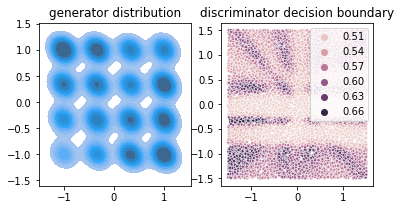

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 116 [0/60416]		D-Loss: 1.344385	G-Loss: -0.635548
Train | Epoch: 116 [51200/60416]		D-Loss: 1.306095	G-Loss: -0.667408
====> Train | Epoch: 116 	 | 	Average D-loss: 1.3155 	 | 	Average G-loss: -0.6611
====> Test | Average D-loss: 1.3185 	 | 	Average G-loss: -0.6407


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


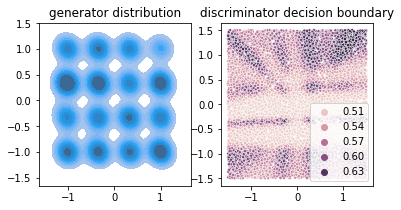

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 117 [0/60416]		D-Loss: 1.332283	G-Loss: -0.655870
Train | Epoch: 117 [51200/60416]		D-Loss: 1.327529	G-Loss: -0.666366
====> Train | Epoch: 117 	 | 	Average D-loss: 1.3160 	 | 	Average G-loss: -0.6607
====> Test | Average D-loss: 1.2847 	 | 	Average G-loss: -0.6276


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


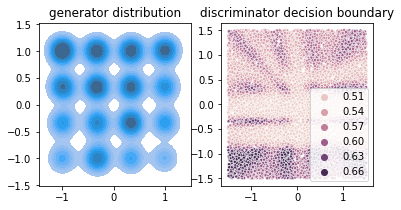

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 118 [0/60416]		D-Loss: 1.311356	G-Loss: -0.656944
Train | Epoch: 118 [51200/60416]		D-Loss: 1.336035	G-Loss: -0.676058
====> Train | Epoch: 118 	 | 	Average D-loss: 1.3207 	 | 	Average G-loss: -0.6560
====> Test | Average D-loss: 1.2913 	 | 	Average G-loss: -0.6565


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


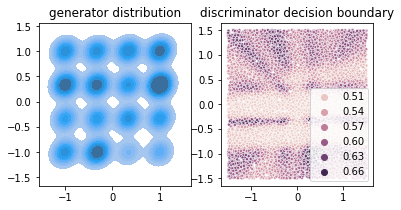

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 119 [0/60416]		D-Loss: 1.327774	G-Loss: -0.664553
Train | Epoch: 119 [51200/60416]		D-Loss: 1.318894	G-Loss: -0.686408
====> Train | Epoch: 119 	 | 	Average D-loss: 1.3125 	 | 	Average G-loss: -0.6536
====> Test | Average D-loss: 1.3130 	 | 	Average G-loss: -0.6010


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


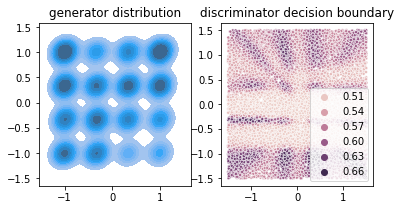

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 120 [0/60416]		D-Loss: 1.315271	G-Loss: -0.642354
Train | Epoch: 120 [51200/60416]		D-Loss: 1.359877	G-Loss: -0.690006
====> Train | Epoch: 120 	 | 	Average D-loss: 1.3481 	 | 	Average G-loss: -0.6669
====> Test | Average D-loss: 1.3288 	 | 	Average G-loss: -0.6590


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


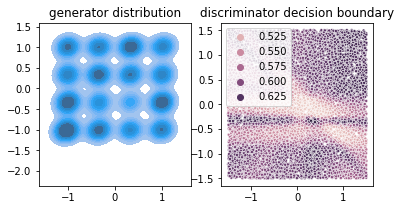

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 121 [0/60416]		D-Loss: 1.358933	G-Loss: -0.704589
Train | Epoch: 121 [51200/60416]		D-Loss: 1.320488	G-Loss: -0.694164
====> Train | Epoch: 121 	 | 	Average D-loss: 1.3359 	 | 	Average G-loss: -0.6749
====> Test | Average D-loss: 1.3085 	 | 	Average G-loss: -0.6804


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


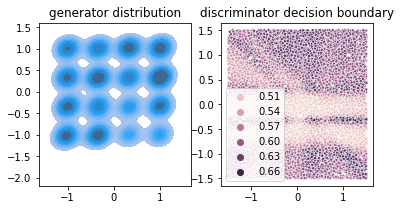

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 122 [0/60416]		D-Loss: 1.314375	G-Loss: -0.634484
Train | Epoch: 122 [51200/60416]		D-Loss: 1.352860	G-Loss: -0.669981
====> Train | Epoch: 122 	 | 	Average D-loss: 1.3228 	 | 	Average G-loss: -0.6646
====> Test | Average D-loss: 1.3067 	 | 	Average G-loss: -0.6664


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


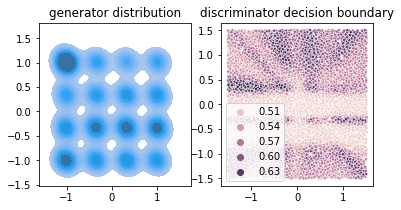

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 123 [0/60416]		D-Loss: 1.319663	G-Loss: -0.697397
Train | Epoch: 123 [51200/60416]		D-Loss: 1.343619	G-Loss: -0.617390
====> Train | Epoch: 123 	 | 	Average D-loss: 1.3179 	 | 	Average G-loss: -0.6527
====> Test | Average D-loss: 1.3080 	 | 	Average G-loss: -0.6952


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


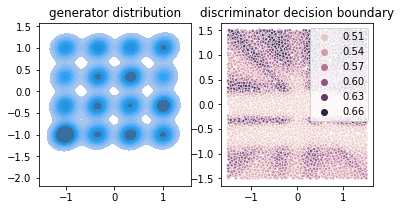

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 124 [0/60416]		D-Loss: 1.345906	G-Loss: -0.644899
Train | Epoch: 124 [51200/60416]		D-Loss: 1.314826	G-Loss: -0.662187
====> Train | Epoch: 124 	 | 	Average D-loss: 1.3152 	 | 	Average G-loss: -0.6557
====> Test | Average D-loss: 1.3187 	 | 	Average G-loss: -0.6262


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


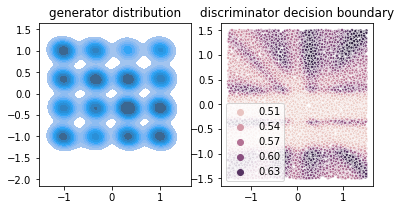

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 125 [0/60416]		D-Loss: 1.326273	G-Loss: -0.656535
Train | Epoch: 125 [51200/60416]		D-Loss: 1.336961	G-Loss: -0.662691
====> Train | Epoch: 125 	 | 	Average D-loss: 1.3121 	 | 	Average G-loss: -0.6553
====> Test | Average D-loss: 1.3179 	 | 	Average G-loss: -0.6660


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


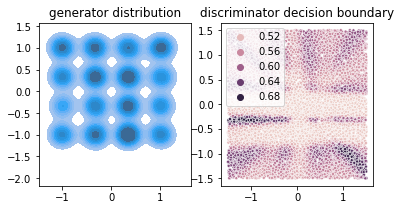

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 126 [0/60416]		D-Loss: 1.353794	G-Loss: -0.727010
Train | Epoch: 126 [51200/60416]		D-Loss: 1.333177	G-Loss: -0.651257
====> Train | Epoch: 126 	 | 	Average D-loss: 1.3152 	 | 	Average G-loss: -0.6507
====> Test | Average D-loss: 1.2694 	 | 	Average G-loss: -0.6596


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


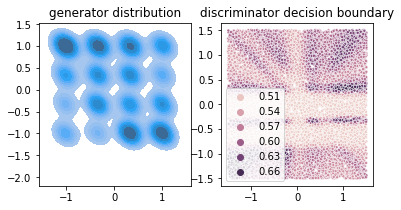

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 127 [0/60416]		D-Loss: 1.299673	G-Loss: -0.626782
Train | Epoch: 127 [51200/60416]		D-Loss: 1.329089	G-Loss: -0.648984
====> Train | Epoch: 127 	 | 	Average D-loss: 1.3147 	 | 	Average G-loss: -0.6530
====> Test | Average D-loss: 1.2983 	 | 	Average G-loss: -0.6659


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


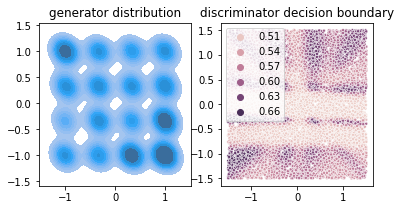

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 128 [0/60416]		D-Loss: 1.327264	G-Loss: -0.636410
Train | Epoch: 128 [51200/60416]		D-Loss: 1.337701	G-Loss: -0.668289
====> Train | Epoch: 128 	 | 	Average D-loss: 1.3163 	 | 	Average G-loss: -0.6567
====> Test | Average D-loss: 1.3416 	 | 	Average G-loss: -0.6012


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


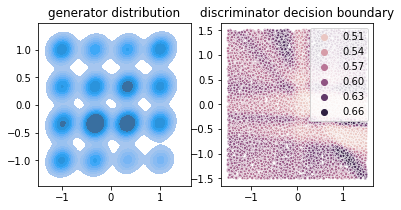

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 129 [0/60416]		D-Loss: 1.354812	G-Loss: -0.716390
Train | Epoch: 129 [51200/60416]		D-Loss: 1.331290	G-Loss: -0.698032
====> Train | Epoch: 129 	 | 	Average D-loss: 1.3244 	 | 	Average G-loss: -0.6628
====> Test | Average D-loss: 1.2988 	 | 	Average G-loss: -0.6462


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


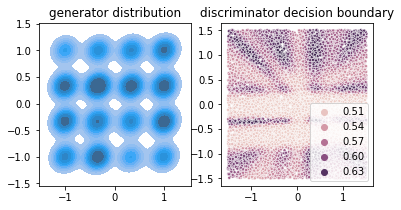

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 130 [0/60416]		D-Loss: 1.319034	G-Loss: -0.732807
Train | Epoch: 130 [51200/60416]		D-Loss: 1.330784	G-Loss: -0.664335
====> Train | Epoch: 130 	 | 	Average D-loss: 1.3198 	 | 	Average G-loss: -0.6594
====> Test | Average D-loss: 1.3063 	 | 	Average G-loss: -0.6557


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


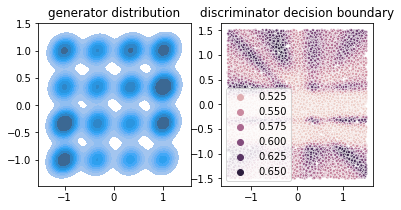

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 131 [0/60416]		D-Loss: 1.320403	G-Loss: -0.659744
Train | Epoch: 131 [51200/60416]		D-Loss: 1.338953	G-Loss: -0.662060
====> Train | Epoch: 131 	 | 	Average D-loss: 1.3155 	 | 	Average G-loss: -0.6581
====> Test | Average D-loss: 1.2991 	 | 	Average G-loss: -0.7339


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


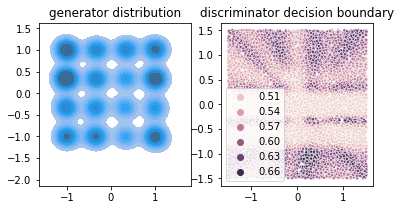

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 132 [0/60416]		D-Loss: 1.337752	G-Loss: -0.641909
Train | Epoch: 132 [51200/60416]		D-Loss: 1.338595	G-Loss: -0.674305
====> Train | Epoch: 132 	 | 	Average D-loss: 1.3200 	 | 	Average G-loss: -0.6598
====> Test | Average D-loss: 1.3448 	 | 	Average G-loss: -0.6523


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


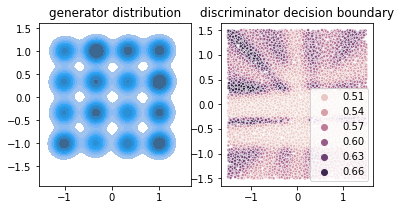

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 133 [0/60416]		D-Loss: 1.347070	G-Loss: -0.620668
Train | Epoch: 133 [51200/60416]		D-Loss: 1.322397	G-Loss: -0.648933
====> Train | Epoch: 133 	 | 	Average D-loss: 1.3133 	 | 	Average G-loss: -0.6518
====> Test | Average D-loss: 1.2972 	 | 	Average G-loss: -0.6539


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


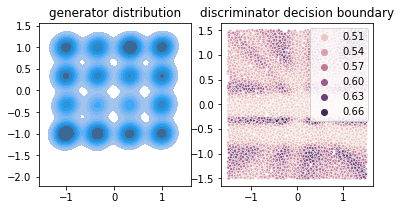

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 134 [0/60416]		D-Loss: 1.319425	G-Loss: -0.671173
Train | Epoch: 134 [51200/60416]		D-Loss: 1.352120	G-Loss: -0.662900
====> Train | Epoch: 134 	 | 	Average D-loss: 1.3204 	 | 	Average G-loss: -0.6575
====> Test | Average D-loss: 1.3059 	 | 	Average G-loss: -0.6521


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


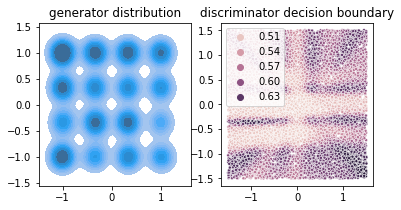

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 135 [0/60416]		D-Loss: 1.319772	G-Loss: -0.684139
Train | Epoch: 135 [51200/60416]		D-Loss: 1.334907	G-Loss: -0.637225
====> Train | Epoch: 135 	 | 	Average D-loss: 1.3137 	 | 	Average G-loss: -0.6607
====> Test | Average D-loss: 1.3047 	 | 	Average G-loss: -0.6441


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


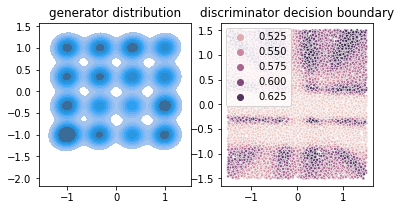

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 136 [0/60416]		D-Loss: 1.343407	G-Loss: -0.663062
Train | Epoch: 136 [51200/60416]		D-Loss: 1.335601	G-Loss: -0.665605
====> Train | Epoch: 136 	 | 	Average D-loss: 1.3069 	 | 	Average G-loss: -0.6539
====> Test | Average D-loss: 1.2981 	 | 	Average G-loss: -0.6015


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


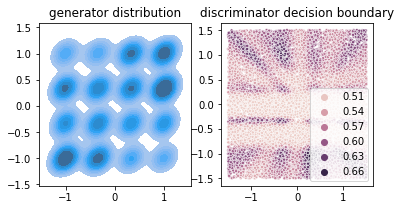

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 137 [0/60416]		D-Loss: 1.306796	G-Loss: -0.653770
Train | Epoch: 137 [51200/60416]		D-Loss: 1.340890	G-Loss: -0.662711
====> Train | Epoch: 137 	 | 	Average D-loss: 1.3158 	 | 	Average G-loss: -0.6526
====> Test | Average D-loss: 1.3015 	 | 	Average G-loss: -0.6310


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


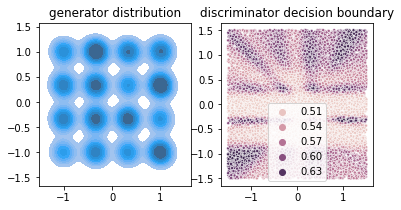

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 138 [0/60416]		D-Loss: 1.336274	G-Loss: -0.670966
Train | Epoch: 138 [51200/60416]		D-Loss: 1.353720	G-Loss: -0.728774
====> Train | Epoch: 138 	 | 	Average D-loss: 1.3174 	 | 	Average G-loss: -0.6606
====> Test | Average D-loss: 1.2930 	 | 	Average G-loss: -0.6537


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


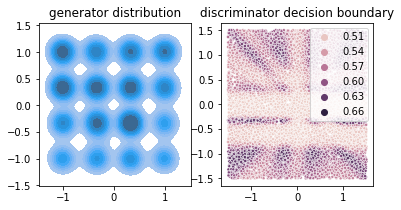

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 139 [0/60416]		D-Loss: 1.323986	G-Loss: -0.680025
Train | Epoch: 139 [51200/60416]		D-Loss: 1.332000	G-Loss: -0.636040
====> Train | Epoch: 139 	 | 	Average D-loss: 1.3160 	 | 	Average G-loss: -0.6527
====> Test | Average D-loss: 1.3044 	 | 	Average G-loss: -0.6512


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


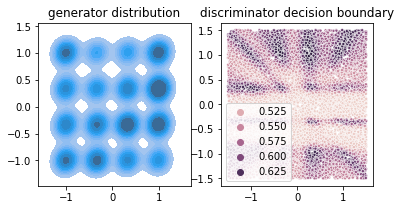

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 140 [0/60416]		D-Loss: 1.333866	G-Loss: -0.694219
Train | Epoch: 140 [51200/60416]		D-Loss: 1.311916	G-Loss: -0.630764
====> Train | Epoch: 140 	 | 	Average D-loss: 1.3109 	 | 	Average G-loss: -0.6547
====> Test | Average D-loss: 1.2920 	 | 	Average G-loss: -0.6168


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


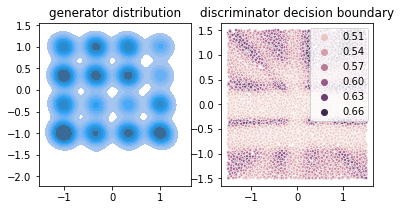

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 141 [0/60416]		D-Loss: 1.317069	G-Loss: -0.678528
Train | Epoch: 141 [51200/60416]		D-Loss: 1.330198	G-Loss: -0.685455
====> Train | Epoch: 141 	 | 	Average D-loss: 1.3190 	 | 	Average G-loss: -0.6581
====> Test | Average D-loss: 1.3124 	 | 	Average G-loss: -0.6476


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


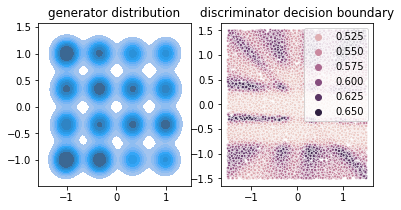

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 142 [0/60416]		D-Loss: 1.329550	G-Loss: -0.669493
Train | Epoch: 142 [51200/60416]		D-Loss: 1.356221	G-Loss: -0.832905
====> Train | Epoch: 142 	 | 	Average D-loss: 1.3265 	 | 	Average G-loss: -0.6745
====> Test | Average D-loss: 1.2861 	 | 	Average G-loss: -0.6236


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


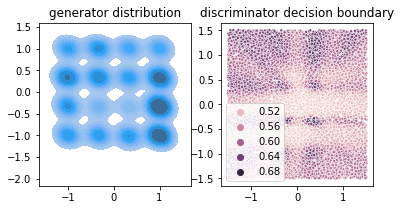

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 143 [0/60416]		D-Loss: 1.304878	G-Loss: -0.626235
Train | Epoch: 143 [51200/60416]		D-Loss: 1.317559	G-Loss: -0.670232
====> Train | Epoch: 143 	 | 	Average D-loss: 1.3148 	 | 	Average G-loss: -0.6589
====> Test | Average D-loss: 1.3090 	 | 	Average G-loss: -0.6481


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


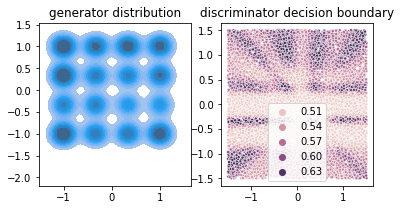

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 144 [0/60416]		D-Loss: 1.343767	G-Loss: -0.768320
Train | Epoch: 144 [51200/60416]		D-Loss: 1.330439	G-Loss: -0.629893
====> Train | Epoch: 144 	 | 	Average D-loss: 1.3172 	 | 	Average G-loss: -0.6630
====> Test | Average D-loss: 1.3054 	 | 	Average G-loss: -0.7066


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


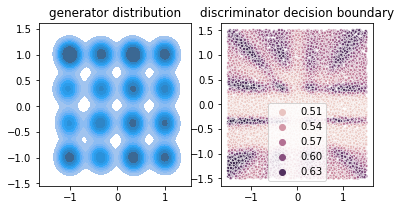

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 145 [0/60416]		D-Loss: 1.331079	G-Loss: -0.661525
Train | Epoch: 145 [51200/60416]		D-Loss: 1.313035	G-Loss: -0.691897
====> Train | Epoch: 145 	 | 	Average D-loss: 1.3171 	 | 	Average G-loss: -0.6569
====> Test | Average D-loss: 1.2594 	 | 	Average G-loss: -0.6260


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


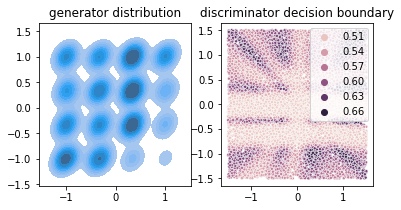

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 146 [0/60416]		D-Loss: 1.294120	G-Loss: -0.636545
Train | Epoch: 146 [51200/60416]		D-Loss: 1.355377	G-Loss: -0.590583
====> Train | Epoch: 146 	 | 	Average D-loss: 1.3243 	 | 	Average G-loss: -0.6495
====> Test | Average D-loss: 1.3414 	 | 	Average G-loss: -0.6820


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


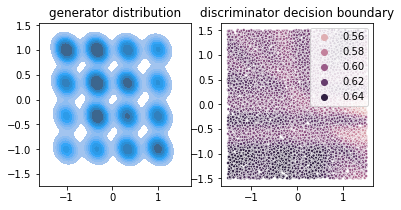

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 147 [0/60416]		D-Loss: 1.371764	G-Loss: -0.680223
Train | Epoch: 147 [51200/60416]		D-Loss: 1.331619	G-Loss: -0.685772
====> Train | Epoch: 147 	 | 	Average D-loss: 1.3346 	 | 	Average G-loss: -0.6593
====> Test | Average D-loss: 1.2912 	 | 	Average G-loss: -0.6312


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


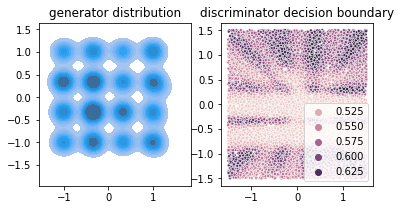

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 148 [0/60416]		D-Loss: 1.336918	G-Loss: -0.672502
Train | Epoch: 148 [51200/60416]		D-Loss: 1.329335	G-Loss: -0.704416
====> Train | Epoch: 148 	 | 	Average D-loss: 1.3194 	 | 	Average G-loss: -0.6608
====> Test | Average D-loss: 1.3067 	 | 	Average G-loss: -0.6405


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


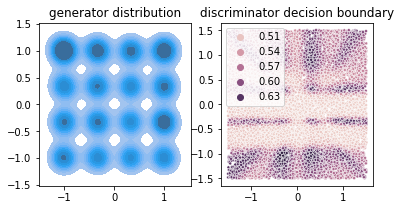

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 149 [0/60416]		D-Loss: 1.326179	G-Loss: -0.683072
Train | Epoch: 149 [51200/60416]		D-Loss: 1.305159	G-Loss: -0.673169
====> Train | Epoch: 149 	 | 	Average D-loss: 1.3148 	 | 	Average G-loss: -0.6609
====> Test | Average D-loss: 1.3211 	 | 	Average G-loss: -0.6587


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


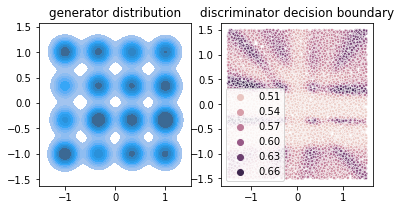

  0%|          | 0/59 [00:00<?, ?it/s]

Train | Epoch: 150 [0/60416]		D-Loss: 1.336266	G-Loss: -0.637716
Train | Epoch: 150 [51200/60416]		D-Loss: 1.331985	G-Loss: -0.631760
====> Train | Epoch: 150 	 | 	Average D-loss: 1.3149 	 | 	Average G-loss: -0.6581
====> Test | Average D-loss: 1.3036 	 | 	Average G-loss: -0.6620


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


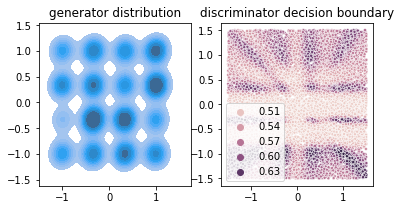

In [ ]:
#################### Problem 15 (1 points) ####################
# Tune `n_epoch`, `G_update_times` and `D_update_times`
####################################################
toy2d_trainer.run(n_epoch=150, G_update_times=1, D_update_times=2, verbose=True) #Due to compute power limitations I couldn't do more epochs and get even better results
####################### End ########################

### 3.5.3) Final Visualization
It is an evaluating criteria for network architecture and parameter tuning (problems 12 to 15)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


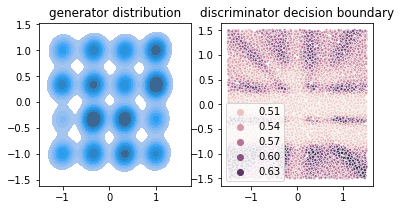

In [ ]:
toy2d_visulization_helper_fn(toy2d_trainer)

LOss for G_Step mande dorost she

# 4) Part 2 - MNIST

In the second part, we will learn to generate MNIST like samples.

## 4.1) Helper functions
These are functions used in visulization.

In [ ]:
def vector_linspace(start, end, steps):
  """
  Vector version of torch linspace
  """
  result = []
  for dim in range(start.shape[0]):
    result.append(torch.linspace(start[dim], end[dim], steps))
  result = torch.stack(result, dim=1).to(device)
  return result

In [ ]:
def mnist_show(image_batch, rows=1):
  """
  This function gets multiple MNIST images and plots them in the given number of rows.
  """
  image_batch = image_batch.detach().cpu()
  image_batch = image_batch.view(-1, 28, 28)
  image_batch = image_batch.numpy()

  cols = int(np.ceil(image_batch.shape[0] / rows))
  plt.rcParams['figure.figsize'] = (cols, rows) # set default size of plots  TODO float(folan)? #hain?
  
  for i in range(image_batch.shape[0]):
      plt.subplot(rows, cols, i + 1)
      plt.imshow(image_batch[i], cmap="gray", vmin=0, vmax=1)
      plt.axis('off')
  plt.show()

In [ ]:
def mnist_visulization_helper_fn(trainer: GANTrainer):
  """
  Generates fake samples and plots them for you.
  """
  _, fake_samples = trainer.generate_samples(30)
  mnist_show(fake_samples, 3)

In [ ]:
def show_interpolations(trainer:GANTrainer, n_rows, n_cols):
    """
    Shows image interpolation (grid of [`n_rows`, `n_cols`]) in input noise space.
    """
    anchor_noises = trainer.noise_generator(4)
    left_column = vector_linspace(anchor_noises[0], anchor_noises[1], n_rows)
    right_column = vector_linspace(anchor_noises[2], anchor_noises[3], n_rows)
    rows = []
    for i in range(n_rows):
      rows.append(vector_linspace(left_column[i], right_column[i], n_cols))
    noises = torch.stack(rows, dim=0).view(n_rows * n_cols, -1)
    with torch.no_grad():
      fake_imgs = trainer.generator(noises)
    mnist_show(fake_imgs, n_rows)

## 4.2) Dataset Loading

In [ ]:
# Get MNIST dataloader

# I made this function because  the default lambda function was producing error
def _trann(r):
    return r * 2 - 1

mnist_dataset_kwargs = {
    'download': True,
    'transform': transforms.Compose([
                                     transforms.ToTensor(),
                                     transforms.Lambda(_trann), #lambda img: img * 2 - 1, # to make pixel values between [-1, 1]
                                     #lambda img: torch.transpose(img, 1, 2)
                                     ])
}

mnist_train_dataset = datasets.MNIST('./data', train=True, **mnist_dataset_kwargs)
mnist_test_dataset = datasets.MNIST('./data', train=False, **mnist_dataset_kwargs)

print(len(mnist_train_dataset))

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw

60000


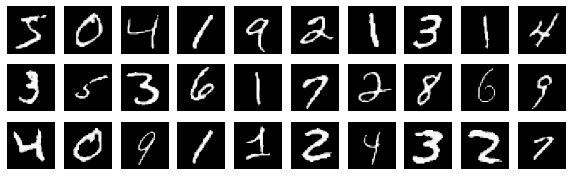

In [ ]:
temp = torch.stack([mnist_train_dataset[i][0] for i in range(30)], dim=0)
mnist_show(temp, 3)

## 4.3) Defining Models (6 points)

In [ ]:
# Generator part
#################### Problem 16 (3 points) ####################
# 1) Define `mnist_noise_generator`.
# 2) Define `mnist_generator` network.
#    Use `LeakyReLU` for intermediate layers.
#    Use `Tanh` for the last layer.
#    Use convolution layers.
#    Can use batch norm, dropout, ...
####################################################
mnist_generator = nn.Sequential(
    nn.Linear(100, 256*7*7),
    nn.Unflatten(1, (256, 7, 7)),
    nn.BatchNorm2d(256),
    nn.Upsample(scale_factor=2) ,
    nn.Conv2d(256, 512, 3, stride=1, padding=1),
    nn.BatchNorm2d(512, 0.8),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Upsample (scale_factor=2) ,
    nn.Conv2d(512, 256, 3, stride=1, padding=1),
    nn.BatchNorm2d (256, 0.8),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d (256, 1, 3, stride=1, padding=1),
    nn.Tanh(),
)
####################### End ########################

# Discriminator part
#################### Problem 17 (3 points) ####################
# 1) Define `toy2d_discriminator` network.
#    Use `LeakyReLU` for intermediate layers.
#    Use `Linear` for the last layer. why? becuase we need to do classification and we always do fully connected for best result of all for classification
#    Use convolution layers.
#    Can use batch norm, dropout, ...
####################################################
mnist_discriminator = nn.Sequential(
    nn.Conv2d(1, 32, kernel_size=3),
    nn.LeakyReLU(0.01),
    nn.MaxPool2d(2, stride=2),
    nn.Conv2d(32, 64, kernel_size=3),
    nn.LeakyReLU(0.01),
    nn.MaxPool2d(2, stride=2),
    nn.Flatten(),
    nn.Linear(5*5*64, 5*5*64) ,
    nn.LeakyReLU(0.01),
    nn.Linear(5*5*64,1),
    nn.Sigmoid()
)
####################### End ########################

mnist_generator = mnist_generator.to(device)
mnist_discriminator = mnist_discriminator.to(device)

print(mnist_generator)
print(mnist_discriminator)

Sequential(
  (0): Linear(in_features=100, out_features=12544, bias=True)
  (1): Unflatten(dim=1, unflattened_size=(256, 7, 7))
  (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Upsample(scale_factor=2.0, mode=nearest)
  (4): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
  (6): LeakyReLU(negative_slope=0.2, inplace=True)
  (7): Upsample(scale_factor=2.0, mode=nearest)
  (8): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
  (10): LeakyReLU(negative_slope=0.2, inplace=True)
  (11): Conv2d(256, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): Tanh()
)
Sequential(
  (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (1): LeakyReLU(negative_slope=0.01)
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, c

## 4.4) Train

### 4.4.1) Batching Data

you can use `train_sampler` and `test_sampler` to test your model on smaller subset of dataset; but, the final report must be on the whole dataset.

In [ ]:
BATCH_SIZE = 256

mnist_dataloader_kwargs = {
    'batch_size': BATCH_SIZE, 
    'pin_memory': True,
    'num_workers': 0,
}

# ############### To use complete dataset ############### #
train_sampler = None
test_sampler = None
mnist_dataloader_kwargs['shuffle'] = True
# ####################################################### #

# ############### To use subsample of dataset ############### #
# train_sampler = torch.utils.data.RandomSampler(mnist_train_dataset, replacement=True, num_samples=10000)
# test_sampler = torch.utils.data.RandomSampler(mnist_test_dataset, replacement=True, num_samples=2000)
# mnist_dataloader_kwargs['shuffle'] = False
# ########################################################### #

mnist_train_dataloader = torch.utils.data.DataLoader(mnist_train_dataset, sampler=train_sampler, **mnist_dataloader_kwargs)
mnist_test_dataloader = torch.utils.data.DataLoader(mnist_test_dataset, sampler=test_sampler, **mnist_dataloader_kwargs)

### 4.4.2) Run (2 points)

In [ ]:
LOG_INTERVAL = 50
#################### Problem 18 (1 points) ####################
# Tune `generator` and `discriminator` learning rates
# and also the `G_LOSS_MODE`.
####################################################
MNIST_G_LEARNING_RATE = 1e-4
MNIST_D_LEARNING_RATE = 1e-4
G_LOSS_MODE = "logD"
####################### End ########################

mnist_trainer = GANTrainer(mnist_train_dataloader, mnist_test_dataloader,
                           mnist_noise_generator, mnist_generator, mnist_discriminator,
                           MNIST_G_LEARNING_RATE, MNIST_D_LEARNING_RATE,
                           mnist_visulization_helper_fn, G_LOSS_MODE)

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 1 [0/60160]		D-Loss: 1.409032	G-Loss: 0.692051
Train | Epoch: 1 [12800/60160]		D-Loss: 1.284718	G-Loss: 0.785820
Train | Epoch: 1 [25600/60160]		D-Loss: 1.381498	G-Loss: 0.819989
Train | Epoch: 1 [38400/60160]		D-Loss: 1.209587	G-Loss: 1.245512
Train | Epoch: 1 [51200/60160]		D-Loss: 1.124634	G-Loss: 1.315628
====> Train | Epoch: 1 	 | 	Average D-loss: 1.1864 	 | 	Average G-loss: 0.8847
====> Test | Average D-loss: 1.0711 	 | 	Average G-loss: 1.0195


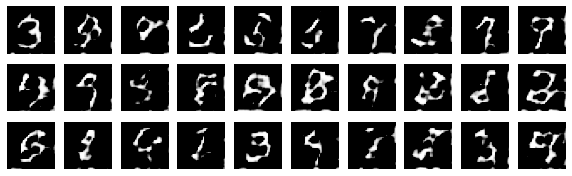

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 2 [0/60160]		D-Loss: 1.136226	G-Loss: 0.807757
Train | Epoch: 2 [12800/60160]		D-Loss: 1.115577	G-Loss: 1.149731
Train | Epoch: 2 [25600/60160]		D-Loss: 1.150288	G-Loss: 0.906793
Train | Epoch: 2 [38400/60160]		D-Loss: 1.225562	G-Loss: 1.117712
Train | Epoch: 2 [51200/60160]		D-Loss: 1.170697	G-Loss: 0.809650
====> Train | Epoch: 2 	 | 	Average D-loss: 1.1577 	 | 	Average G-loss: 0.9148
====> Test | Average D-loss: 1.1534 	 | 	Average G-loss: 0.9660


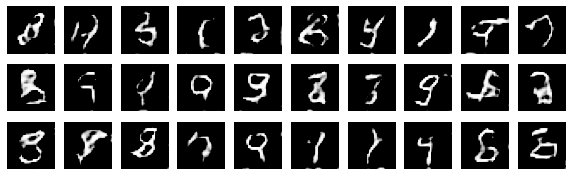

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 3 [0/60160]		D-Loss: 1.165486	G-Loss: 0.669202
Train | Epoch: 3 [12800/60160]		D-Loss: 1.188511	G-Loss: 1.349357
Train | Epoch: 3 [25600/60160]		D-Loss: 1.168122	G-Loss: 0.864679
Train | Epoch: 3 [38400/60160]		D-Loss: 1.155565	G-Loss: 0.686335
Train | Epoch: 3 [51200/60160]		D-Loss: 1.129921	G-Loss: 0.941349
====> Train | Epoch: 3 	 | 	Average D-loss: 1.1708 	 | 	Average G-loss: 0.9111
====> Test | Average D-loss: 1.1264 	 | 	Average G-loss: 0.7672


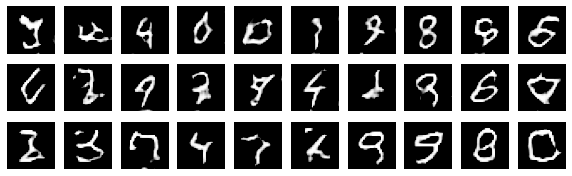

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 4 [0/60160]		D-Loss: 1.110117	G-Loss: 1.077506
Train | Epoch: 4 [12800/60160]		D-Loss: 1.025613	G-Loss: 0.934365
Train | Epoch: 4 [25600/60160]		D-Loss: 1.126861	G-Loss: 0.758429
Train | Epoch: 4 [38400/60160]		D-Loss: 1.168067	G-Loss: 0.995018
Train | Epoch: 4 [51200/60160]		D-Loss: 1.176922	G-Loss: 0.831481
====> Train | Epoch: 4 	 | 	Average D-loss: 1.1501 	 | 	Average G-loss: 0.9381
====> Test | Average D-loss: 1.1153 	 | 	Average G-loss: 1.3531


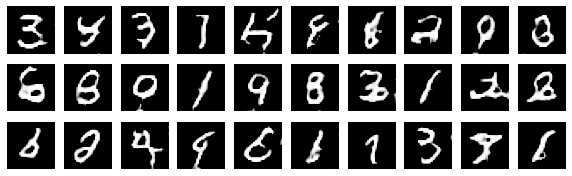

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 5 [0/60160]		D-Loss: 1.106447	G-Loss: 0.765317
Train | Epoch: 5 [12800/60160]		D-Loss: 1.129485	G-Loss: 0.967853
Train | Epoch: 5 [25600/60160]		D-Loss: 1.125996	G-Loss: 1.207870
Train | Epoch: 5 [38400/60160]		D-Loss: 1.118024	G-Loss: 1.016180
Train | Epoch: 5 [51200/60160]		D-Loss: 1.148070	G-Loss: 1.119780
====> Train | Epoch: 5 	 | 	Average D-loss: 1.1338 	 | 	Average G-loss: 0.9662
====> Test | Average D-loss: 1.1700 	 | 	Average G-loss: 0.7882


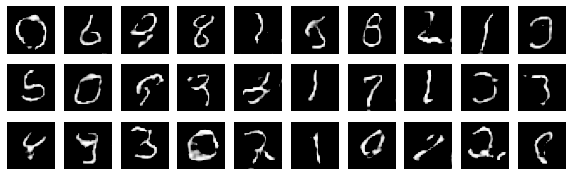

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 6 [0/60160]		D-Loss: 1.183593	G-Loss: 1.078038
Train | Epoch: 6 [12800/60160]		D-Loss: 1.062812	G-Loss: 0.966180
Train | Epoch: 6 [25600/60160]		D-Loss: 1.121522	G-Loss: 1.191869
Train | Epoch: 6 [38400/60160]		D-Loss: 1.009629	G-Loss: 0.914857
Train | Epoch: 6 [51200/60160]		D-Loss: 1.127528	G-Loss: 0.794357
====> Train | Epoch: 6 	 | 	Average D-loss: 1.1143 	 | 	Average G-loss: 0.9991
====> Test | Average D-loss: 1.0475 	 | 	Average G-loss: 1.0498


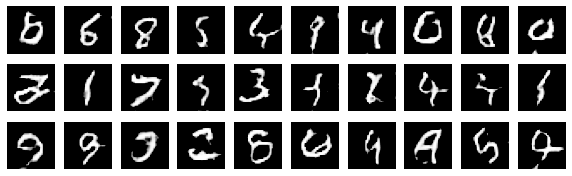

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 7 [0/60160]		D-Loss: 1.038345	G-Loss: 1.014315
Train | Epoch: 7 [12800/60160]		D-Loss: 1.053860	G-Loss: 0.842248
Train | Epoch: 7 [25600/60160]		D-Loss: 1.082129	G-Loss: 0.880094
Train | Epoch: 7 [38400/60160]		D-Loss: 1.103637	G-Loss: 0.859240
Train | Epoch: 7 [51200/60160]		D-Loss: 1.067297	G-Loss: 1.406022
====> Train | Epoch: 7 	 | 	Average D-loss: 1.0998 	 | 	Average G-loss: 1.0223
====> Test | Average D-loss: 1.0844 	 | 	Average G-loss: 0.7911


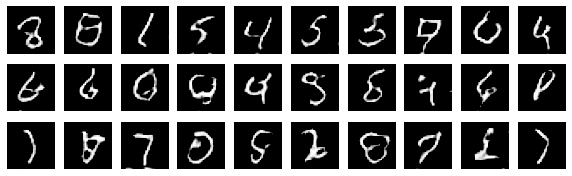

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 8 [0/60160]		D-Loss: 1.133491	G-Loss: 1.186068
Train | Epoch: 8 [12800/60160]		D-Loss: 1.033768	G-Loss: 1.130415
Train | Epoch: 8 [25600/60160]		D-Loss: 1.025685	G-Loss: 0.928367
Train | Epoch: 8 [38400/60160]		D-Loss: 1.131732	G-Loss: 0.719363
Train | Epoch: 8 [51200/60160]		D-Loss: 1.022162	G-Loss: 1.005482
====> Train | Epoch: 8 	 | 	Average D-loss: 1.0833 	 | 	Average G-loss: 1.0396
====> Test | Average D-loss: 1.1538 	 | 	Average G-loss: 0.6728


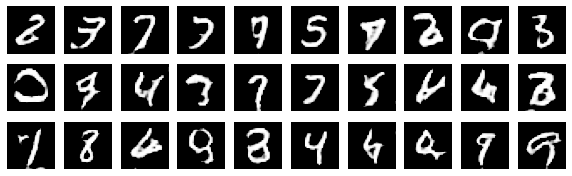

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 9 [0/60160]		D-Loss: 1.196774	G-Loss: 1.577887
Train | Epoch: 9 [12800/60160]		D-Loss: 1.204610	G-Loss: 0.759998
Train | Epoch: 9 [25600/60160]		D-Loss: 1.149999	G-Loss: 0.645615
Train | Epoch: 9 [38400/60160]		D-Loss: 1.038873	G-Loss: 1.132991
Train | Epoch: 9 [51200/60160]		D-Loss: 1.029019	G-Loss: 1.075846
====> Train | Epoch: 9 	 | 	Average D-loss: 1.0790 	 | 	Average G-loss: 1.0568
====> Test | Average D-loss: 1.0777 	 | 	Average G-loss: 0.7420


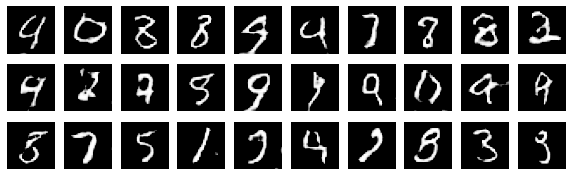

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 10 [0/60160]		D-Loss: 1.091551	G-Loss: 1.354481
Train | Epoch: 10 [12800/60160]		D-Loss: 0.979482	G-Loss: 1.039325
Train | Epoch: 10 [25600/60160]		D-Loss: 1.051160	G-Loss: 1.149914
Train | Epoch: 10 [38400/60160]		D-Loss: 1.076959	G-Loss: 1.237644
Train | Epoch: 10 [51200/60160]		D-Loss: 1.047522	G-Loss: 0.870535
====> Train | Epoch: 10 	 | 	Average D-loss: 1.0716 	 | 	Average G-loss: 1.0727
====> Test | Average D-loss: 1.2256 	 | 	Average G-loss: 1.6359


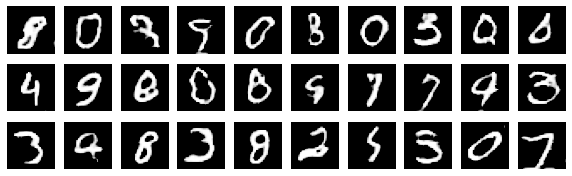

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 11 [0/60160]		D-Loss: 1.220155	G-Loss: 0.722175
Train | Epoch: 11 [12800/60160]		D-Loss: 1.068259	G-Loss: 1.078982
Train | Epoch: 11 [25600/60160]		D-Loss: 1.038508	G-Loss: 0.982710
Train | Epoch: 11 [38400/60160]		D-Loss: 0.981628	G-Loss: 1.305309
Train | Epoch: 11 [51200/60160]		D-Loss: 1.039703	G-Loss: 1.162973
====> Train | Epoch: 11 	 | 	Average D-loss: 1.0613 	 | 	Average G-loss: 1.0750
====> Test | Average D-loss: 1.0694 	 | 	Average G-loss: 1.2749


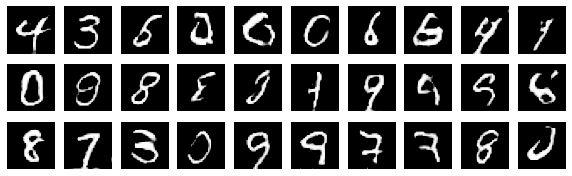

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 12 [0/60160]		D-Loss: 1.085422	G-Loss: 0.821879
Train | Epoch: 12 [12800/60160]		D-Loss: 1.013489	G-Loss: 1.037727
Train | Epoch: 12 [25600/60160]		D-Loss: 1.057789	G-Loss: 1.028806
Train | Epoch: 12 [38400/60160]		D-Loss: 1.079986	G-Loss: 1.032385
Train | Epoch: 12 [51200/60160]		D-Loss: 1.024603	G-Loss: 1.331542
====> Train | Epoch: 12 	 | 	Average D-loss: 1.0591 	 | 	Average G-loss: 1.0896
====> Test | Average D-loss: 1.1967 	 | 	Average G-loss: 0.5840


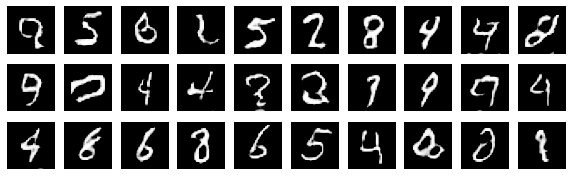

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 13 [0/60160]		D-Loss: 1.195651	G-Loss: 1.605381
Train | Epoch: 13 [12800/60160]		D-Loss: 1.048155	G-Loss: 0.812959
Train | Epoch: 13 [25600/60160]		D-Loss: 1.004679	G-Loss: 0.968835
Train | Epoch: 13 [38400/60160]		D-Loss: 1.082486	G-Loss: 0.765940
Train | Epoch: 13 [51200/60160]		D-Loss: 1.156895	G-Loss: 0.584985
====> Train | Epoch: 13 	 | 	Average D-loss: 1.0580 	 | 	Average G-loss: 1.0983
====> Test | Average D-loss: 1.0062 	 | 	Average G-loss: 1.0217


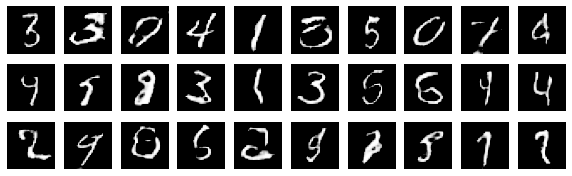

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 14 [0/60160]		D-Loss: 1.040552	G-Loss: 1.035928
Train | Epoch: 14 [12800/60160]		D-Loss: 1.018385	G-Loss: 1.122786
Train | Epoch: 14 [25600/60160]		D-Loss: 1.133866	G-Loss: 1.308053
Train | Epoch: 14 [38400/60160]		D-Loss: 1.062976	G-Loss: 0.904615
Train | Epoch: 14 [51200/60160]		D-Loss: 1.028985	G-Loss: 1.257270
====> Train | Epoch: 14 	 | 	Average D-loss: 1.0506 	 | 	Average G-loss: 1.1015
====> Test | Average D-loss: 1.0329 	 | 	Average G-loss: 1.2017


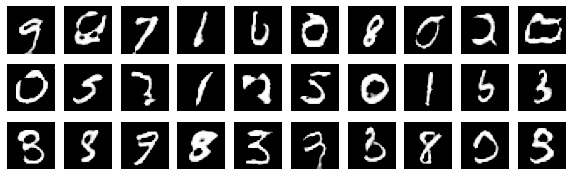

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 15 [0/60160]		D-Loss: 1.063787	G-Loss: 0.904054
Train | Epoch: 15 [12800/60160]		D-Loss: 1.027185	G-Loss: 0.911522
Train | Epoch: 15 [25600/60160]		D-Loss: 1.049266	G-Loss: 1.089846
Train | Epoch: 15 [38400/60160]		D-Loss: 1.042993	G-Loss: 1.176062
Train | Epoch: 15 [51200/60160]		D-Loss: 1.007131	G-Loss: 1.150085
====> Train | Epoch: 15 	 | 	Average D-loss: 1.0503 	 | 	Average G-loss: 1.1135
====> Test | Average D-loss: 1.0244 	 | 	Average G-loss: 1.3048


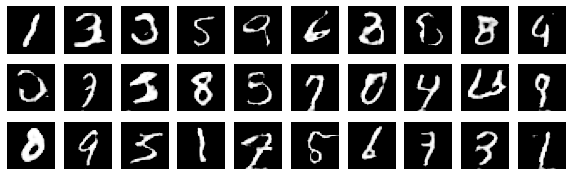

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 16 [0/60160]		D-Loss: 1.032728	G-Loss: 0.959295
Train | Epoch: 16 [12800/60160]		D-Loss: 1.022996	G-Loss: 1.430686
Train | Epoch: 16 [25600/60160]		D-Loss: 1.018333	G-Loss: 0.964820
Train | Epoch: 16 [38400/60160]		D-Loss: 1.033703	G-Loss: 1.477312
Train | Epoch: 16 [51200/60160]		D-Loss: 1.174151	G-Loss: 0.620615
====> Train | Epoch: 16 	 | 	Average D-loss: 1.0529 	 | 	Average G-loss: 1.1127
====> Test | Average D-loss: 1.0060 	 | 	Average G-loss: 1.2072


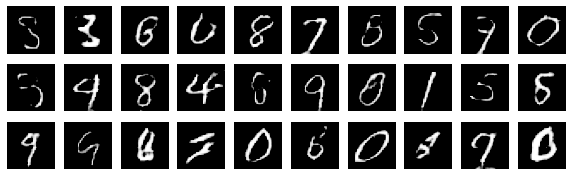

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 17 [0/60160]		D-Loss: 0.981491	G-Loss: 1.145330
Train | Epoch: 17 [12800/60160]		D-Loss: 1.066225	G-Loss: 1.177022
Train | Epoch: 17 [25600/60160]		D-Loss: 1.050593	G-Loss: 0.896642
Train | Epoch: 17 [38400/60160]		D-Loss: 0.991474	G-Loss: 1.229364
Train | Epoch: 17 [51200/60160]		D-Loss: 0.883336	G-Loss: 1.248571
====> Train | Epoch: 17 	 | 	Average D-loss: 1.0434 	 | 	Average G-loss: 1.1278
====> Test | Average D-loss: 1.0363 	 | 	Average G-loss: 0.9432


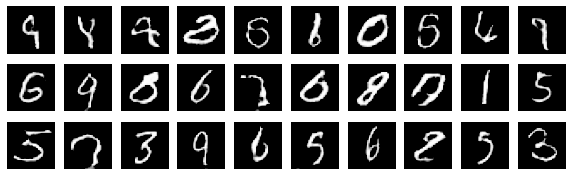

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 18 [0/60160]		D-Loss: 1.051208	G-Loss: 1.392842
Train | Epoch: 18 [12800/60160]		D-Loss: 1.062772	G-Loss: 1.336908
Train | Epoch: 18 [25600/60160]		D-Loss: 1.059184	G-Loss: 0.914055
Train | Epoch: 18 [38400/60160]		D-Loss: 1.045605	G-Loss: 0.925842
Train | Epoch: 18 [51200/60160]		D-Loss: 1.248032	G-Loss: 1.716867
====> Train | Epoch: 18 	 | 	Average D-loss: 1.0487 	 | 	Average G-loss: 1.1213
====> Test | Average D-loss: 1.0420 	 | 	Average G-loss: 1.2492


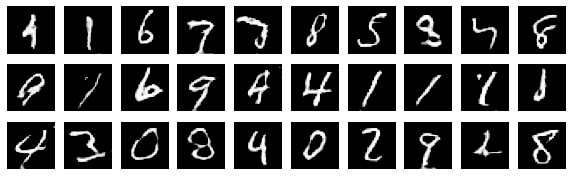

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 19 [0/60160]		D-Loss: 0.994903	G-Loss: 0.907695
Train | Epoch: 19 [12800/60160]		D-Loss: 1.046885	G-Loss: 0.946155
Train | Epoch: 19 [25600/60160]		D-Loss: 1.064182	G-Loss: 0.935708
Train | Epoch: 19 [38400/60160]		D-Loss: 1.040295	G-Loss: 1.017876
Train | Epoch: 19 [51200/60160]		D-Loss: 0.986911	G-Loss: 1.329025
====> Train | Epoch: 19 	 | 	Average D-loss: 1.0488 	 | 	Average G-loss: 1.1167
====> Test | Average D-loss: 1.0415 	 | 	Average G-loss: 0.8795


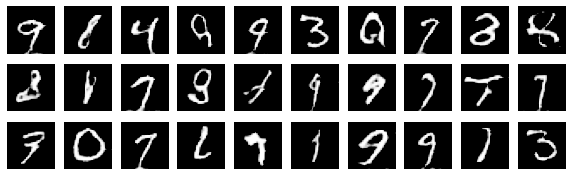

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 20 [0/60160]		D-Loss: 1.054008	G-Loss: 1.337319
Train | Epoch: 20 [12800/60160]		D-Loss: 1.036618	G-Loss: 1.048430
Train | Epoch: 20 [25600/60160]		D-Loss: 1.003615	G-Loss: 1.422197
Train | Epoch: 20 [38400/60160]		D-Loss: 1.162140	G-Loss: 1.469047
Train | Epoch: 20 [51200/60160]		D-Loss: 1.110569	G-Loss: 0.986828
====> Train | Epoch: 20 	 | 	Average D-loss: 1.0470 	 | 	Average G-loss: 1.1249
====> Test | Average D-loss: 0.9962 	 | 	Average G-loss: 1.1137


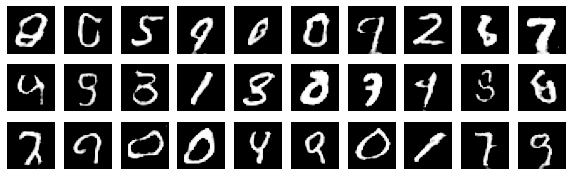

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 21 [0/60160]		D-Loss: 0.966239	G-Loss: 1.159989
Train | Epoch: 21 [12800/60160]		D-Loss: 0.979067	G-Loss: 1.075346
Train | Epoch: 21 [25600/60160]		D-Loss: 1.067662	G-Loss: 1.303684
Train | Epoch: 21 [38400/60160]		D-Loss: 1.037715	G-Loss: 1.263714
Train | Epoch: 21 [51200/60160]		D-Loss: 1.034551	G-Loss: 0.964536
====> Train | Epoch: 21 	 | 	Average D-loss: 1.0449 	 | 	Average G-loss: 1.1346
====> Test | Average D-loss: 1.2245 	 | 	Average G-loss: 1.8028


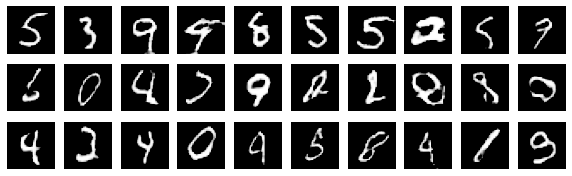

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 22 [0/60160]		D-Loss: 1.228217	G-Loss: 0.625385
Train | Epoch: 22 [12800/60160]		D-Loss: 1.028656	G-Loss: 1.174833
Train | Epoch: 22 [25600/60160]		D-Loss: 1.006189	G-Loss: 1.152532
Train | Epoch: 22 [38400/60160]		D-Loss: 0.986914	G-Loss: 1.130843
Train | Epoch: 22 [51200/60160]		D-Loss: 1.029899	G-Loss: 1.178995
====> Train | Epoch: 22 	 | 	Average D-loss: 1.0403 	 | 	Average G-loss: 1.1255
====> Test | Average D-loss: 1.1804 	 | 	Average G-loss: 1.6792


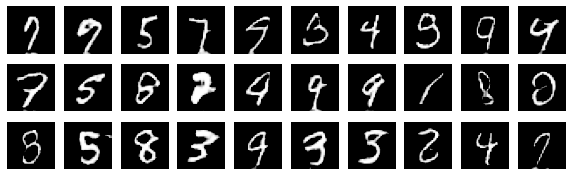

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 23 [0/60160]		D-Loss: 1.151433	G-Loss: 0.789979
Train | Epoch: 23 [12800/60160]		D-Loss: 1.073940	G-Loss: 1.468093
Train | Epoch: 23 [25600/60160]		D-Loss: 1.112277	G-Loss: 1.207829
Train | Epoch: 23 [38400/60160]		D-Loss: 1.004206	G-Loss: 1.149311
Train | Epoch: 23 [51200/60160]		D-Loss: 1.009432	G-Loss: 1.133958
====> Train | Epoch: 23 	 | 	Average D-loss: 1.0437 	 | 	Average G-loss: 1.1318
====> Test | Average D-loss: 1.0313 	 | 	Average G-loss: 0.9521


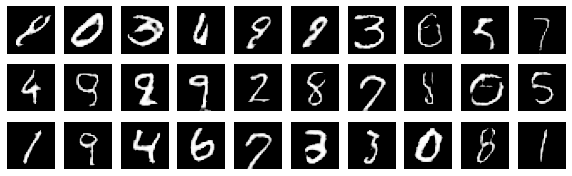

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 24 [0/60160]		D-Loss: 1.032453	G-Loss: 1.440898
Train | Epoch: 24 [12800/60160]		D-Loss: 1.037627	G-Loss: 1.257438
Train | Epoch: 24 [25600/60160]		D-Loss: 1.064752	G-Loss: 0.846240
Train | Epoch: 24 [38400/60160]		D-Loss: 0.980222	G-Loss: 1.223611
Train | Epoch: 24 [51200/60160]		D-Loss: 1.044931	G-Loss: 1.105665
====> Train | Epoch: 24 	 | 	Average D-loss: 1.0458 	 | 	Average G-loss: 1.1354
====> Test | Average D-loss: 1.0135 	 | 	Average G-loss: 1.1146


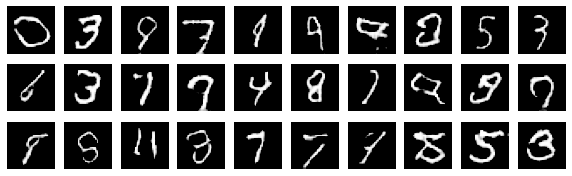

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 25 [0/60160]		D-Loss: 1.009687	G-Loss: 1.093668
Train | Epoch: 25 [12800/60160]		D-Loss: 1.009090	G-Loss: 0.922688
Train | Epoch: 25 [25600/60160]		D-Loss: 1.017637	G-Loss: 1.175436
Train | Epoch: 25 [38400/60160]		D-Loss: 1.059802	G-Loss: 0.902482
Train | Epoch: 25 [51200/60160]		D-Loss: 1.068751	G-Loss: 0.779341
====> Train | Epoch: 25 	 | 	Average D-loss: 1.0350 	 | 	Average G-loss: 1.1440
====> Test | Average D-loss: 0.9960 	 | 	Average G-loss: 1.0504


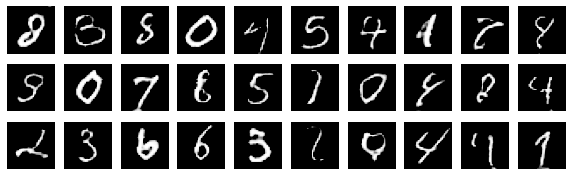

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 26 [0/60160]		D-Loss: 0.998163	G-Loss: 1.281125
Train | Epoch: 26 [12800/60160]		D-Loss: 1.005887	G-Loss: 0.927075
Train | Epoch: 26 [25600/60160]		D-Loss: 1.059852	G-Loss: 0.725677
Train | Epoch: 26 [38400/60160]		D-Loss: 1.030526	G-Loss: 1.071854
Train | Epoch: 26 [51200/60160]		D-Loss: 1.010089	G-Loss: 1.043828
====> Train | Epoch: 26 	 | 	Average D-loss: 1.0383 	 | 	Average G-loss: 1.1431
====> Test | Average D-loss: 1.0210 	 | 	Average G-loss: 1.1208


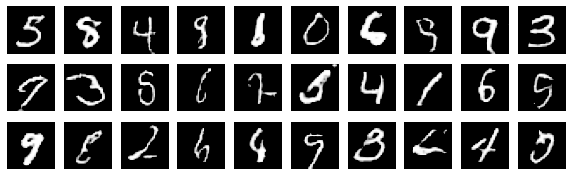

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 27 [0/60160]		D-Loss: 1.014281	G-Loss: 1.245775
Train | Epoch: 27 [12800/60160]		D-Loss: 1.002239	G-Loss: 0.844406
Train | Epoch: 27 [25600/60160]		D-Loss: 1.046661	G-Loss: 0.905572
Train | Epoch: 27 [38400/60160]		D-Loss: 1.009639	G-Loss: 1.212461
Train | Epoch: 27 [51200/60160]		D-Loss: 1.003955	G-Loss: 1.135021
====> Train | Epoch: 27 	 | 	Average D-loss: 1.0339 	 | 	Average G-loss: 1.1446
====> Test | Average D-loss: 1.0127 	 | 	Average G-loss: 0.9796


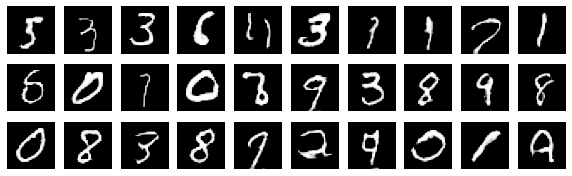

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 28 [0/60160]		D-Loss: 0.975606	G-Loss: 1.211425
Train | Epoch: 28 [12800/60160]		D-Loss: 1.142572	G-Loss: 1.524755
Train | Epoch: 28 [25600/60160]		D-Loss: 1.135631	G-Loss: 0.677332
Train | Epoch: 28 [38400/60160]		D-Loss: 1.035980	G-Loss: 0.930538
Train | Epoch: 28 [51200/60160]		D-Loss: 0.989619	G-Loss: 1.014107
====> Train | Epoch: 28 	 | 	Average D-loss: 1.0359 	 | 	Average G-loss: 1.1435
====> Test | Average D-loss: 1.0302 	 | 	Average G-loss: 1.0926


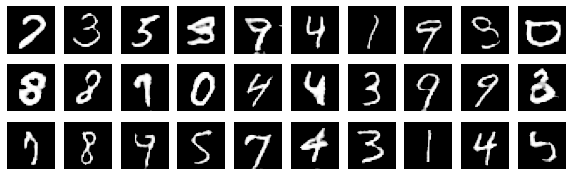

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 29 [0/60160]		D-Loss: 1.048261	G-Loss: 1.229615
Train | Epoch: 29 [12800/60160]		D-Loss: 1.162397	G-Loss: 1.394081
Train | Epoch: 29 [25600/60160]		D-Loss: 1.013353	G-Loss: 1.305148
Train | Epoch: 29 [38400/60160]		D-Loss: 0.972970	G-Loss: 1.337465
Train | Epoch: 29 [51200/60160]		D-Loss: 0.967915	G-Loss: 0.957535
====> Train | Epoch: 29 	 | 	Average D-loss: 1.0327 	 | 	Average G-loss: 1.1506
====> Test | Average D-loss: 1.1155 	 | 	Average G-loss: 0.7229


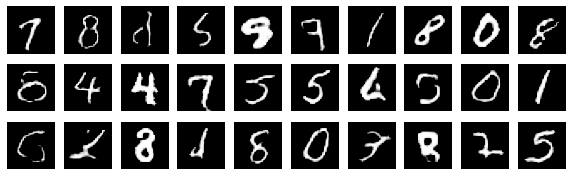

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 30 [0/60160]		D-Loss: 1.148867	G-Loss: 1.756737
Train | Epoch: 30 [12800/60160]		D-Loss: 0.965114	G-Loss: 1.307032
Train | Epoch: 30 [25600/60160]		D-Loss: 0.974424	G-Loss: 1.250376
Train | Epoch: 30 [38400/60160]		D-Loss: 1.003277	G-Loss: 1.088681
Train | Epoch: 30 [51200/60160]		D-Loss: 0.984138	G-Loss: 1.378031
====> Train | Epoch: 30 	 | 	Average D-loss: 1.0334 	 | 	Average G-loss: 1.1571
====> Test | Average D-loss: 1.1582 	 | 	Average G-loss: 0.6804


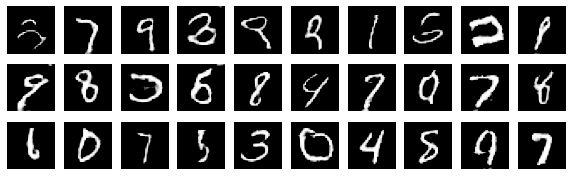

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 31 [0/60160]		D-Loss: 1.160784	G-Loss: 1.569909
Train | Epoch: 31 [12800/60160]		D-Loss: 1.046654	G-Loss: 1.171185
Train | Epoch: 31 [25600/60160]		D-Loss: 1.023603	G-Loss: 0.929434
Train | Epoch: 31 [38400/60160]		D-Loss: 1.061120	G-Loss: 1.226292
Train | Epoch: 31 [51200/60160]		D-Loss: 0.998756	G-Loss: 1.177686
====> Train | Epoch: 31 	 | 	Average D-loss: 1.0308 	 | 	Average G-loss: 1.1556
====> Test | Average D-loss: 1.0524 	 | 	Average G-loss: 0.8471


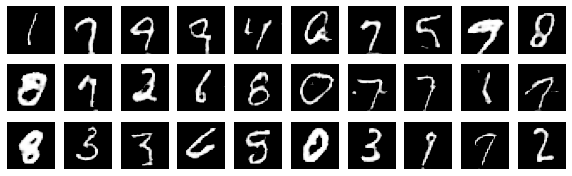

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 32 [0/60160]		D-Loss: 1.026038	G-Loss: 1.460518
Train | Epoch: 32 [12800/60160]		D-Loss: 1.023653	G-Loss: 1.384557
Train | Epoch: 32 [25600/60160]		D-Loss: 1.000075	G-Loss: 1.118713
Train | Epoch: 32 [38400/60160]		D-Loss: 1.052410	G-Loss: 0.903907
Train | Epoch: 32 [51200/60160]		D-Loss: 1.004143	G-Loss: 1.293971
====> Train | Epoch: 32 	 | 	Average D-loss: 1.0334 	 | 	Average G-loss: 1.1564
====> Test | Average D-loss: 1.0086 	 | 	Average G-loss: 1.0226


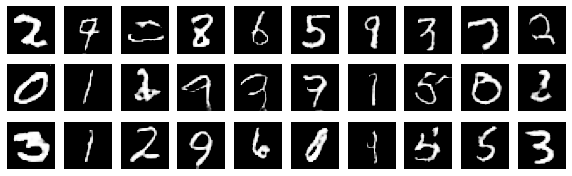

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 33 [0/60160]		D-Loss: 1.036718	G-Loss: 1.451171
Train | Epoch: 33 [12800/60160]		D-Loss: 0.977398	G-Loss: 1.019209
Train | Epoch: 33 [25600/60160]		D-Loss: 1.086414	G-Loss: 1.052366
Train | Epoch: 33 [38400/60160]		D-Loss: 1.035905	G-Loss: 1.338769
Train | Epoch: 33 [51200/60160]		D-Loss: 1.067337	G-Loss: 1.744304
====> Train | Epoch: 33 	 | 	Average D-loss: 1.0311 	 | 	Average G-loss: 1.1595
====> Test | Average D-loss: 1.1071 	 | 	Average G-loss: 0.7402


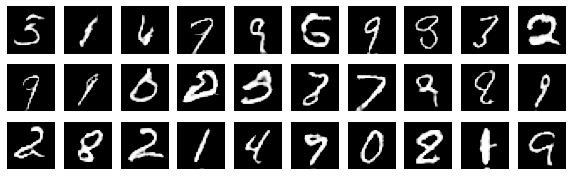

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 34 [0/60160]		D-Loss: 1.135238	G-Loss: 1.783285
Train | Epoch: 34 [12800/60160]		D-Loss: 0.995299	G-Loss: 1.040737
Train | Epoch: 34 [25600/60160]		D-Loss: 1.004294	G-Loss: 0.901751
Train | Epoch: 34 [38400/60160]		D-Loss: 0.981545	G-Loss: 1.257455
Train | Epoch: 34 [51200/60160]		D-Loss: 1.008944	G-Loss: 1.055353
====> Train | Epoch: 34 	 | 	Average D-loss: 1.0282 	 | 	Average G-loss: 1.1620
====> Test | Average D-loss: 1.0105 	 | 	Average G-loss: 1.0240


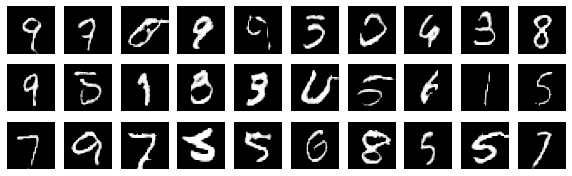

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 35 [0/60160]		D-Loss: 1.006325	G-Loss: 1.331736
Train | Epoch: 35 [12800/60160]		D-Loss: 1.008085	G-Loss: 1.145501
Train | Epoch: 35 [25600/60160]		D-Loss: 0.980084	G-Loss: 1.279348
Train | Epoch: 35 [38400/60160]		D-Loss: 1.037343	G-Loss: 1.186021
Train | Epoch: 35 [51200/60160]		D-Loss: 1.023636	G-Loss: 1.312505
====> Train | Epoch: 35 	 | 	Average D-loss: 1.0306 	 | 	Average G-loss: 1.1613
====> Test | Average D-loss: 1.0477 	 | 	Average G-loss: 0.8749


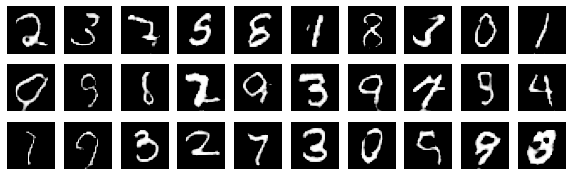

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 36 [0/60160]		D-Loss: 1.027905	G-Loss: 1.727115
Train | Epoch: 36 [12800/60160]		D-Loss: 1.045089	G-Loss: 0.823518
Train | Epoch: 36 [25600/60160]		D-Loss: 0.999185	G-Loss: 1.153791
Train | Epoch: 36 [38400/60160]		D-Loss: 0.968470	G-Loss: 1.242448
Train | Epoch: 36 [51200/60160]		D-Loss: 1.003805	G-Loss: 1.070117
====> Train | Epoch: 36 	 | 	Average D-loss: 1.0288 	 | 	Average G-loss: 1.1688
====> Test | Average D-loss: 1.0295 	 | 	Average G-loss: 1.0724


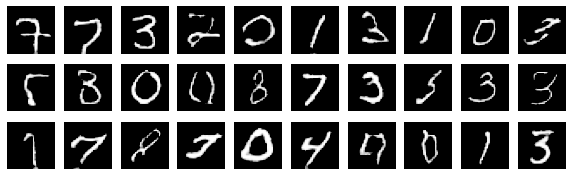

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 37 [0/60160]		D-Loss: 1.036678	G-Loss: 1.055097
Train | Epoch: 37 [12800/60160]		D-Loss: 0.990393	G-Loss: 1.178002
Train | Epoch: 37 [25600/60160]		D-Loss: 1.059745	G-Loss: 0.911256
Train | Epoch: 37 [38400/60160]		D-Loss: 1.047510	G-Loss: 1.119359
Train | Epoch: 37 [51200/60160]		D-Loss: 1.008950	G-Loss: 1.189731
====> Train | Epoch: 37 	 | 	Average D-loss: 1.0290 	 | 	Average G-loss: 1.1697
====> Test | Average D-loss: 1.0956 	 | 	Average G-loss: 0.7713


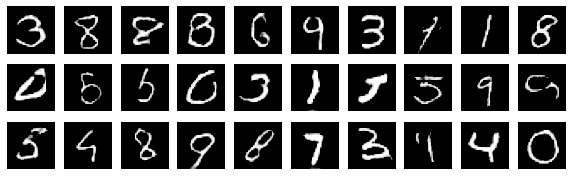

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 38 [0/60160]		D-Loss: 1.131446	G-Loss: 1.775637
Train | Epoch: 38 [12800/60160]		D-Loss: 1.178127	G-Loss: 1.631595
Train | Epoch: 38 [25600/60160]		D-Loss: 1.009560	G-Loss: 1.044158
Train | Epoch: 38 [38400/60160]		D-Loss: 1.089502	G-Loss: 0.962524
Train | Epoch: 38 [51200/60160]		D-Loss: 0.986374	G-Loss: 1.134465
====> Train | Epoch: 38 	 | 	Average D-loss: 1.0312 	 | 	Average G-loss: 1.1671
====> Test | Average D-loss: 1.0276 	 | 	Average G-loss: 1.0475


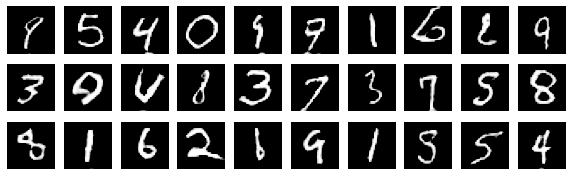

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 39 [0/60160]		D-Loss: 1.002755	G-Loss: 1.356208
Train | Epoch: 39 [12800/60160]		D-Loss: 0.989307	G-Loss: 1.140179
Train | Epoch: 39 [25600/60160]		D-Loss: 0.964246	G-Loss: 1.135690
Train | Epoch: 39 [38400/60160]		D-Loss: 1.079350	G-Loss: 1.065155
Train | Epoch: 39 [51200/60160]		D-Loss: 0.986392	G-Loss: 1.021827
====> Train | Epoch: 39 	 | 	Average D-loss: 1.0258 	 | 	Average G-loss: 1.1710
====> Test | Average D-loss: 1.0278 	 | 	Average G-loss: 1.1047


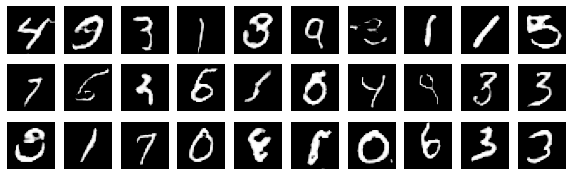

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 40 [0/60160]		D-Loss: 1.060474	G-Loss: 1.266002
Train | Epoch: 40 [12800/60160]		D-Loss: 1.022002	G-Loss: 1.073534
Train | Epoch: 40 [25600/60160]		D-Loss: 0.980699	G-Loss: 1.326676
Train | Epoch: 40 [38400/60160]		D-Loss: 1.004388	G-Loss: 1.238917
Train | Epoch: 40 [51200/60160]		D-Loss: 1.036340	G-Loss: 1.142314
====> Train | Epoch: 40 	 | 	Average D-loss: 1.0269 	 | 	Average G-loss: 1.1699
====> Test | Average D-loss: 1.0476 	 | 	Average G-loss: 0.9285


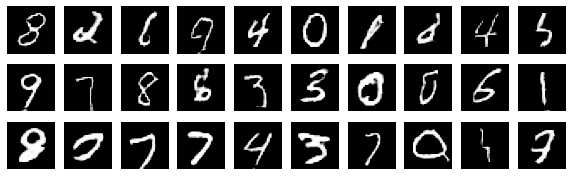

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 41 [0/60160]		D-Loss: 1.009822	G-Loss: 1.651445
Train | Epoch: 41 [12800/60160]		D-Loss: 1.074818	G-Loss: 0.890041
Train | Epoch: 41 [25600/60160]		D-Loss: 1.042562	G-Loss: 1.549866
Train | Epoch: 41 [38400/60160]		D-Loss: 1.033074	G-Loss: 1.395712
Train | Epoch: 41 [51200/60160]		D-Loss: 1.023219	G-Loss: 1.326958
====> Train | Epoch: 41 	 | 	Average D-loss: 1.0292 	 | 	Average G-loss: 1.1686
====> Test | Average D-loss: 1.0195 	 | 	Average G-loss: 1.1530


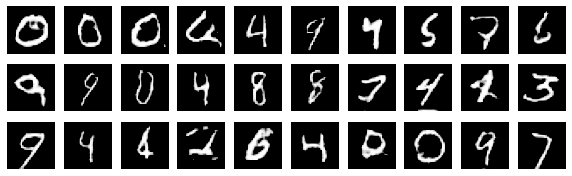

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 42 [0/60160]		D-Loss: 1.030209	G-Loss: 1.236591
Train | Epoch: 42 [12800/60160]		D-Loss: 1.106468	G-Loss: 1.638193
Train | Epoch: 42 [25600/60160]		D-Loss: 1.021068	G-Loss: 1.094646
Train | Epoch: 42 [38400/60160]		D-Loss: 1.028576	G-Loss: 1.303514
Train | Epoch: 42 [51200/60160]		D-Loss: 0.970012	G-Loss: 1.157073
====> Train | Epoch: 42 	 | 	Average D-loss: 1.0257 	 | 	Average G-loss: 1.1683
====> Test | Average D-loss: 1.0296 	 | 	Average G-loss: 1.2658


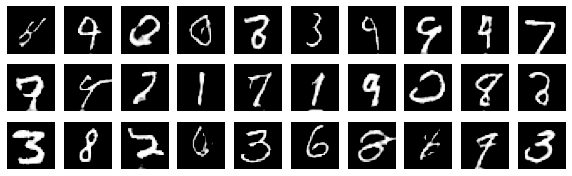

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 43 [0/60160]		D-Loss: 0.993039	G-Loss: 1.165125
Train | Epoch: 43 [12800/60160]		D-Loss: 1.098140	G-Loss: 0.725311
Train | Epoch: 43 [25600/60160]		D-Loss: 1.012698	G-Loss: 0.910938
Train | Epoch: 43 [38400/60160]		D-Loss: 1.010624	G-Loss: 0.892877
Train | Epoch: 43 [51200/60160]		D-Loss: 1.034481	G-Loss: 1.225513
====> Train | Epoch: 43 	 | 	Average D-loss: 1.0261 	 | 	Average G-loss: 1.1721
====> Test | Average D-loss: 1.0279 	 | 	Average G-loss: 1.0107


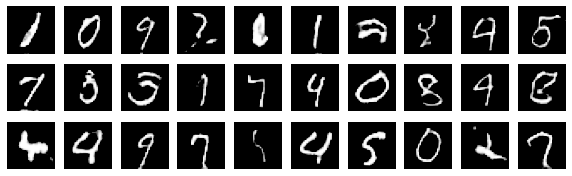

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 44 [0/60160]		D-Loss: 0.950745	G-Loss: 1.357829
Train | Epoch: 44 [12800/60160]		D-Loss: 1.068427	G-Loss: 1.177499
Train | Epoch: 44 [25600/60160]		D-Loss: 0.992885	G-Loss: 1.267834
Train | Epoch: 44 [38400/60160]		D-Loss: 0.984637	G-Loss: 1.228379
Train | Epoch: 44 [51200/60160]		D-Loss: 1.032185	G-Loss: 1.282815
====> Train | Epoch: 44 	 | 	Average D-loss: 1.0255 	 | 	Average G-loss: 1.1718
====> Test | Average D-loss: 1.0188 	 | 	Average G-loss: 1.0788


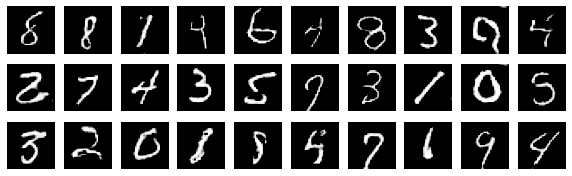

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 45 [0/60160]		D-Loss: 0.977243	G-Loss: 1.305094
Train | Epoch: 45 [12800/60160]		D-Loss: 1.005735	G-Loss: 0.903943
Train | Epoch: 45 [25600/60160]		D-Loss: 0.999962	G-Loss: 1.258398
Train | Epoch: 45 [38400/60160]		D-Loss: 1.086559	G-Loss: 0.863679
Train | Epoch: 45 [51200/60160]		D-Loss: 1.006713	G-Loss: 1.514905
====> Train | Epoch: 45 	 | 	Average D-loss: 1.0244 	 | 	Average G-loss: 1.1733
====> Test | Average D-loss: 1.0376 	 | 	Average G-loss: 1.0206


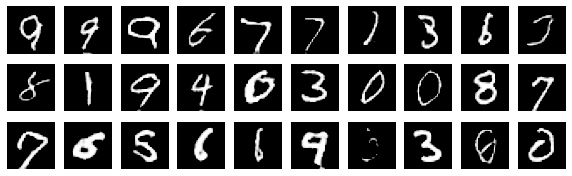

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 46 [0/60160]		D-Loss: 0.995167	G-Loss: 1.332125
Train | Epoch: 46 [12800/60160]		D-Loss: 0.958298	G-Loss: 1.054271
Train | Epoch: 46 [25600/60160]		D-Loss: 0.966375	G-Loss: 1.029745
Train | Epoch: 46 [38400/60160]		D-Loss: 0.958259	G-Loss: 1.337417
Train | Epoch: 46 [51200/60160]		D-Loss: 1.061767	G-Loss: 1.568595
====> Train | Epoch: 46 	 | 	Average D-loss: 1.0204 	 | 	Average G-loss: 1.1755
====> Test | Average D-loss: 1.0518 	 | 	Average G-loss: 1.3655


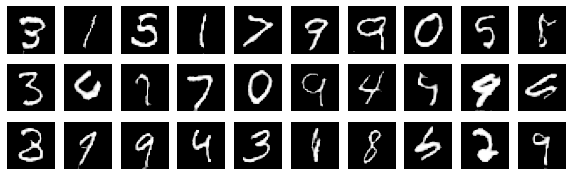

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 47 [0/60160]		D-Loss: 1.011146	G-Loss: 1.064095
Train | Epoch: 47 [12800/60160]		D-Loss: 1.040636	G-Loss: 1.571340
Train | Epoch: 47 [25600/60160]		D-Loss: 1.030676	G-Loss: 1.453150
Train | Epoch: 47 [38400/60160]		D-Loss: 1.012875	G-Loss: 1.090459
Train | Epoch: 47 [51200/60160]		D-Loss: 1.000095	G-Loss: 1.547998
====> Train | Epoch: 47 	 | 	Average D-loss: 1.0187 	 | 	Average G-loss: 1.1831
====> Test | Average D-loss: 1.0923 	 | 	Average G-loss: 0.8131


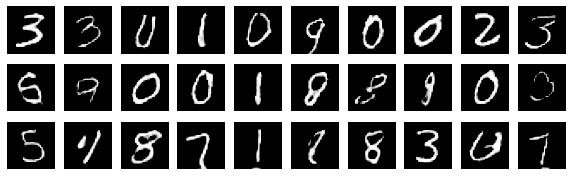

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 48 [0/60160]		D-Loss: 1.018500	G-Loss: 1.571927
Train | Epoch: 48 [12800/60160]		D-Loss: 1.035592	G-Loss: 1.521731
Train | Epoch: 48 [25600/60160]		D-Loss: 0.976666	G-Loss: 1.293127
Train | Epoch: 48 [38400/60160]		D-Loss: 1.013908	G-Loss: 1.095383
Train | Epoch: 48 [51200/60160]		D-Loss: 1.046656	G-Loss: 1.310515
====> Train | Epoch: 48 	 | 	Average D-loss: 1.0224 	 | 	Average G-loss: 1.1833
====> Test | Average D-loss: 1.0563 	 | 	Average G-loss: 0.8827


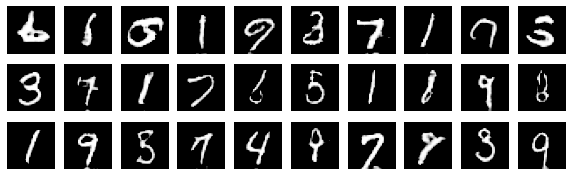

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 49 [0/60160]		D-Loss: 1.026344	G-Loss: 1.640697
Train | Epoch: 49 [12800/60160]		D-Loss: 1.048883	G-Loss: 1.378149
Train | Epoch: 49 [25600/60160]		D-Loss: 1.018017	G-Loss: 1.080807
Train | Epoch: 49 [38400/60160]		D-Loss: 0.980584	G-Loss: 1.406275
Train | Epoch: 49 [51200/60160]		D-Loss: 0.990734	G-Loss: 1.076588
====> Train | Epoch: 49 	 | 	Average D-loss: 1.0191 	 | 	Average G-loss: 1.1815
====> Test | Average D-loss: 1.0334 	 | 	Average G-loss: 0.9652


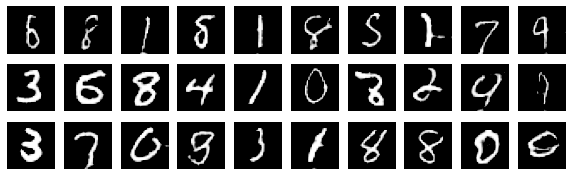

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 50 [0/60160]		D-Loss: 1.024050	G-Loss: 1.491445
Train | Epoch: 50 [12800/60160]		D-Loss: 0.987985	G-Loss: 1.003329
Train | Epoch: 50 [25600/60160]		D-Loss: 1.049744	G-Loss: 0.850716
Train | Epoch: 50 [38400/60160]		D-Loss: 1.068809	G-Loss: 1.077506
Train | Epoch: 50 [51200/60160]		D-Loss: 1.040484	G-Loss: 1.273323
====> Train | Epoch: 50 	 | 	Average D-loss: 1.0183 	 | 	Average G-loss: 1.1873
====> Test | Average D-loss: 1.0372 	 | 	Average G-loss: 1.2442


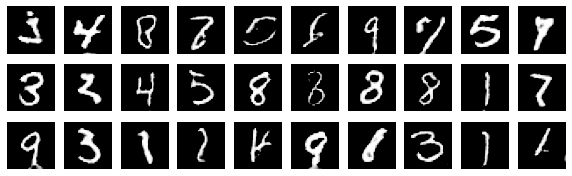

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 51 [0/60160]		D-Loss: 0.962857	G-Loss: 1.189490
Train | Epoch: 51 [12800/60160]		D-Loss: 1.040579	G-Loss: 0.956542
Train | Epoch: 51 [25600/60160]		D-Loss: 0.970278	G-Loss: 1.100064
Train | Epoch: 51 [38400/60160]		D-Loss: 0.993823	G-Loss: 1.312828
Train | Epoch: 51 [51200/60160]		D-Loss: 1.045182	G-Loss: 1.535111
====> Train | Epoch: 51 	 | 	Average D-loss: 1.0199 	 | 	Average G-loss: 1.1829
====> Test | Average D-loss: 1.0212 	 | 	Average G-loss: 1.0320


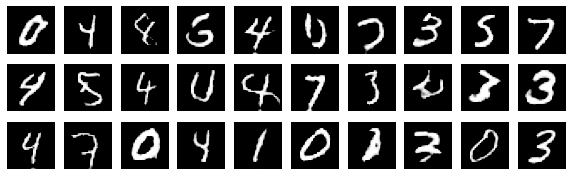

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 52 [0/60160]		D-Loss: 0.990271	G-Loss: 1.251640
Train | Epoch: 52 [12800/60160]		D-Loss: 1.073954	G-Loss: 1.288412
Train | Epoch: 52 [25600/60160]		D-Loss: 0.974896	G-Loss: 1.491186
Train | Epoch: 52 [38400/60160]		D-Loss: 1.056564	G-Loss: 0.896907
Train | Epoch: 52 [51200/60160]		D-Loss: 0.983380	G-Loss: 1.206345
====> Train | Epoch: 52 	 | 	Average D-loss: 1.0168 	 | 	Average G-loss: 1.1944
====> Test | Average D-loss: 1.0412 	 | 	Average G-loss: 1.2266


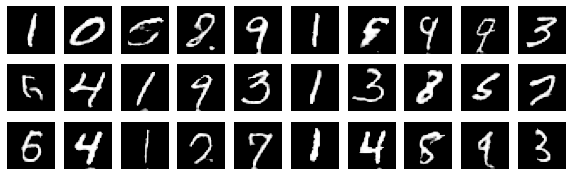

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 53 [0/60160]		D-Loss: 0.980689	G-Loss: 1.255358
Train | Epoch: 53 [12800/60160]		D-Loss: 0.947649	G-Loss: 1.161443
Train | Epoch: 53 [25600/60160]		D-Loss: 0.954754	G-Loss: 1.187439
Train | Epoch: 53 [38400/60160]		D-Loss: 1.108979	G-Loss: 1.533289
Train | Epoch: 53 [51200/60160]		D-Loss: 1.055483	G-Loss: 1.189565
====> Train | Epoch: 53 	 | 	Average D-loss: 1.0125 	 | 	Average G-loss: 1.1941
====> Test | Average D-loss: 1.0287 	 | 	Average G-loss: 1.1823


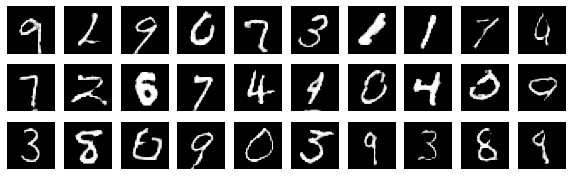

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 54 [0/60160]		D-Loss: 0.951180	G-Loss: 1.044326
Train | Epoch: 54 [12800/60160]		D-Loss: 1.022906	G-Loss: 0.955306
Train | Epoch: 54 [25600/60160]		D-Loss: 1.000993	G-Loss: 1.252784
Train | Epoch: 54 [38400/60160]		D-Loss: 0.979965	G-Loss: 0.965178
Train | Epoch: 54 [51200/60160]		D-Loss: 1.049439	G-Loss: 1.038232
====> Train | Epoch: 54 	 | 	Average D-loss: 1.0165 	 | 	Average G-loss: 1.1934
====> Test | Average D-loss: 1.0868 	 | 	Average G-loss: 1.5045


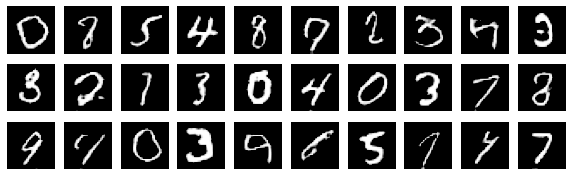

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 55 [0/60160]		D-Loss: 1.052038	G-Loss: 1.041888
Train | Epoch: 55 [12800/60160]		D-Loss: 1.036470	G-Loss: 0.926880
Train | Epoch: 55 [25600/60160]		D-Loss: 1.023623	G-Loss: 1.344897
Train | Epoch: 55 [38400/60160]		D-Loss: 0.979771	G-Loss: 1.140245
Train | Epoch: 55 [51200/60160]		D-Loss: 1.018974	G-Loss: 1.506060
====> Train | Epoch: 55 	 | 	Average D-loss: 1.0156 	 | 	Average G-loss: 1.1957
====> Test | Average D-loss: 1.0633 	 | 	Average G-loss: 0.8730


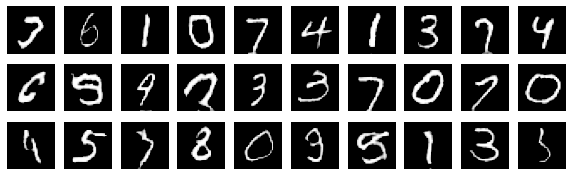

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 56 [0/60160]		D-Loss: 1.035053	G-Loss: 1.518779
Train | Epoch: 56 [12800/60160]		D-Loss: 1.039539	G-Loss: 0.987270
Train | Epoch: 56 [25600/60160]		D-Loss: 1.020085	G-Loss: 1.024491
Train | Epoch: 56 [38400/60160]		D-Loss: 1.082860	G-Loss: 1.641560
Train | Epoch: 56 [51200/60160]		D-Loss: 0.961005	G-Loss: 1.348574
====> Train | Epoch: 56 	 | 	Average D-loss: 1.0125 	 | 	Average G-loss: 1.1971
====> Test | Average D-loss: 1.0347 	 | 	Average G-loss: 1.0741


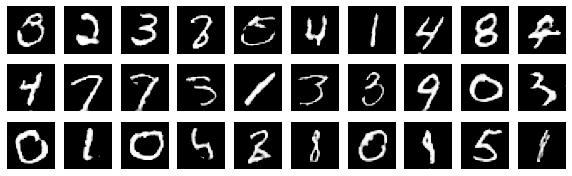

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 57 [0/60160]		D-Loss: 0.970267	G-Loss: 1.089582
Train | Epoch: 57 [12800/60160]		D-Loss: 0.984294	G-Loss: 1.115318
Train | Epoch: 57 [25600/60160]		D-Loss: 0.977422	G-Loss: 1.192511
Train | Epoch: 57 [38400/60160]		D-Loss: 1.064595	G-Loss: 1.689300
Train | Epoch: 57 [51200/60160]		D-Loss: 1.015374	G-Loss: 1.124308
====> Train | Epoch: 57 	 | 	Average D-loss: 1.0116 	 | 	Average G-loss: 1.2020
====> Test | Average D-loss: 1.0310 	 | 	Average G-loss: 1.1457


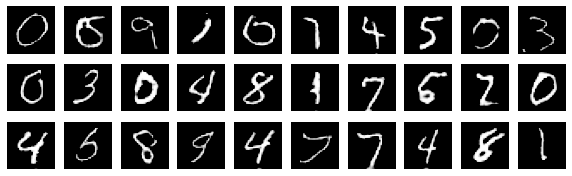

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 58 [0/60160]		D-Loss: 0.925503	G-Loss: 1.131606
Train | Epoch: 58 [12800/60160]		D-Loss: 1.073820	G-Loss: 0.978477
Train | Epoch: 58 [25600/60160]		D-Loss: 0.980045	G-Loss: 1.112052
Train | Epoch: 58 [38400/60160]		D-Loss: 0.995165	G-Loss: 0.991557
Train | Epoch: 58 [51200/60160]		D-Loss: 0.959009	G-Loss: 1.034108
====> Train | Epoch: 58 	 | 	Average D-loss: 1.0095 	 | 	Average G-loss: 1.2007
====> Test | Average D-loss: 1.0675 	 | 	Average G-loss: 1.4081


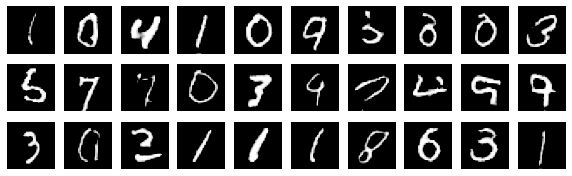

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 59 [0/60160]		D-Loss: 1.050039	G-Loss: 0.888087
Train | Epoch: 59 [12800/60160]		D-Loss: 1.043265	G-Loss: 0.885608
Train | Epoch: 59 [25600/60160]		D-Loss: 0.976519	G-Loss: 1.270635
Train | Epoch: 59 [38400/60160]		D-Loss: 1.020134	G-Loss: 1.658251
Train | Epoch: 59 [51200/60160]		D-Loss: 0.991783	G-Loss: 1.358936
====> Train | Epoch: 59 	 | 	Average D-loss: 1.0112 	 | 	Average G-loss: 1.2001
====> Test | Average D-loss: 1.0495 	 | 	Average G-loss: 0.9506


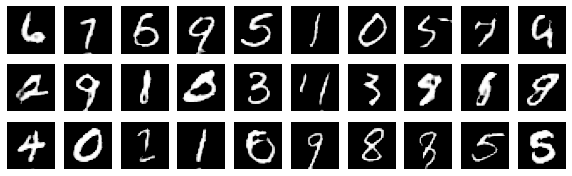

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 60 [0/60160]		D-Loss: 0.996920	G-Loss: 1.546468
Train | Epoch: 60 [12800/60160]		D-Loss: 0.970240	G-Loss: 1.105781
Train | Epoch: 60 [25600/60160]		D-Loss: 1.113589	G-Loss: 0.937232
Train | Epoch: 60 [38400/60160]		D-Loss: 1.066805	G-Loss: 1.659779
Train | Epoch: 60 [51200/60160]		D-Loss: 0.975551	G-Loss: 1.127582
====> Train | Epoch: 60 	 | 	Average D-loss: 1.0069 	 | 	Average G-loss: 1.1994
====> Test | Average D-loss: 1.0549 	 | 	Average G-loss: 0.9576


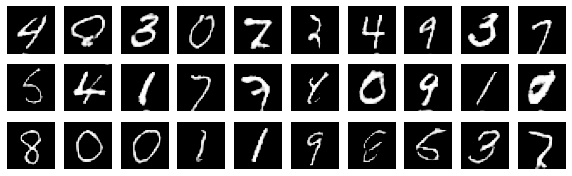

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 61 [0/60160]		D-Loss: 1.000281	G-Loss: 1.389681
Train | Epoch: 61 [12800/60160]		D-Loss: 0.976115	G-Loss: 1.121019
Train | Epoch: 61 [25600/60160]		D-Loss: 0.982440	G-Loss: 0.964395
Train | Epoch: 61 [38400/60160]		D-Loss: 0.931397	G-Loss: 1.341612
Train | Epoch: 61 [51200/60160]		D-Loss: 1.064790	G-Loss: 1.633713
====> Train | Epoch: 61 	 | 	Average D-loss: 1.0028 	 | 	Average G-loss: 1.2044
====> Test | Average D-loss: 1.0192 	 | 	Average G-loss: 1.0107


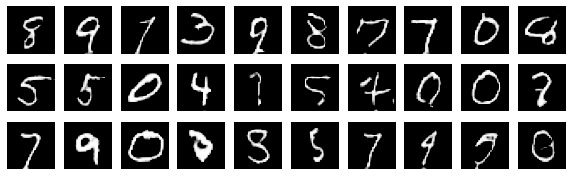

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 62 [0/60160]		D-Loss: 1.015352	G-Loss: 1.391729
Train | Epoch: 62 [12800/60160]		D-Loss: 1.075350	G-Loss: 1.671664
Train | Epoch: 62 [25600/60160]		D-Loss: 0.972433	G-Loss: 1.185911
Train | Epoch: 62 [38400/60160]		D-Loss: 1.055746	G-Loss: 1.182584
Train | Epoch: 62 [51200/60160]		D-Loss: 0.991231	G-Loss: 1.327564
====> Train | Epoch: 62 	 | 	Average D-loss: 1.0034 	 | 	Average G-loss: 1.2112
====> Test | Average D-loss: 1.0239 	 | 	Average G-loss: 1.2398


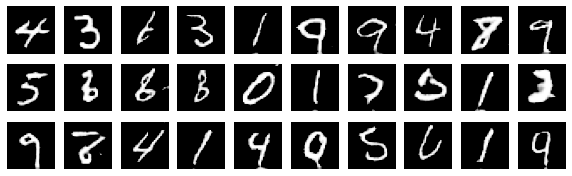

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 63 [0/60160]		D-Loss: 0.958972	G-Loss: 1.165311
Train | Epoch: 63 [12800/60160]		D-Loss: 1.046746	G-Loss: 0.869743
Train | Epoch: 63 [25600/60160]		D-Loss: 1.015652	G-Loss: 1.127276
Train | Epoch: 63 [38400/60160]		D-Loss: 0.950019	G-Loss: 1.333604
Train | Epoch: 63 [51200/60160]		D-Loss: 1.083071	G-Loss: 1.498155
====> Train | Epoch: 63 	 | 	Average D-loss: 1.0030 	 | 	Average G-loss: 1.2041
====> Test | Average D-loss: 1.0169 	 | 	Average G-loss: 1.1496


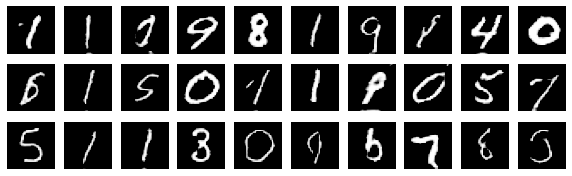

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 64 [0/60160]		D-Loss: 0.948786	G-Loss: 1.237564
Train | Epoch: 64 [12800/60160]		D-Loss: 0.975948	G-Loss: 1.025194
Train | Epoch: 64 [25600/60160]		D-Loss: 0.984685	G-Loss: 1.433440
Train | Epoch: 64 [38400/60160]		D-Loss: 1.061761	G-Loss: 1.503175
Train | Epoch: 64 [51200/60160]		D-Loss: 1.003239	G-Loss: 1.186521
====> Train | Epoch: 64 	 | 	Average D-loss: 1.0050 	 | 	Average G-loss: 1.2107
====> Test | Average D-loss: 0.9984 	 | 	Average G-loss: 1.0499


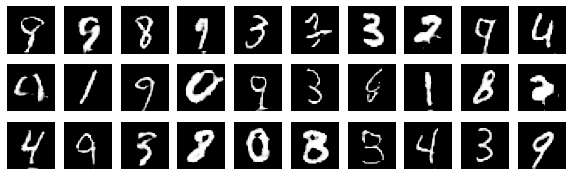

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 65 [0/60160]		D-Loss: 0.982139	G-Loss: 1.429676
Train | Epoch: 65 [12800/60160]		D-Loss: 1.042206	G-Loss: 1.220968
Train | Epoch: 65 [25600/60160]		D-Loss: 0.935386	G-Loss: 1.213685
Train | Epoch: 65 [38400/60160]		D-Loss: 0.999737	G-Loss: 1.336668
Train | Epoch: 65 [51200/60160]		D-Loss: 0.956971	G-Loss: 1.209664
====> Train | Epoch: 65 	 | 	Average D-loss: 1.0012 	 | 	Average G-loss: 1.2094
====> Test | Average D-loss: 1.0585 	 | 	Average G-loss: 0.8948


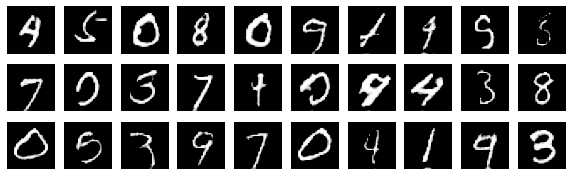

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 66 [0/60160]		D-Loss: 1.025467	G-Loss: 1.617941
Train | Epoch: 66 [12800/60160]		D-Loss: 1.028122	G-Loss: 0.863863
Train | Epoch: 66 [25600/60160]		D-Loss: 0.971578	G-Loss: 1.439709
Train | Epoch: 66 [38400/60160]		D-Loss: 1.030882	G-Loss: 1.410641
Train | Epoch: 66 [51200/60160]		D-Loss: 1.047776	G-Loss: 1.376176
====> Train | Epoch: 66 	 | 	Average D-loss: 0.9994 	 | 	Average G-loss: 1.2150
====> Test | Average D-loss: 1.0430 	 | 	Average G-loss: 1.0591


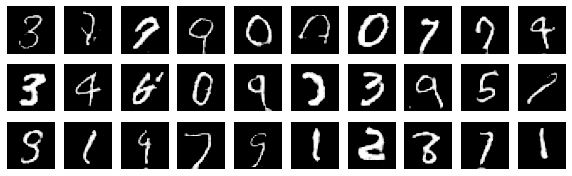

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 67 [0/60160]		D-Loss: 1.060659	G-Loss: 1.488600
Train | Epoch: 67 [12800/60160]		D-Loss: 1.011397	G-Loss: 1.342430
Train | Epoch: 67 [25600/60160]		D-Loss: 0.964317	G-Loss: 1.114393
Train | Epoch: 67 [38400/60160]		D-Loss: 1.090337	G-Loss: 1.451341
Train | Epoch: 67 [51200/60160]		D-Loss: 1.145780	G-Loss: 1.611163
====> Train | Epoch: 67 	 | 	Average D-loss: 0.9951 	 | 	Average G-loss: 1.2154
====> Test | Average D-loss: 1.0476 	 | 	Average G-loss: 0.9582


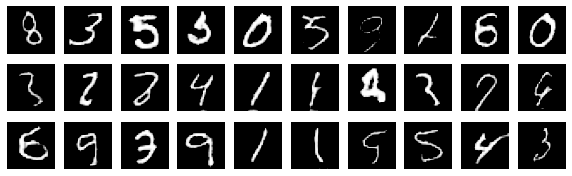

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 68 [0/60160]		D-Loss: 1.008995	G-Loss: 1.385090
Train | Epoch: 68 [12800/60160]		D-Loss: 1.015946	G-Loss: 1.162076
Train | Epoch: 68 [25600/60160]		D-Loss: 0.959304	G-Loss: 1.052530
Train | Epoch: 68 [38400/60160]		D-Loss: 0.972184	G-Loss: 1.246569
Train | Epoch: 68 [51200/60160]		D-Loss: 0.991621	G-Loss: 1.353461
====> Train | Epoch: 68 	 | 	Average D-loss: 0.9952 	 | 	Average G-loss: 1.2229
====> Test | Average D-loss: 1.0289 	 | 	Average G-loss: 0.9880


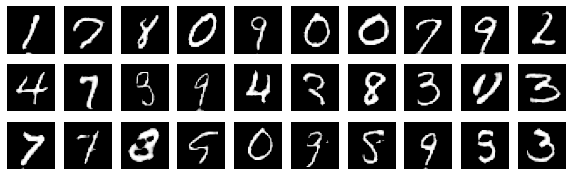

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 69 [0/60160]		D-Loss: 1.011032	G-Loss: 1.468457
Train | Epoch: 69 [12800/60160]		D-Loss: 0.995678	G-Loss: 1.473545
Train | Epoch: 69 [25600/60160]		D-Loss: 1.046351	G-Loss: 1.513861
Train | Epoch: 69 [38400/60160]		D-Loss: 0.968487	G-Loss: 1.297130
Train | Epoch: 69 [51200/60160]		D-Loss: 0.955804	G-Loss: 1.315431
====> Train | Epoch: 69 	 | 	Average D-loss: 0.9934 	 | 	Average G-loss: 1.2210
====> Test | Average D-loss: 0.9909 	 | 	Average G-loss: 1.1912


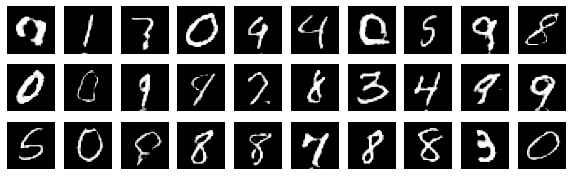

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 70 [0/60160]		D-Loss: 0.909359	G-Loss: 1.482984
Train | Epoch: 70 [12800/60160]		D-Loss: 0.977052	G-Loss: 1.152473
Train | Epoch: 70 [25600/60160]		D-Loss: 0.977346	G-Loss: 1.212654
Train | Epoch: 70 [38400/60160]		D-Loss: 0.995751	G-Loss: 1.524870
Train | Epoch: 70 [51200/60160]		D-Loss: 0.986018	G-Loss: 1.111987
====> Train | Epoch: 70 	 | 	Average D-loss: 0.9983 	 | 	Average G-loss: 1.2255
====> Test | Average D-loss: 1.0571 	 | 	Average G-loss: 1.3081


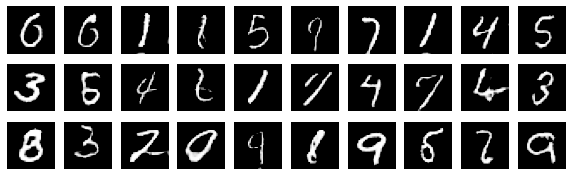

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 71 [0/60160]		D-Loss: 0.945622	G-Loss: 1.142810
Train | Epoch: 71 [12800/60160]		D-Loss: 0.921113	G-Loss: 1.137944
Train | Epoch: 71 [25600/60160]		D-Loss: 1.069831	G-Loss: 1.153530
Train | Epoch: 71 [38400/60160]		D-Loss: 1.002843	G-Loss: 1.090438
Train | Epoch: 71 [51200/60160]		D-Loss: 0.967660	G-Loss: 1.552623
====> Train | Epoch: 71 	 | 	Average D-loss: 0.9941 	 | 	Average G-loss: 1.2258
====> Test | Average D-loss: 1.0522 	 | 	Average G-loss: 1.2445


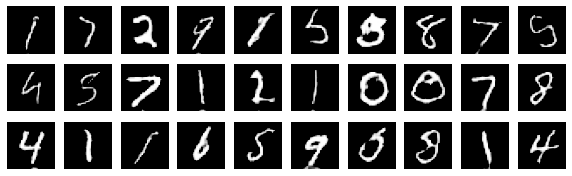

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 72 [0/60160]		D-Loss: 0.955500	G-Loss: 1.021400
Train | Epoch: 72 [12800/60160]		D-Loss: 0.940353	G-Loss: 1.184417
Train | Epoch: 72 [25600/60160]		D-Loss: 1.008215	G-Loss: 1.562801
Train | Epoch: 72 [38400/60160]		D-Loss: 0.950553	G-Loss: 1.135023
Train | Epoch: 72 [51200/60160]		D-Loss: 1.145182	G-Loss: 1.799452
====> Train | Epoch: 72 	 | 	Average D-loss: 0.9881 	 | 	Average G-loss: 1.2325
====> Test | Average D-loss: 1.1424 	 | 	Average G-loss: 1.6128


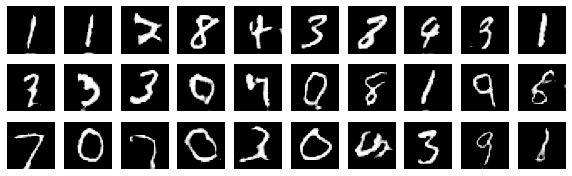

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 73 [0/60160]		D-Loss: 1.005021	G-Loss: 0.908439
Train | Epoch: 73 [12800/60160]		D-Loss: 1.091643	G-Loss: 0.799618
Train | Epoch: 73 [25600/60160]		D-Loss: 1.018551	G-Loss: 1.009013
Train | Epoch: 73 [38400/60160]		D-Loss: 0.972623	G-Loss: 1.267434
Train | Epoch: 73 [51200/60160]		D-Loss: 0.973030	G-Loss: 0.998185
====> Train | Epoch: 73 	 | 	Average D-loss: 0.9874 	 | 	Average G-loss: 1.2297
====> Test | Average D-loss: 1.0462 	 | 	Average G-loss: 0.8446


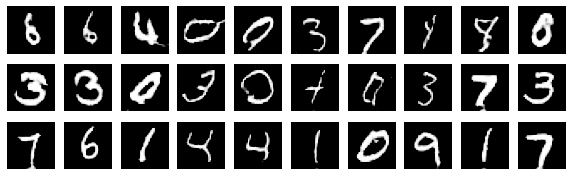

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 74 [0/60160]		D-Loss: 0.950202	G-Loss: 1.542880
Train | Epoch: 74 [12800/60160]		D-Loss: 1.031200	G-Loss: 1.185183
Train | Epoch: 74 [25600/60160]		D-Loss: 0.983764	G-Loss: 1.762880
Train | Epoch: 74 [38400/60160]		D-Loss: 0.975576	G-Loss: 1.153410
Train | Epoch: 74 [51200/60160]		D-Loss: 0.934412	G-Loss: 1.175238
====> Train | Epoch: 74 	 | 	Average D-loss: 0.9865 	 | 	Average G-loss: 1.2386
====> Test | Average D-loss: 1.0886 	 | 	Average G-loss: 1.4342


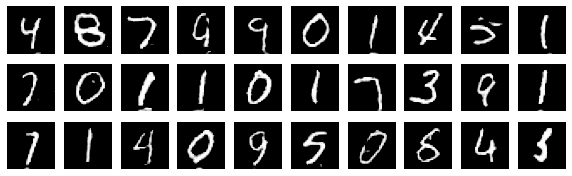

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 75 [0/60160]		D-Loss: 0.956625	G-Loss: 0.991051
Train | Epoch: 75 [12800/60160]		D-Loss: 0.999628	G-Loss: 1.400638
Train | Epoch: 75 [25600/60160]		D-Loss: 1.014082	G-Loss: 1.475620
Train | Epoch: 75 [38400/60160]		D-Loss: 0.958512	G-Loss: 1.343161
Train | Epoch: 75 [51200/60160]		D-Loss: 0.953770	G-Loss: 1.210135
====> Train | Epoch: 75 	 | 	Average D-loss: 0.9842 	 | 	Average G-loss: 1.2317
====> Test | Average D-loss: 1.0688 	 | 	Average G-loss: 0.8338


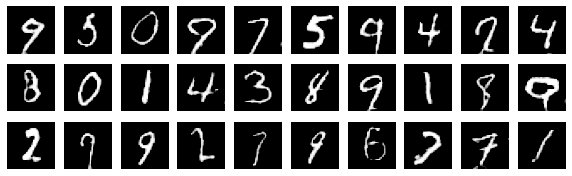

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 76 [0/60160]		D-Loss: 0.967685	G-Loss: 1.512105
Train | Epoch: 76 [12800/60160]		D-Loss: 1.018729	G-Loss: 0.809592
Train | Epoch: 76 [25600/60160]		D-Loss: 0.990076	G-Loss: 1.461505
Train | Epoch: 76 [38400/60160]		D-Loss: 1.007310	G-Loss: 1.343112
Train | Epoch: 76 [51200/60160]		D-Loss: 0.995339	G-Loss: 1.580180
====> Train | Epoch: 76 	 | 	Average D-loss: 0.9820 	 | 	Average G-loss: 1.2456
====> Test | Average D-loss: 1.0448 	 | 	Average G-loss: 1.3110


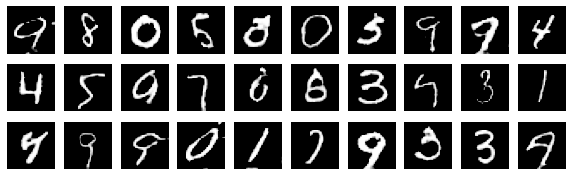

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 77 [0/60160]		D-Loss: 0.974284	G-Loss: 1.005577
Train | Epoch: 77 [12800/60160]		D-Loss: 1.129136	G-Loss: 1.838214
Train | Epoch: 77 [25600/60160]		D-Loss: 0.984211	G-Loss: 1.225930
Train | Epoch: 77 [38400/60160]		D-Loss: 1.096810	G-Loss: 1.026886
Train | Epoch: 77 [51200/60160]		D-Loss: 0.999469	G-Loss: 1.505696
====> Train | Epoch: 77 	 | 	Average D-loss: 0.9812 	 | 	Average G-loss: 1.2445
====> Test | Average D-loss: 1.0291 	 | 	Average G-loss: 0.9656


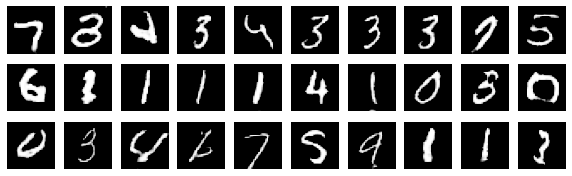

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 78 [0/60160]		D-Loss: 0.938157	G-Loss: 1.559955
Train | Epoch: 78 [12800/60160]		D-Loss: 0.972648	G-Loss: 1.151873
Train | Epoch: 78 [25600/60160]		D-Loss: 0.985273	G-Loss: 1.104688
Train | Epoch: 78 [38400/60160]		D-Loss: 0.935711	G-Loss: 1.179983
Train | Epoch: 78 [51200/60160]		D-Loss: 1.025310	G-Loss: 0.969992
====> Train | Epoch: 78 	 | 	Average D-loss: 0.9800 	 | 	Average G-loss: 1.2485
====> Test | Average D-loss: 1.0651 	 | 	Average G-loss: 1.4078


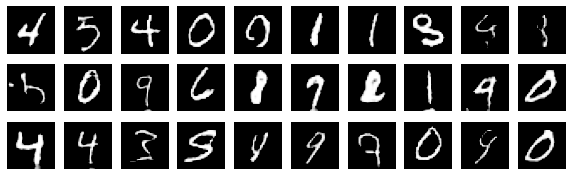

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 79 [0/60160]		D-Loss: 1.000143	G-Loss: 1.103808
Train | Epoch: 79 [12800/60160]		D-Loss: 0.993859	G-Loss: 0.943903
Train | Epoch: 79 [25600/60160]		D-Loss: 1.043299	G-Loss: 0.937191
Train | Epoch: 79 [38400/60160]		D-Loss: 0.949836	G-Loss: 1.649481
Train | Epoch: 79 [51200/60160]		D-Loss: 0.952686	G-Loss: 1.233282
====> Train | Epoch: 79 	 | 	Average D-loss: 0.9824 	 | 	Average G-loss: 1.2499
====> Test | Average D-loss: 1.0697 	 | 	Average G-loss: 0.9273


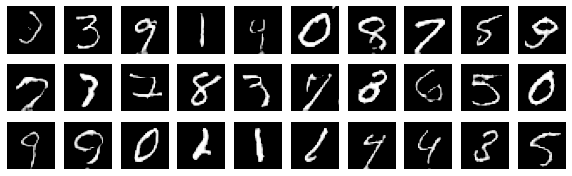

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 80 [0/60160]		D-Loss: 1.044482	G-Loss: 1.493106
Train | Epoch: 80 [12800/60160]		D-Loss: 1.009886	G-Loss: 1.426782
Train | Epoch: 80 [25600/60160]		D-Loss: 0.968679	G-Loss: 1.106787
Train | Epoch: 80 [38400/60160]		D-Loss: 1.044677	G-Loss: 1.513800
Train | Epoch: 80 [51200/60160]		D-Loss: 1.078673	G-Loss: 0.759855
====> Train | Epoch: 80 	 | 	Average D-loss: 0.9806 	 | 	Average G-loss: 1.2450
====> Test | Average D-loss: 1.0433 	 | 	Average G-loss: 1.0538


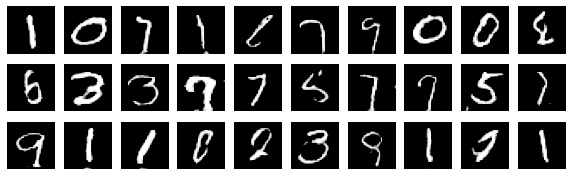

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 81 [0/60160]		D-Loss: 0.956806	G-Loss: 1.339323
Train | Epoch: 81 [12800/60160]		D-Loss: 0.963675	G-Loss: 1.256715
Train | Epoch: 81 [25600/60160]		D-Loss: 0.975503	G-Loss: 1.211101
Train | Epoch: 81 [38400/60160]		D-Loss: 0.973498	G-Loss: 1.099880
Train | Epoch: 81 [51200/60160]		D-Loss: 0.907660	G-Loss: 1.553846
====> Train | Epoch: 81 	 | 	Average D-loss: 0.9785 	 | 	Average G-loss: 1.2529
====> Test | Average D-loss: 1.0356 	 | 	Average G-loss: 1.1730


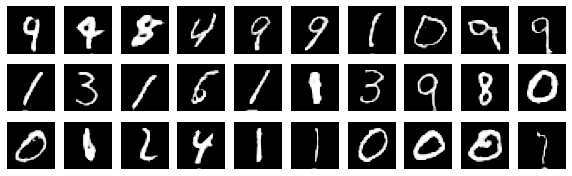

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 82 [0/60160]		D-Loss: 0.975134	G-Loss: 1.303867
Train | Epoch: 82 [12800/60160]		D-Loss: 1.063553	G-Loss: 1.769177
Train | Epoch: 82 [25600/60160]		D-Loss: 0.985376	G-Loss: 1.391129
Train | Epoch: 82 [38400/60160]		D-Loss: 1.003299	G-Loss: 1.210349
Train | Epoch: 82 [51200/60160]		D-Loss: 0.950213	G-Loss: 1.459769
====> Train | Epoch: 82 	 | 	Average D-loss: 0.9788 	 | 	Average G-loss: 1.2433
====> Test | Average D-loss: 1.0308 	 | 	Average G-loss: 1.3322


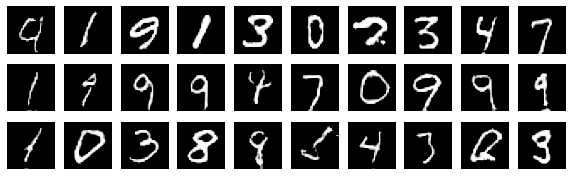

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 83 [0/60160]		D-Loss: 0.926570	G-Loss: 1.157267
Train | Epoch: 83 [12800/60160]		D-Loss: 1.049255	G-Loss: 0.956356
Train | Epoch: 83 [25600/60160]		D-Loss: 1.005814	G-Loss: 1.469394
Train | Epoch: 83 [38400/60160]		D-Loss: 1.000084	G-Loss: 1.607092
Train | Epoch: 83 [51200/60160]		D-Loss: 1.107389	G-Loss: 1.610625
====> Train | Epoch: 83 	 | 	Average D-loss: 0.9776 	 | 	Average G-loss: 1.2600
====> Test | Average D-loss: 1.0771 	 | 	Average G-loss: 1.5412


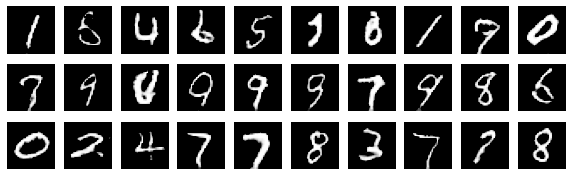

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 84 [0/60160]		D-Loss: 0.920851	G-Loss: 0.982500
Train | Epoch: 84 [12800/60160]		D-Loss: 0.958215	G-Loss: 1.401886
Train | Epoch: 84 [25600/60160]		D-Loss: 0.991194	G-Loss: 1.410323
Train | Epoch: 84 [38400/60160]		D-Loss: 0.991622	G-Loss: 1.787668
Train | Epoch: 84 [51200/60160]		D-Loss: 0.963382	G-Loss: 1.326294
====> Train | Epoch: 84 	 | 	Average D-loss: 0.9736 	 | 	Average G-loss: 1.2603
====> Test | Average D-loss: 1.0040 	 | 	Average G-loss: 1.0763


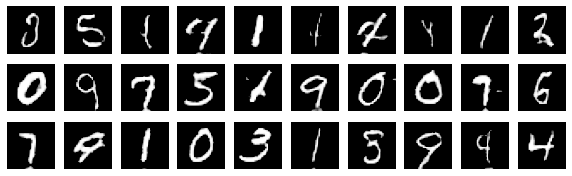

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 85 [0/60160]		D-Loss: 0.933944	G-Loss: 1.493987
Train | Epoch: 85 [12800/60160]		D-Loss: 0.968188	G-Loss: 1.026305
Train | Epoch: 85 [25600/60160]		D-Loss: 0.921816	G-Loss: 1.203278
Train | Epoch: 85 [38400/60160]		D-Loss: 0.952366	G-Loss: 1.241135
Train | Epoch: 85 [51200/60160]		D-Loss: 0.928671	G-Loss: 1.127335
====> Train | Epoch: 85 	 | 	Average D-loss: 0.9757 	 | 	Average G-loss: 1.2640
====> Test | Average D-loss: 1.0282 	 | 	Average G-loss: 1.2423


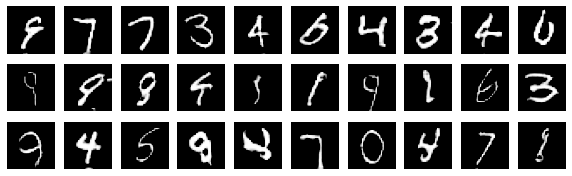

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 86 [0/60160]		D-Loss: 0.994955	G-Loss: 1.341880
Train | Epoch: 86 [12800/60160]		D-Loss: 0.968331	G-Loss: 1.063161
Train | Epoch: 86 [25600/60160]		D-Loss: 0.920740	G-Loss: 0.909947
Train | Epoch: 86 [38400/60160]		D-Loss: 1.009591	G-Loss: 1.343330
Train | Epoch: 86 [51200/60160]		D-Loss: 0.917585	G-Loss: 1.360620
====> Train | Epoch: 86 	 | 	Average D-loss: 0.9700 	 | 	Average G-loss: 1.2601
====> Test | Average D-loss: 1.0882 	 | 	Average G-loss: 1.5322


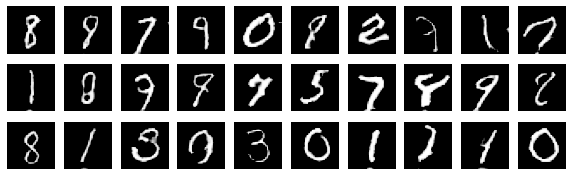

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 87 [0/60160]		D-Loss: 1.005189	G-Loss: 0.906690
Train | Epoch: 87 [12800/60160]		D-Loss: 1.003019	G-Loss: 0.873825
Train | Epoch: 87 [25600/60160]		D-Loss: 0.925978	G-Loss: 1.196677
Train | Epoch: 87 [38400/60160]		D-Loss: 0.986220	G-Loss: 1.229914
Train | Epoch: 87 [51200/60160]		D-Loss: 1.034310	G-Loss: 1.553686
====> Train | Epoch: 87 	 | 	Average D-loss: 0.9718 	 | 	Average G-loss: 1.2676
====> Test | Average D-loss: 1.0404 	 | 	Average G-loss: 1.0057


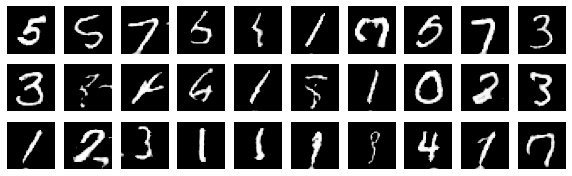

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 88 [0/60160]		D-Loss: 0.909734	G-Loss: 1.413575
Train | Epoch: 88 [12800/60160]		D-Loss: 0.905094	G-Loss: 1.225224
Train | Epoch: 88 [25600/60160]		D-Loss: 1.075121	G-Loss: 1.723596
Train | Epoch: 88 [38400/60160]		D-Loss: 0.896739	G-Loss: 1.477066
Train | Epoch: 88 [51200/60160]		D-Loss: 1.012811	G-Loss: 1.726197
====> Train | Epoch: 88 	 | 	Average D-loss: 0.9658 	 | 	Average G-loss: 1.2709
====> Test | Average D-loss: 1.1035 	 | 	Average G-loss: 0.7900


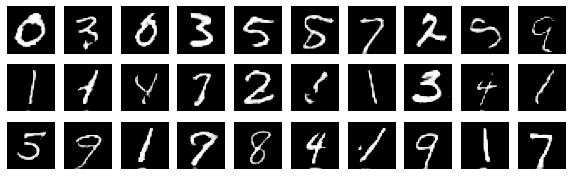

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 89 [0/60160]		D-Loss: 1.053196	G-Loss: 1.598528
Train | Epoch: 89 [12800/60160]		D-Loss: 1.080108	G-Loss: 1.675731
Train | Epoch: 89 [25600/60160]		D-Loss: 0.927125	G-Loss: 1.110967
Train | Epoch: 89 [38400/60160]		D-Loss: 1.002214	G-Loss: 0.928223
Train | Epoch: 89 [51200/60160]		D-Loss: 0.975314	G-Loss: 1.041513
====> Train | Epoch: 89 	 | 	Average D-loss: 0.9679 	 | 	Average G-loss: 1.2654
====> Test | Average D-loss: 1.0212 	 | 	Average G-loss: 1.1676


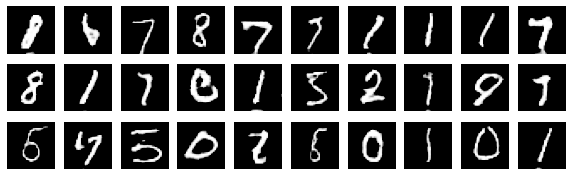

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 90 [0/60160]		D-Loss: 0.893640	G-Loss: 1.487172
Train | Epoch: 90 [12800/60160]		D-Loss: 0.978432	G-Loss: 1.068023
Train | Epoch: 90 [25600/60160]		D-Loss: 1.143841	G-Loss: 0.765963
Train | Epoch: 90 [38400/60160]		D-Loss: 0.891682	G-Loss: 1.469451
Train | Epoch: 90 [51200/60160]		D-Loss: 0.946941	G-Loss: 1.304009
====> Train | Epoch: 90 	 | 	Average D-loss: 0.9674 	 | 	Average G-loss: 1.2746
====> Test | Average D-loss: 1.0852 	 | 	Average G-loss: 1.5312


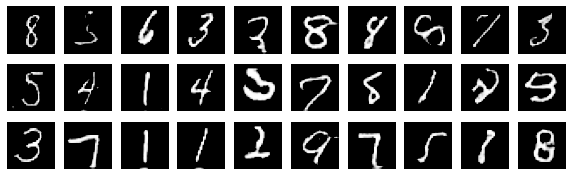

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 91 [0/60160]		D-Loss: 0.999706	G-Loss: 1.079922
Train | Epoch: 91 [12800/60160]		D-Loss: 0.926422	G-Loss: 1.559453
Train | Epoch: 91 [25600/60160]		D-Loss: 0.967796	G-Loss: 1.174719
Train | Epoch: 91 [38400/60160]		D-Loss: 0.907327	G-Loss: 1.252947
Train | Epoch: 91 [51200/60160]		D-Loss: 0.955394	G-Loss: 1.535207
====> Train | Epoch: 91 	 | 	Average D-loss: 0.9657 	 | 	Average G-loss: 1.2726
====> Test | Average D-loss: 1.0376 	 | 	Average G-loss: 1.1674


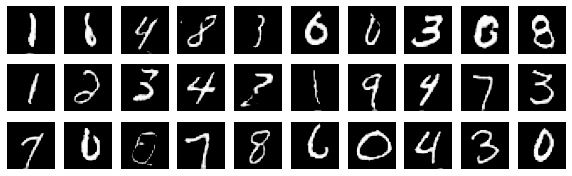

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 92 [0/60160]		D-Loss: 0.937780	G-Loss: 1.261600
Train | Epoch: 92 [12800/60160]		D-Loss: 1.001815	G-Loss: 0.958739
Train | Epoch: 92 [25600/60160]		D-Loss: 1.046328	G-Loss: 1.585706
Train | Epoch: 92 [38400/60160]		D-Loss: 0.940252	G-Loss: 1.227903
Train | Epoch: 92 [51200/60160]		D-Loss: 0.907341	G-Loss: 1.087272
====> Train | Epoch: 92 	 | 	Average D-loss: 0.9572 	 | 	Average G-loss: 1.2818
====> Test | Average D-loss: 1.0326 	 | 	Average G-loss: 1.5144


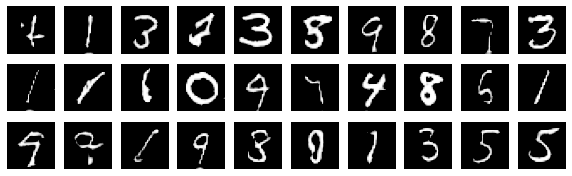

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 93 [0/60160]		D-Loss: 0.867478	G-Loss: 1.051553
Train | Epoch: 93 [12800/60160]		D-Loss: 0.916430	G-Loss: 1.166436
Train | Epoch: 93 [25600/60160]		D-Loss: 0.938587	G-Loss: 1.151255
Train | Epoch: 93 [38400/60160]		D-Loss: 0.959048	G-Loss: 1.084399
Train | Epoch: 93 [51200/60160]		D-Loss: 0.953746	G-Loss: 1.328987
====> Train | Epoch: 93 	 | 	Average D-loss: 0.9635 	 | 	Average G-loss: 1.2802
====> Test | Average D-loss: 1.0182 	 | 	Average G-loss: 1.0916


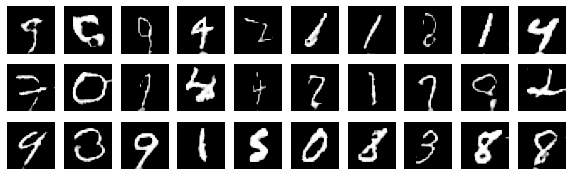

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 94 [0/60160]		D-Loss: 0.961990	G-Loss: 1.269978
Train | Epoch: 94 [12800/60160]		D-Loss: 0.981064	G-Loss: 1.216645
Train | Epoch: 94 [25600/60160]		D-Loss: 1.017691	G-Loss: 0.858418
Train | Epoch: 94 [38400/60160]		D-Loss: 0.907515	G-Loss: 1.241539
Train | Epoch: 94 [51200/60160]		D-Loss: 0.975685	G-Loss: 1.260947
====> Train | Epoch: 94 	 | 	Average D-loss: 0.9609 	 | 	Average G-loss: 1.2813
====> Test | Average D-loss: 1.0476 	 | 	Average G-loss: 1.0047


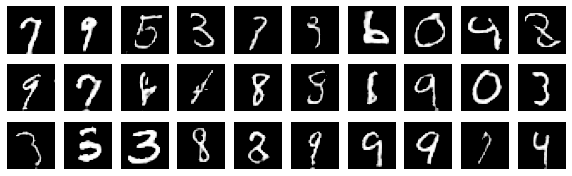

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 95 [0/60160]		D-Loss: 0.911402	G-Loss: 1.355636
Train | Epoch: 95 [12800/60160]		D-Loss: 0.949023	G-Loss: 1.422686
Train | Epoch: 95 [25600/60160]		D-Loss: 0.961776	G-Loss: 1.198780
Train | Epoch: 95 [38400/60160]		D-Loss: 1.028807	G-Loss: 1.738471
Train | Epoch: 95 [51200/60160]		D-Loss: 1.021663	G-Loss: 0.812798
====> Train | Epoch: 95 	 | 	Average D-loss: 0.9612 	 | 	Average G-loss: 1.2850
====> Test | Average D-loss: 1.1101 	 | 	Average G-loss: 1.7652


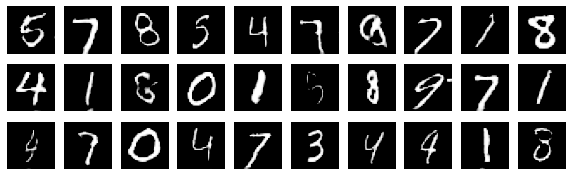

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 96 [0/60160]		D-Loss: 1.038457	G-Loss: 0.836276
Train | Epoch: 96 [12800/60160]		D-Loss: 0.927600	G-Loss: 1.420946
Train | Epoch: 96 [25600/60160]		D-Loss: 0.926671	G-Loss: 1.136614
Train | Epoch: 96 [38400/60160]		D-Loss: 0.962035	G-Loss: 0.941014
Train | Epoch: 96 [51200/60160]		D-Loss: 0.939740	G-Loss: 1.155268
====> Train | Epoch: 96 	 | 	Average D-loss: 0.9612 	 | 	Average G-loss: 1.2817
====> Test | Average D-loss: 1.0074 	 | 	Average G-loss: 1.1056


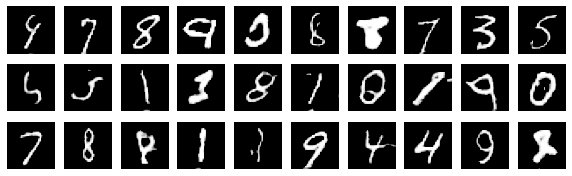

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 97 [0/60160]		D-Loss: 0.931643	G-Loss: 1.428435
Train | Epoch: 97 [12800/60160]		D-Loss: 0.971076	G-Loss: 1.601641
Train | Epoch: 97 [25600/60160]		D-Loss: 1.007650	G-Loss: 1.425420
Train | Epoch: 97 [38400/60160]		D-Loss: 1.017851	G-Loss: 1.579262
Train | Epoch: 97 [51200/60160]		D-Loss: 0.980034	G-Loss: 1.471635
====> Train | Epoch: 97 	 | 	Average D-loss: 0.9563 	 | 	Average G-loss: 1.2874
====> Test | Average D-loss: 1.0032 	 | 	Average G-loss: 1.2341


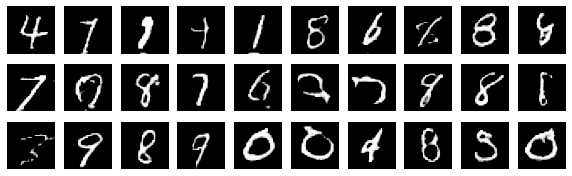

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 98 [0/60160]		D-Loss: 0.923128	G-Loss: 1.174494
Train | Epoch: 98 [12800/60160]		D-Loss: 0.945722	G-Loss: 1.322290
Train | Epoch: 98 [25600/60160]		D-Loss: 0.945297	G-Loss: 1.244890
Train | Epoch: 98 [38400/60160]		D-Loss: 0.933821	G-Loss: 1.419387
Train | Epoch: 98 [51200/60160]		D-Loss: 0.992792	G-Loss: 1.273061
====> Train | Epoch: 98 	 | 	Average D-loss: 0.9571 	 | 	Average G-loss: 1.2886
====> Test | Average D-loss: 1.0458 	 | 	Average G-loss: 1.0200


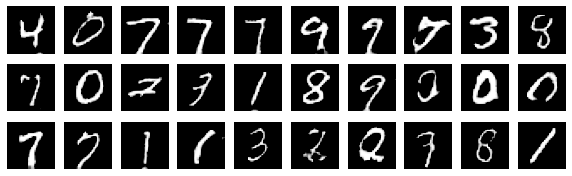

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 99 [0/60160]		D-Loss: 0.950910	G-Loss: 1.998628
Train | Epoch: 99 [12800/60160]		D-Loss: 0.921501	G-Loss: 1.103716
Train | Epoch: 99 [25600/60160]		D-Loss: 0.933466	G-Loss: 1.081576
Train | Epoch: 99 [38400/60160]		D-Loss: 1.000481	G-Loss: 1.067715
Train | Epoch: 99 [51200/60160]		D-Loss: 0.957504	G-Loss: 1.013779
====> Train | Epoch: 99 	 | 	Average D-loss: 0.9537 	 | 	Average G-loss: 1.2924
====> Test | Average D-loss: 1.0302 	 | 	Average G-loss: 1.2322


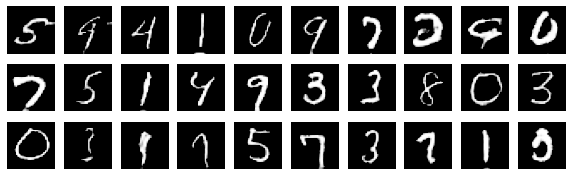

  0%|          | 0/235 [00:00<?, ?it/s]

Train | Epoch: 100 [0/60160]		D-Loss: 0.913088	G-Loss: 1.272689
Train | Epoch: 100 [12800/60160]		D-Loss: 0.947031	G-Loss: 1.524020
Train | Epoch: 100 [25600/60160]		D-Loss: 1.017459	G-Loss: 0.926341
Train | Epoch: 100 [38400/60160]		D-Loss: 0.926982	G-Loss: 1.315422
Train | Epoch: 100 [51200/60160]		D-Loss: 0.926158	G-Loss: 1.169715
====> Train | Epoch: 100 	 | 	Average D-loss: 0.9557 	 | 	Average G-loss: 1.2947
====> Test | Average D-loss: 1.0288 	 | 	Average G-loss: 0.9639


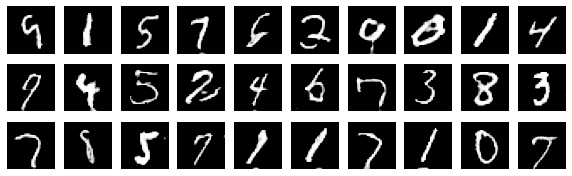

In [ ]:
#################### Problem 19 (1 points) ####################
# Tune `n_epoch`, `G_update_times` and `D_update_times`
####################################################
mnist_trainer.run(n_epoch=100, G_update_times=1, D_update_times=1, verbose=True) #Due to compute power limitations I couldn't do more epochs and get even better results
####################### End ########################

### 4.4.3) Final Visualization
It is an evaluating criteria for network architecture and parameter tuning (problems 16 to 19)

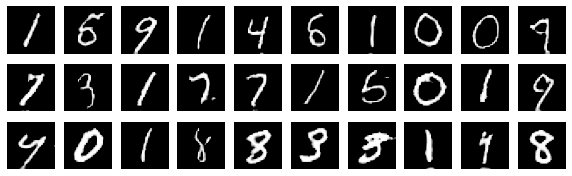

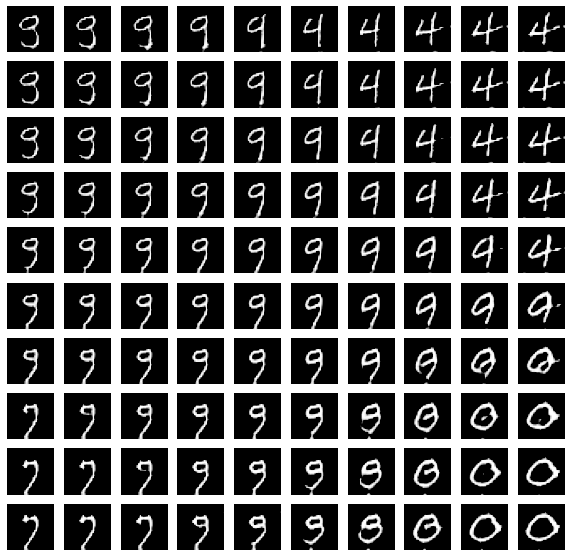

In [ ]:
mnist_visulization_helper_fn(mnist_trainer)
show_interpolations(mnist_trainer, 10, 10)

In [ ]:
#References:
#https://www.youtube.com/watch?v=TINZK94reEE
#https://www.youtube.com/watch?v=9zKuYvjFFS8
#https://wandb.ai/shambhavicodes/vae-gan/reports/An-Introduction-to-VAE-GANs--VmlldzoxMTcxMjM5
#Auto-Encoding Variational Bayes
#β-VAE: LEARNING BASIC VISUAL CONCEPTS WITH A CONSTRAINED VARIATIONAL FRAMEWORK
#https://www.youtube.com/watch?v=hq6V5i3Xrgk
#https://medium.com/@lishuo1/which-one-should-you-choose-gan-or-vae-part-i-da92acb4ab3e
#VEEGAN: Reducing Mode Collapse in GANs using Implicit Variational Learning
#https://www.youtube.com/watch?v=1tyWqK9z8DQ
#https://www.youtube.com/watch?v=1LGt5Bzs0O4
#https://jonathan-hui.medium.com/gan-unrolled-gan-how-to-reduce-mode-collapse-af5f2f7b51cd
#https://www.youtube.com/watch?v=T-lBMrjZ3_0&t=369s
#https://paperswithcode.com/task/image-to-image-translation
#https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence
#https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence
#https://cedar.buffalo.edu/~srihari/CSE676/22.3-GAN%20Mode%20Collapse.pdf
#Towards a Better Global Loss Landscape of GANs
#https://www.youtube.com/watch?v=_z9bdayg8ZI&t=12s
#https://www.youtube.com/watch?v=y8LGAhzCOxQ
#https://www.youtube.com/watch?v=aenOaiQPSYA
#https://towardsdatascience.com/derivative-of-the-sigmoid-function-536880cf918e